In [7]:
# import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from alstm import ALSTMModel
from nltk.corpus import stopwords
from text_preprocessor import TextPreprocessor
from training import train_model, evaluate_model
from preprocess import collate_fn, read_dataset, log_model_train_grid_search, plot_model_history, log_report_and_conf_mat,log_model_history, TextClassificationDataset
import os
import time
import numpy as np

In [8]:
import random

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if using multi-GPU

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [ ]:
g = torch.Generator()
g.manual_seed(42)

def create_new_data(use_stopwords, use_stemming, use_lemma):
    """
    Return train, validation, test loader, and text preprocessor
    """
    train_df = read_dataset('../dataset/trec_train.csv')
    train_df = train_df.dropna()
    test_df = read_dataset('../dataset/trec_test.csv')
    test_df = test_df.dropna()

    # drop all abbreviation
    drop_abbreviation=True
    if drop_abbreviation:
        train_df = train_df[train_df['coarse_label'] != 0]
        train_df['coarse_label'] = train_df['coarse_label'].apply(lambda x: x-1)
        test_df = test_df[test_df['coarse_label'] != 0]
        test_df['coarse_label'] = test_df['coarse_label'].apply(lambda x: x-1)
        label_names = ["ENTY", "DESC", "HUM", "LOC", "NUM"]
    else:
        label_names = ["ABBR", "ENTY", "DESC", "HUM", "LOC", "NUM"]

    train_texts = train_df['text'].values
    test_texts = test_df['text'].values

    train_labels = train_df['coarse_label'].values
    test_labels = test_df['coarse_label'].values

    X_test = test_texts
    y_test = test_labels

    # Further split training data into train and validation
    X_train, X_val, y_train, y_val = train_test_split(
        train_texts, train_labels, test_size=0.2, random_state=42, stratify=train_labels
    )

    # Preprocess text data
    # CONFIG
    stop = set(stopwords.words('english'))
    preprocessor = TextPreprocessor(stopwords=stop, max_vocab_size=10000, max_seq_length=50)
    trec_vocab = preprocessor.get_vocab_from_texts(
        [*X_test, *X_val, *X_train],
        use_stopwords=use_stopwords,
        use_lemmatization=use_lemma,
        use_stemming=use_stemming,
    )

    preprocessor.download_model(filter_from_vocab=trec_vocab, save_embedding=True)
    # preprocessor.fit([*X_train, *X_val, *X_test])
    print(f'Jumlah vocabulary/kosa kata: {preprocessor.vocab_size}')

    # Transform texts to sequences
    X_train_seq = preprocessor.transform(X_train, use_stopwords=use_stopwords, use_stemming=use_stemming, use_lemmatization=use_lemma)
    X_val_seq = preprocessor.transform(X_val, use_stopwords=use_stopwords, use_stemming=use_stemming, use_lemmatization=use_lemma)
    X_test_seq = preprocessor.transform(X_test, use_stopwords=use_stopwords, use_stemming=use_stemming, use_lemmatization=use_lemma)

    labels = len(label_names)
    labels_total = train_df['coarse_label'].value_counts().sort_index().values
    # imbalance dataset
    targets = []
    # targets += [[index] * labels_total[index] for index in range(labels)]
    for i in range(labels):
        targets += [i] * labels_total[i]

    # Create datasets
    train_dataset = TextClassificationDataset(X_train_seq, y_train)
    val_dataset = TextClassificationDataset(X_val_seq, y_val)
    test_dataset = TextClassificationDataset(X_test_seq, y_test)

    batch_size=50
    num_workers=0

    # Create data loaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        generator=g)
    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        collate_fn=collate_fn)
    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        num_workers=num_workers,
        collate_fn=collate_fn)
    
    return train_loader, val_loader, test_loader, preprocessor


In [10]:
# Scenario
scenario = {
    'vocabulary': [None, 'use_stopwords', 'use_stemming', 'use_lemma'],
    'drop_rate': [0.1, 0.3, 0.5],
    'learning_rate': [0.01, 0.001, 0.0001],
    'weight_decay': [0.01, 0.001, 0.0001],
    # 'n_heads': [1, 2, 3, 5, 6, 10, 15, 25, 30, 50, 75, 150],
}

# Set device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

label_names = ["ENTY", "DESC", "HUM", "LOC", "NUM"]

Using device: cuda:0


In [11]:
def update_current_scenario_vocab(active_scenario: dict, current_value):
    if current_value is None:
        for key in active_scenario.keys():
            if 'use' in key:
                active_scenario[key] = False
    else:
        for key in active_scenario.keys():
            if 'use' in key:
                if key == current_value:
                    active_scenario[key] = True
                else:
                    active_scenario[key] = False
    return active_scenario


Scenario 1: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.01}
Jumlah vocabulary/kosa kata: 8898
created new data with intervention: None
Starting training for scenario 1
early stopping implemented
traning is stopped by early stopping on epoch: 11
Test Loss: 1.1566, Test Acc: 0.4786

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.27      0.39      0.32        94
        DESC       0.64      0.99      0.77       138
         HUM       0.44      0.95      0.60        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.48       491
   macro avg       0.27      0.47      0.34       491
weighted avg       0.29      0.48      0.36       491


Confusion Matrix:
[[ 37  31  26   0   0]
 [  2 136   0   0   0]
 [  3   0  62   0   0]
 [ 36   7  38   0   0]
 [ 57  40  16   0   0]]
Test accuracy: 0.4786


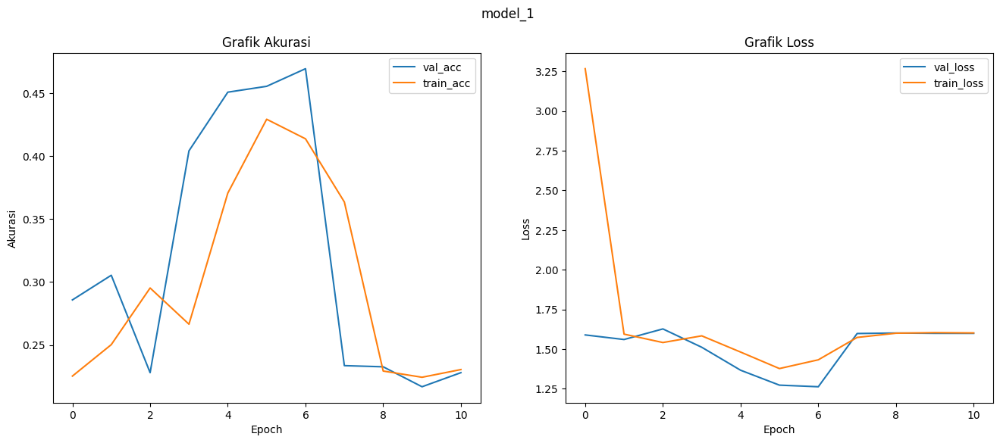

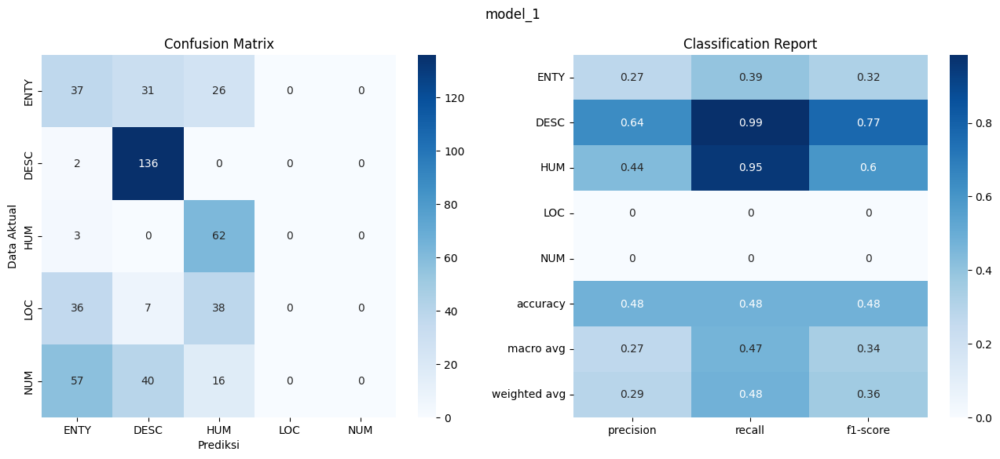

dict_values(['1', '1', '100', '11', 'None', '0.1', '0.01', '0.01', '8898', '1', '0.2306', '0.4786150712830957', '1.6015', '1.1566432379413767', '00:41'])
model logged

Scenario 2: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 2
early stopping implemented
traning is stopped by early stopping on epoch: 10
Test Loss: 1.4308, Test Acc: 0.5173

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.53      0.66      0.59        94
        DESC       0.90      0.94      0.92       138
         HUM       0.27      0.95      0.42        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.52       491
   macro avg       0.34      0.51      0.39       491
weighted avg       0.39      0.52      0.43       491


Confusion Matrix:
[[ 62   9  23   0   0]
 [  8 130   0   0   0]
 [  3   0  

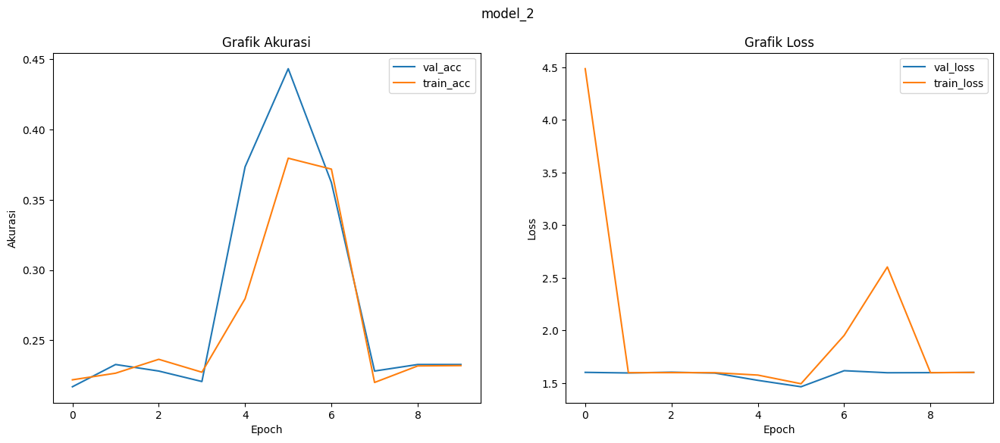

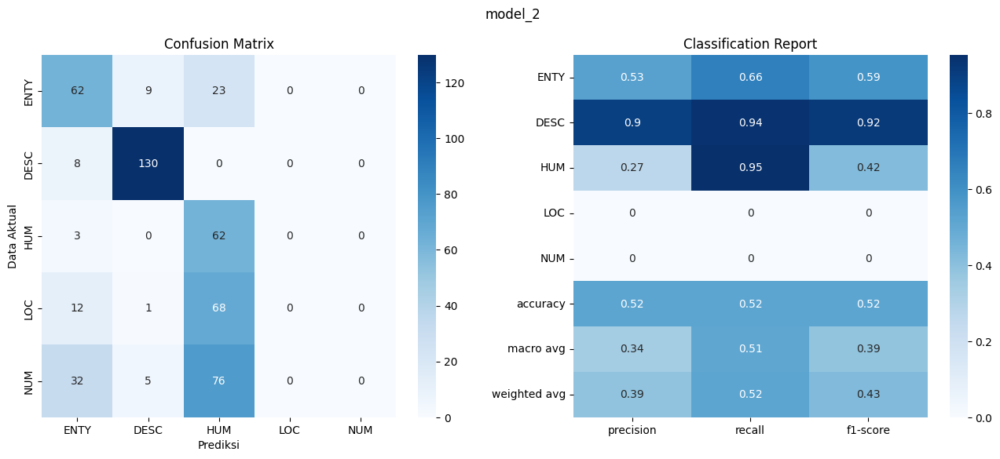

model logged

Scenario 3: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 3
early stopping implemented
traning is stopped by early stopping on epoch: 8
Test Loss: 1.3063, Test Acc: 0.2546

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.18      0.30      0.22        94
        DESC       0.46      0.20      0.27       138
         HUM       0.24      0.92      0.38        65
         LOC       0.00      0.00      0.00        81
         NUM       0.40      0.09      0.14       113

    accuracy                           0.25       491
   macro avg       0.26      0.30      0.20       491
weighted avg       0.29      0.25      0.20       491


Confusion Matrix:
[[28 24 37  0  5]
 [94 27  9  0  8]
 [ 4  0 60  0  1]
 [ 4  0 76  0  1]
 [29  8 66  0 10]]
Test accuracy: 0.2546


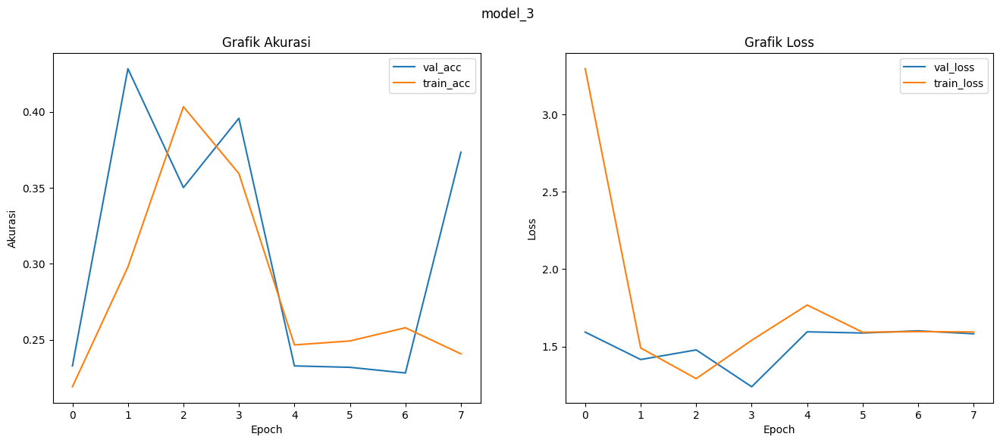

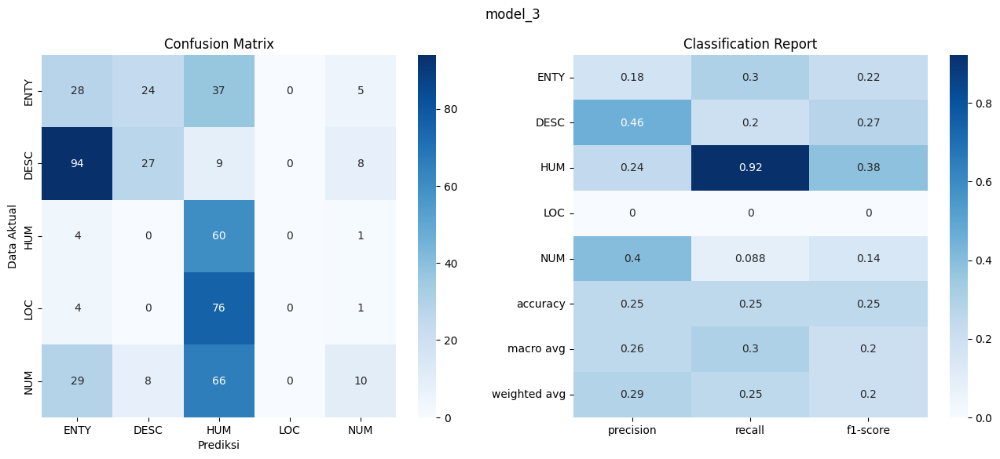

model logged

Scenario 4: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 4
early stopping implemented
traning is stopped by early stopping on epoch: 13
Test Loss: 0.2842, Test Acc: 0.9084

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.89      0.72      0.80        94
        DESC       0.91      0.96      0.94       138
         HUM       0.83      0.97      0.89        65
         LOC       0.91      0.96      0.93        81
         NUM       0.97      0.92      0.95       113

    accuracy                           0.91       491
   macro avg       0.90      0.91      0.90       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 68   8  10   6   2]
 [  4 133   0   0   1]
 [  2   0  63   0   0]
 [  1   0   2  78   0]
 [  1   5   1   2 104]]
Test accuracy: 0.9084


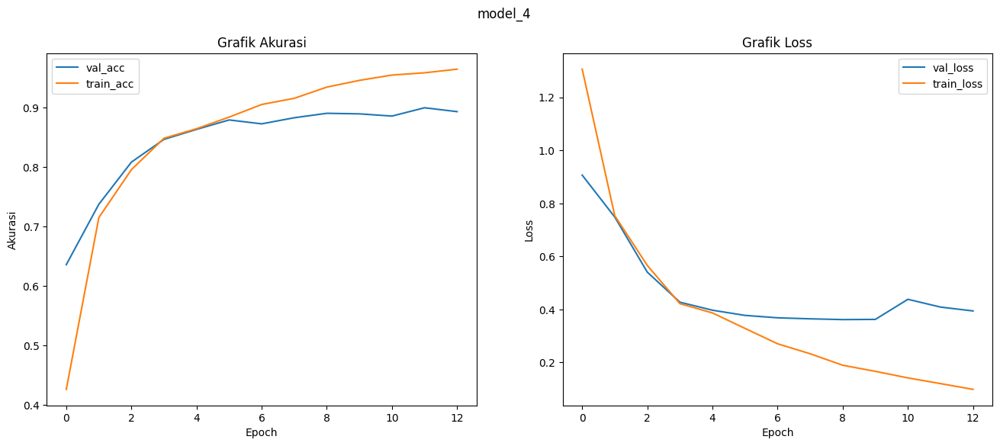

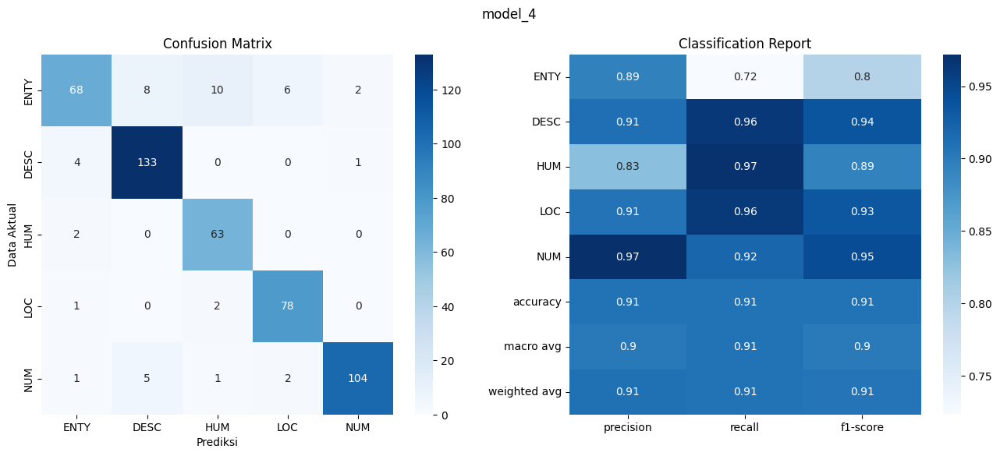

model logged

Scenario 5: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 5
early stopping implemented
traning is stopped by early stopping on epoch: 13
Test Loss: 0.3195, Test Acc: 0.9226

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.96      0.74      0.84        94
        DESC       0.88      0.99      0.93       138
         HUM       0.91      0.97      0.94        65
         LOC       0.92      0.95      0.93        81
         NUM       0.97      0.94      0.95       113

    accuracy                           0.92       491
   macro avg       0.93      0.92      0.92       491
weighted avg       0.93      0.92      0.92       491


Confusion Matrix:
[[ 70  11   6   5   2]
 [  1 137   0   0   0]
 [  1   0  63   1   0]
 [  1   2   0  77   1]
 [  0   6   0   1 106]]
Test accuracy: 0.9226


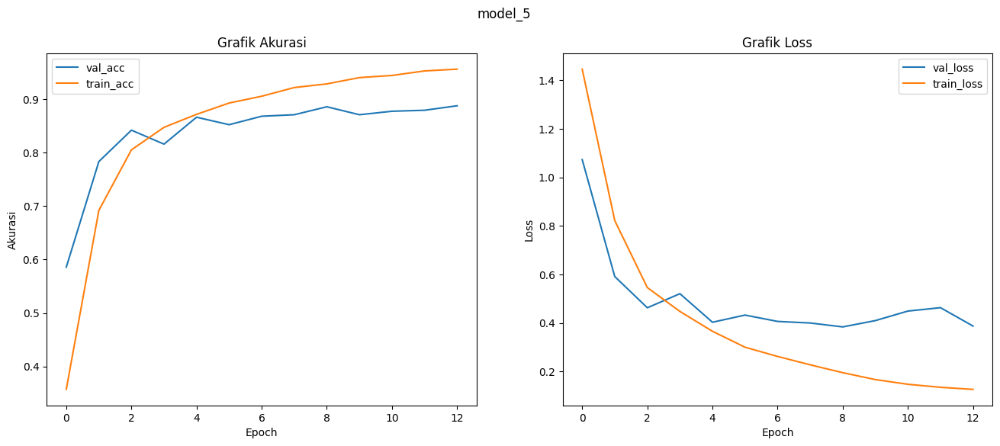

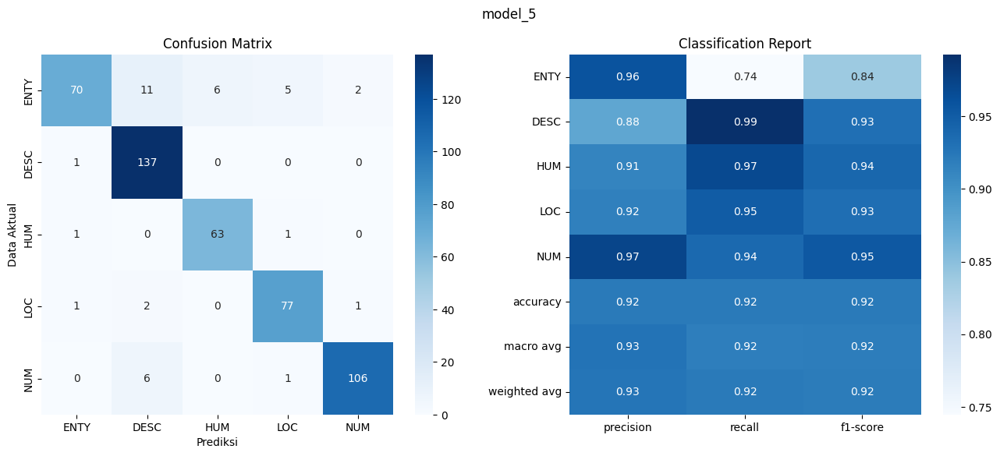

model logged

Scenario 6: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 6
early stopping implemented
traning is stopped by early stopping on epoch: 13
Test Loss: 0.3189, Test Acc: 0.8859

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.93      0.61      0.74        94
        DESC       0.79      0.97      0.87       138
         HUM       0.90      0.94      0.92        65
         LOC       0.94      0.96      0.95        81
         NUM       0.95      0.93      0.94       113

    accuracy                           0.89       491
   macro avg       0.90      0.88      0.88       491
weighted avg       0.90      0.89      0.88       491


Confusion Matrix:
[[ 57  24   7   3   3]
 [  2 134   0   0   2]
 [  2   1  61   1   0]
 [  0   3   0  78   0]
 [  0   7   0   1 105]]
Test accuracy: 0.8859


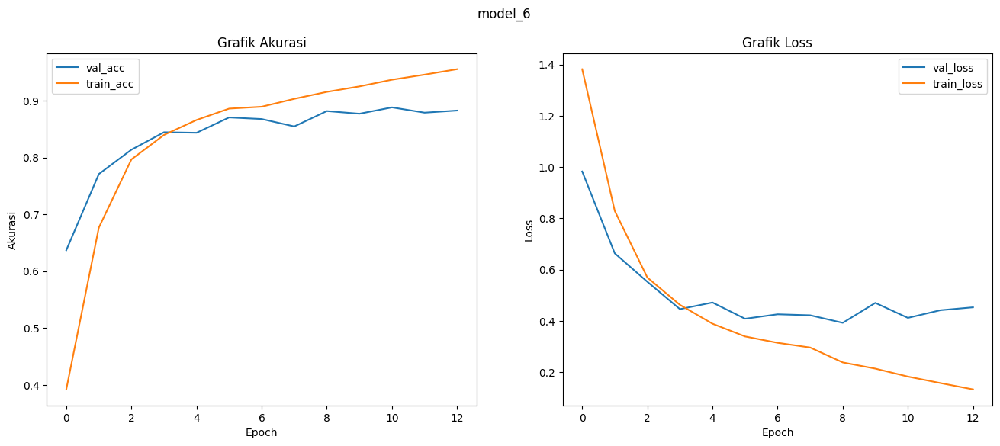

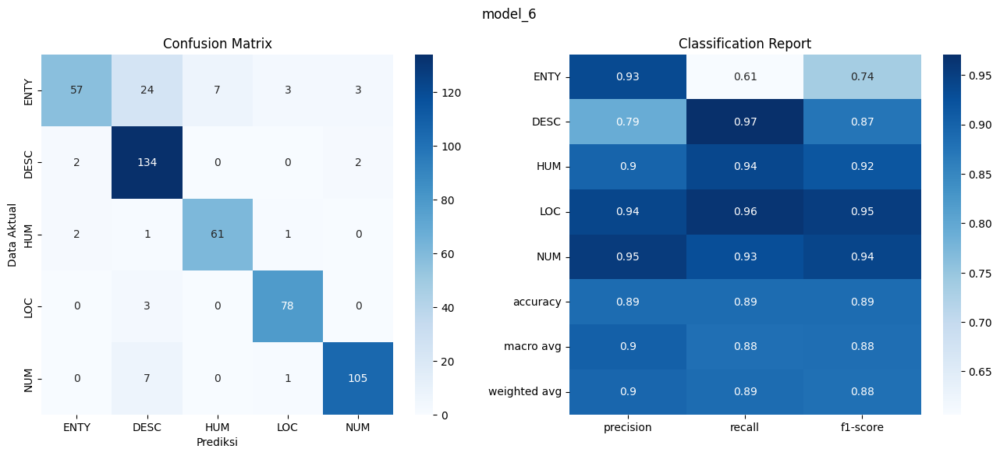

model logged

Scenario 7: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 7
early stopping implemented
traning is stopped by early stopping on epoch: 28
Test Loss: 0.3255, Test Acc: 0.8941

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.86      0.71      0.78        94
        DESC       0.88      0.93      0.90       138
         HUM       0.91      0.91      0.91        65
         LOC       0.89      0.96      0.92        81
         NUM       0.94      0.95      0.94       113

    accuracy                           0.89       491
   macro avg       0.89      0.89      0.89       491
weighted avg       0.89      0.89      0.89       491


Confusion Matrix:
[[ 67  12   6   6   3]
 [  7 128   0   0   3]
 [  2   1  59   3   0]
 [  2   0   0  78   1]
 [  0   5   0   1 107]]
Test accuracy: 0.8941


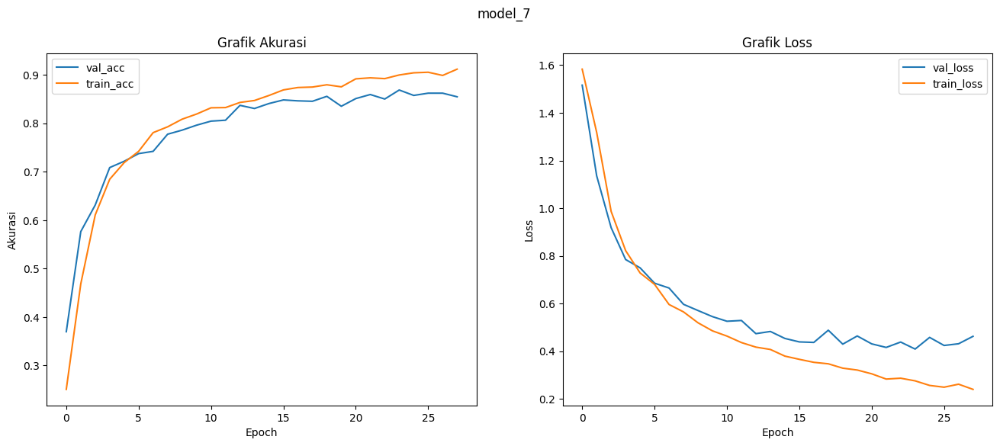

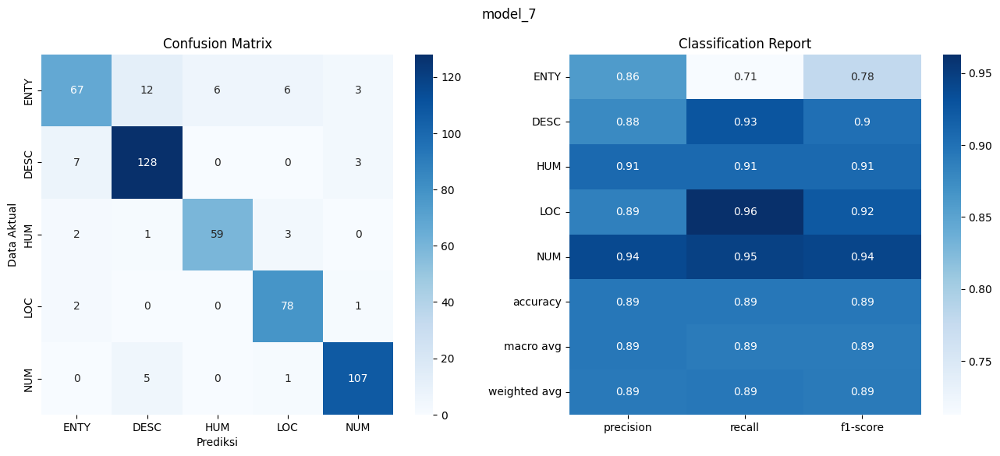

model logged

Scenario 8: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 8
early stopping implemented
traning is stopped by early stopping on epoch: 31
Test Loss: 0.3052, Test Acc: 0.9084

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.88      0.78      0.82        94
        DESC       0.88      0.94      0.91       138
         HUM       0.91      0.95      0.93        65
         LOC       0.93      0.94      0.93        81
         NUM       0.95      0.93      0.94       113

    accuracy                           0.91       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 73   9   5   4   3]
 [  6 130   1   0   1]
 [  1   2  62   0   0]
 [  3   1   0  76   1]
 [  0   6   0   2 105]]
Test accuracy: 0.9084


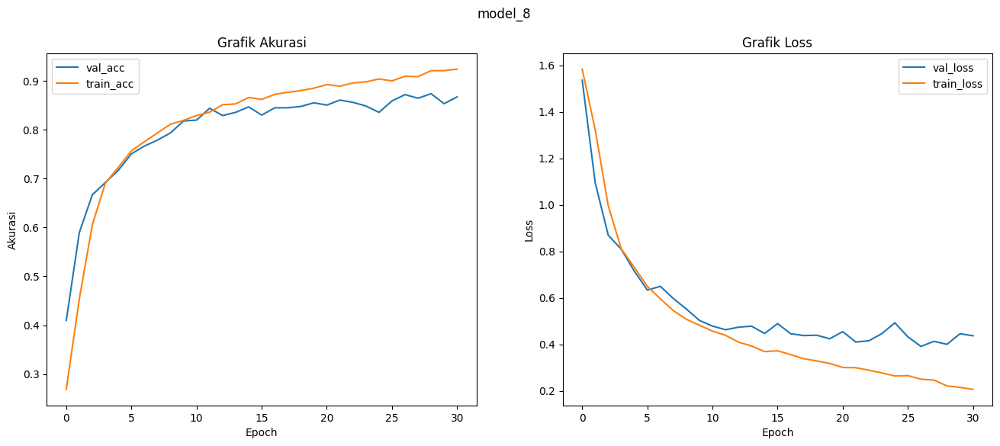

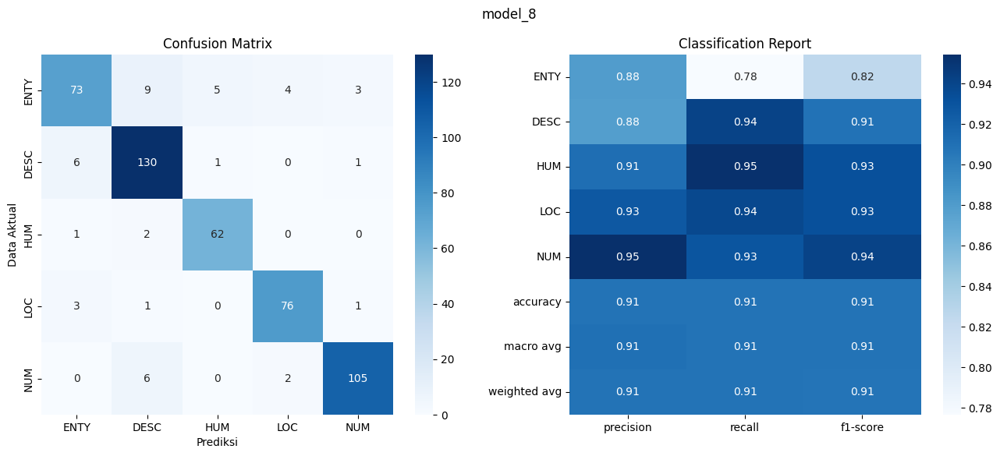

model logged

Scenario 9: {'vocabulary': None, 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 9
early stopping implemented
traning is stopped by early stopping on epoch: 23
Test Loss: 0.3431, Test Acc: 0.8880

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.83      0.74      0.79        94
        DESC       0.90      0.91      0.91       138
         HUM       0.92      0.91      0.91        65
         LOC       0.82      0.98      0.89        81
         NUM       0.95      0.90      0.93       113

    accuracy                           0.89       491
   macro avg       0.89      0.89      0.89       491
weighted avg       0.89      0.89      0.89       491


Confusion Matrix:
[[ 70   8   4   9   3]
 [  8 126   0   2   2]
 [  3   2  59   1   0]
 [  2   0   0  79   0]
 [  1   4   1   5 102]]
Test accuracy: 0.8880


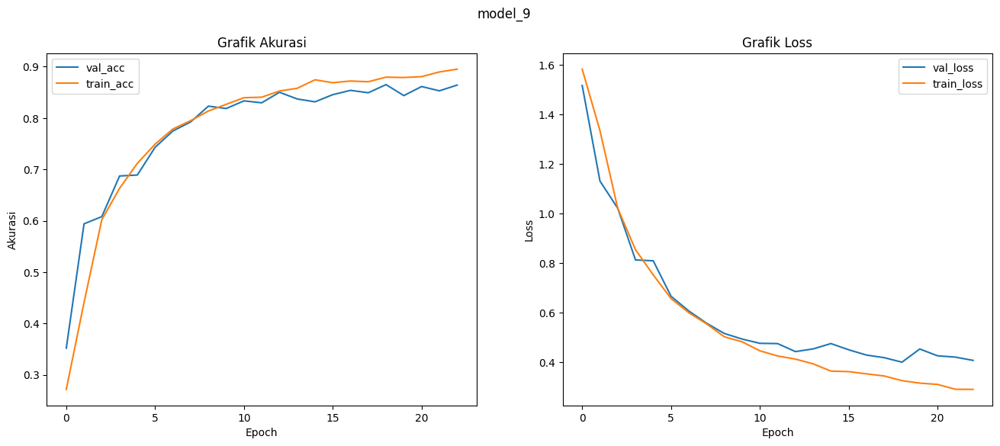

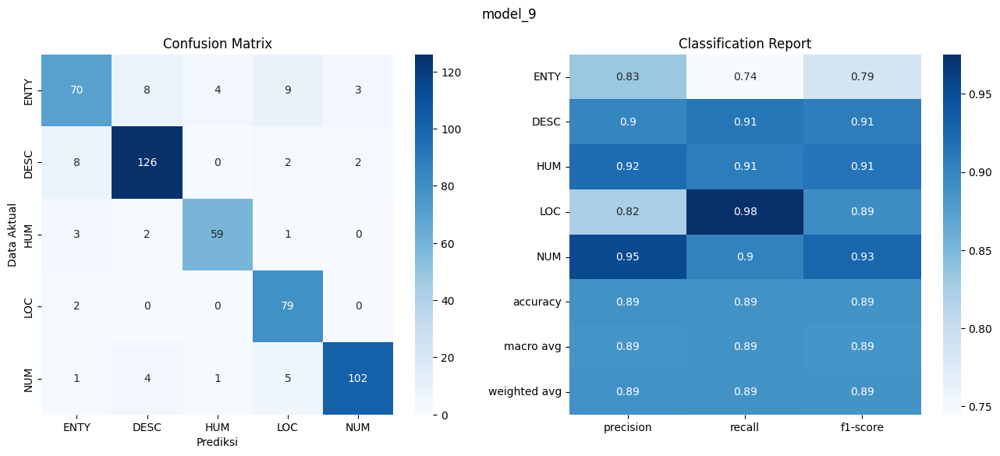

model logged

Scenario 10: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 10
early stopping implemented
traning is stopped by early stopping on epoch: 9
Test Loss: 1.6244, Test Acc: 0.1324

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      1.00      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  0   0  65   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1324


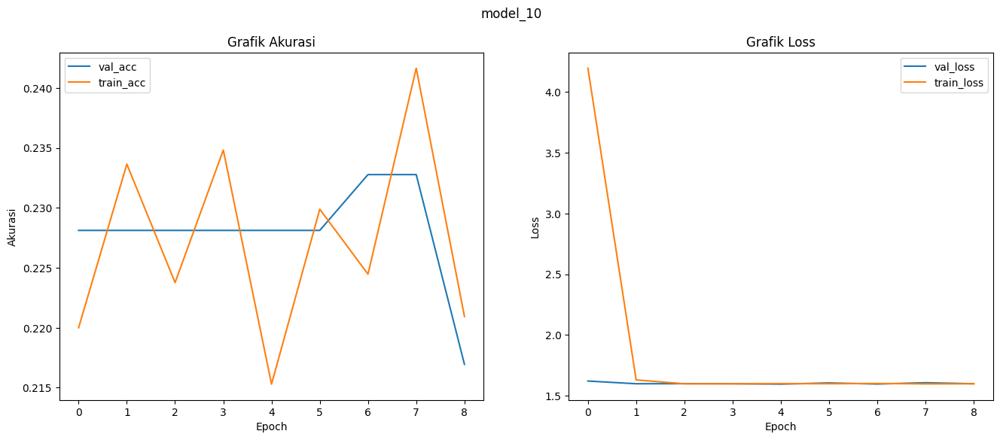

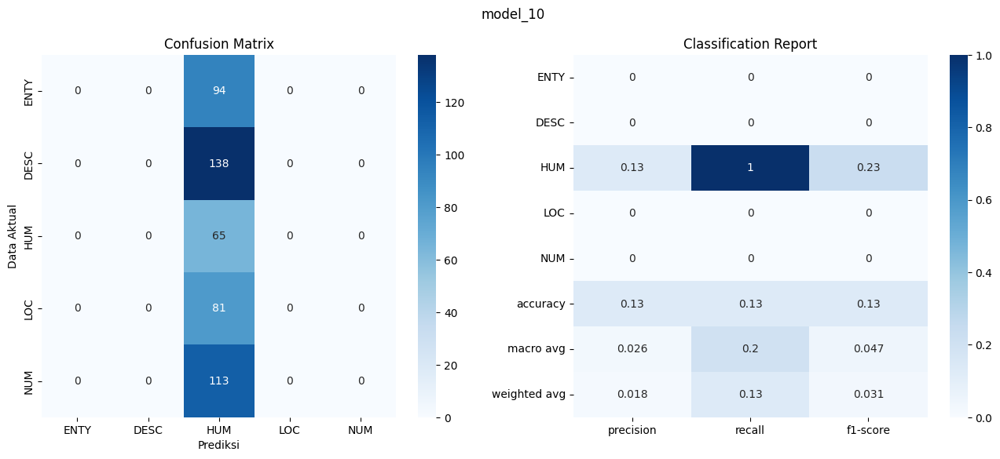

model logged

Scenario 11: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 11
early stopping implemented
traning is stopped by early stopping on epoch: 21
Test Loss: 1.4065, Test Acc: 0.2872

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.21      1.00      0.35        94
        DESC       0.00      0.00      0.00       138
         HUM       1.00      0.72      0.84        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.29       491
   macro avg       0.24      0.34      0.24       491
weighted avg       0.17      0.29      0.18       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 18   0  47   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.2872


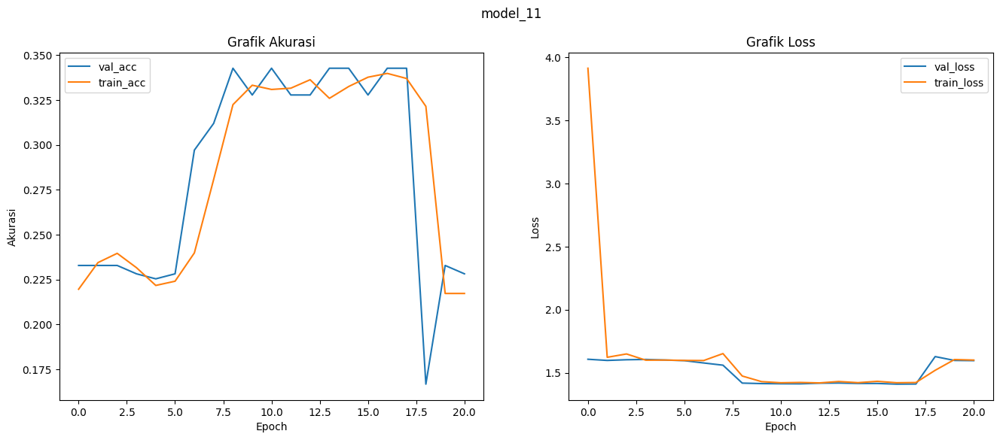

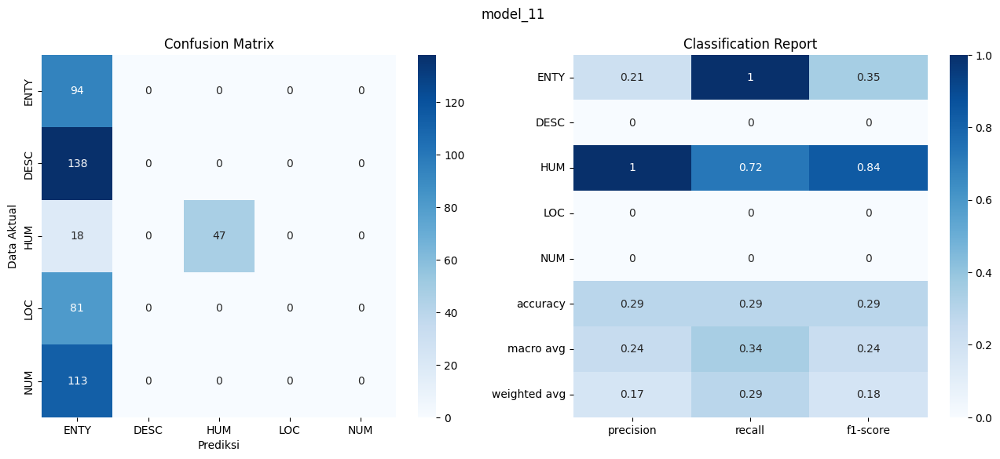

model logged

Scenario 12: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 12
early stopping implemented
traning is stopped by early stopping on epoch: 7
Test Loss: 1.6279, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


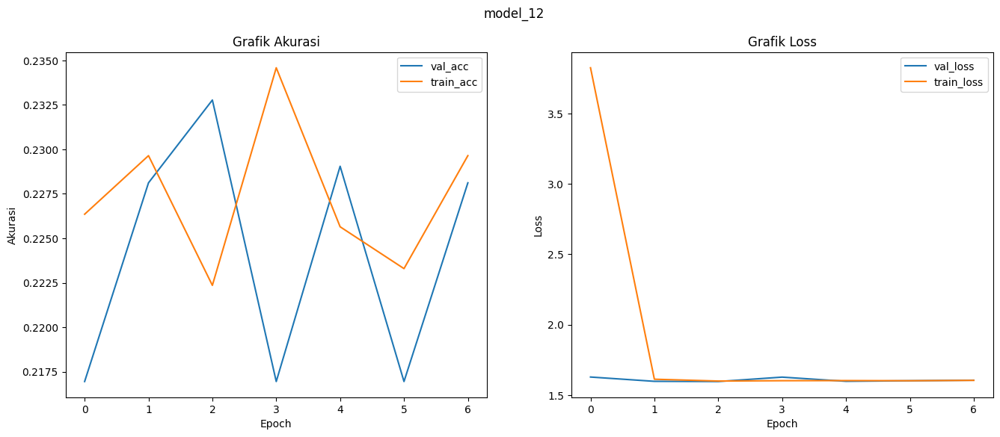

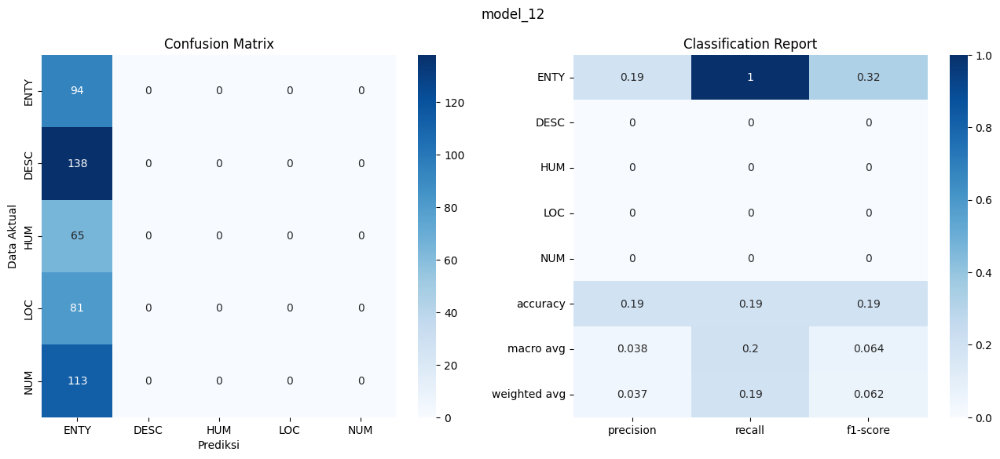

model logged

Scenario 13: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 13
early stopping implemented
traning is stopped by early stopping on epoch: 20
Test Loss: 0.2353, Test Acc: 0.9267

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.94      0.79      0.86        94
        DESC       0.87      0.99      0.92       138
         HUM       0.91      0.95      0.93        65
         LOC       0.97      0.95      0.96        81
         NUM       0.98      0.94      0.96       113

    accuracy                           0.93       491
   macro avg       0.93      0.92      0.93       491
weighted avg       0.93      0.93      0.93       491


Confusion Matrix:
[[ 74  12   5   1   2]
 [  2 136   0   0   0]
 [  2   0  62   1   0]
 [  1   2   1  77   0]
 [  0   7   0   0 106]]
Test accuracy: 0.9267


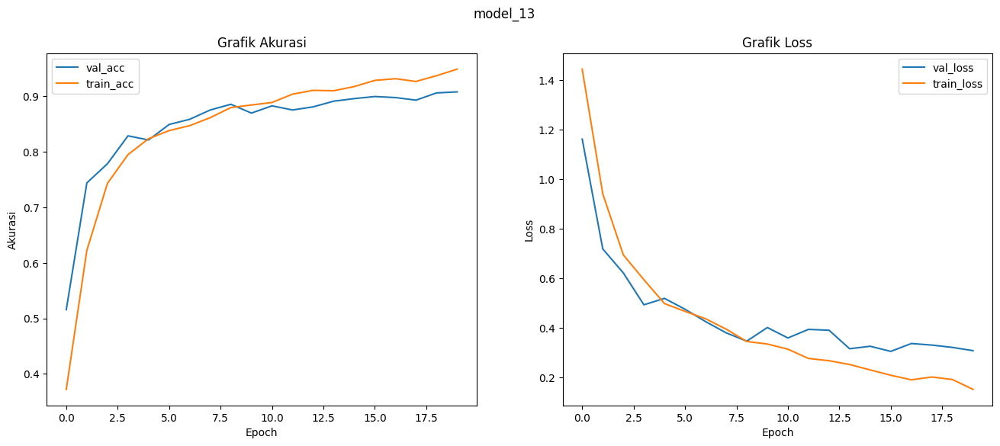

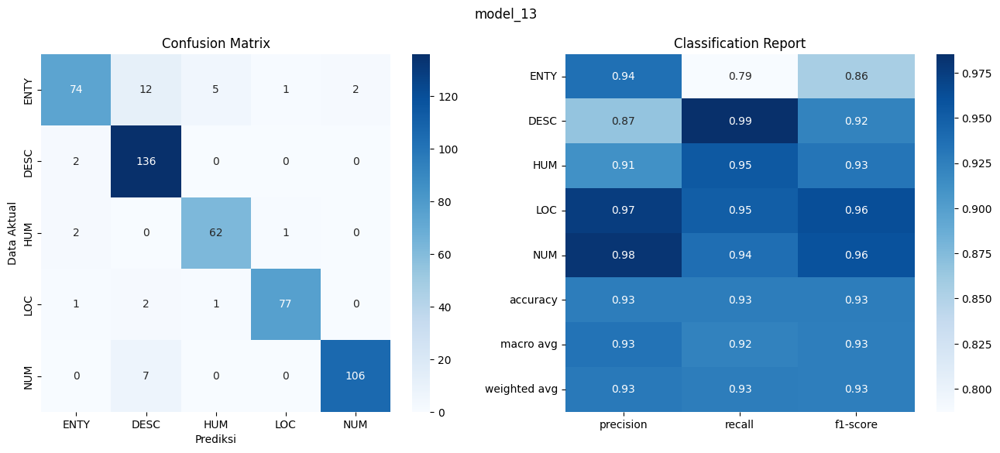

model logged

Scenario 14: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 14
early stopping implemented
traning is stopped by early stopping on epoch: 17
Test Loss: 0.2589, Test Acc: 0.9124

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.86      0.79      0.82        94
        DESC       0.90      0.96      0.93       138
         HUM       0.92      0.89      0.91        65
         LOC       0.90      0.98      0.93        81
         NUM       0.97      0.92      0.95       113

    accuracy                           0.91       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 74   7   5   6   2]
 [  5 133   0   0   0]
 [  4   1  58   2   0]
 [  1   0   0  79   1]
 [  2   6   0   1 104]]
Test accuracy: 0.9124


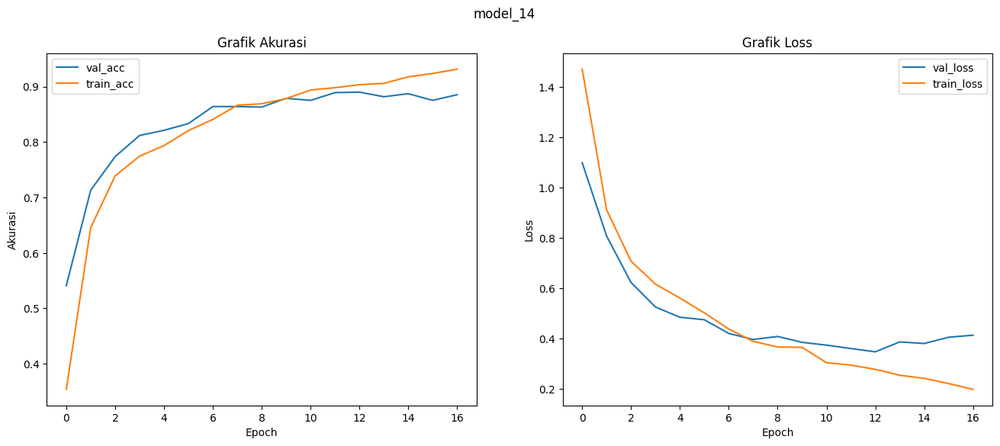

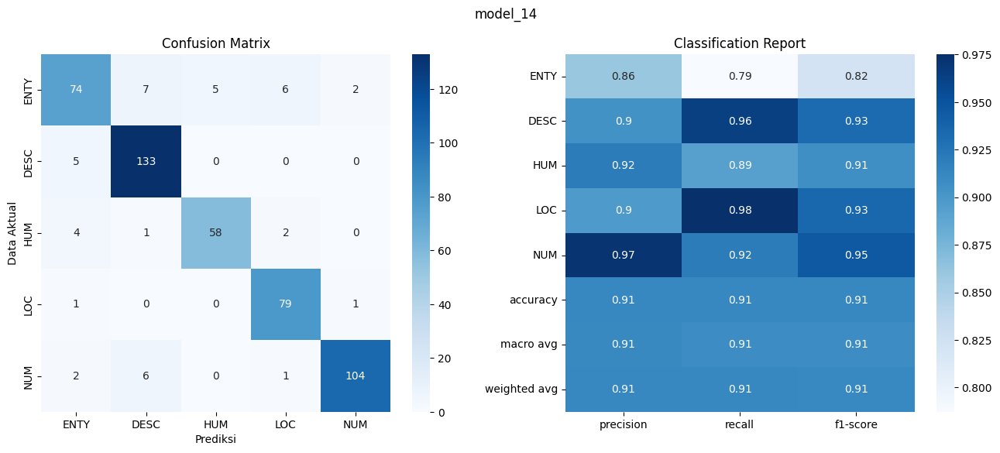

model logged

Scenario 15: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 15
early stopping implemented
traning is stopped by early stopping on epoch: 17
Test Loss: 0.2630, Test Acc: 0.9043

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.93      0.72      0.81        94
        DESC       0.86      0.98      0.92       138
         HUM       0.89      0.95      0.92        65
         LOC       0.90      0.96      0.93        81
         NUM       0.97      0.89      0.93       113

    accuracy                           0.90       491
   macro avg       0.91      0.90      0.90       491
weighted avg       0.91      0.90      0.90       491


Confusion Matrix:
[[ 68  13   7   4   2]
 [  2 135   0   0   1]
 [  2   0  62   1   0]
 [  0   2   1  78   0]
 [  1   7   0   4 101]]
Test accuracy: 0.9043


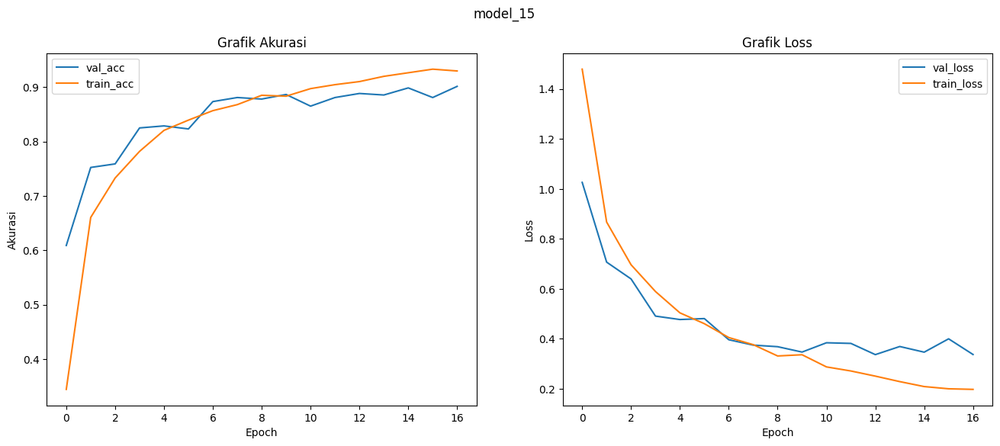

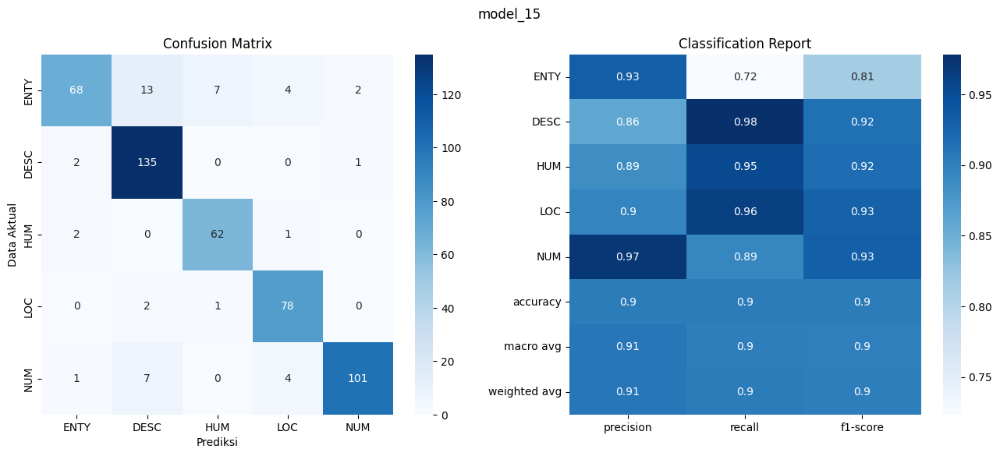

model logged

Scenario 16: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 16
early stopping implemented
traning is stopped by early stopping on epoch: 42
Test Loss: 0.2678, Test Acc: 0.9104

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.83      0.81      0.82        94
        DESC       0.94      0.93      0.93       138
         HUM       0.92      0.94      0.93        65
         LOC       0.90      0.93      0.91        81
         NUM       0.94      0.95      0.94       113

    accuracy                           0.91       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 76   4   4   5   5]
 [  8 128   0   0   2]
 [  2   1  61   1   0]
 [  4   1   1  75   0]
 [  2   2   0   2 107]]
Test accuracy: 0.9104


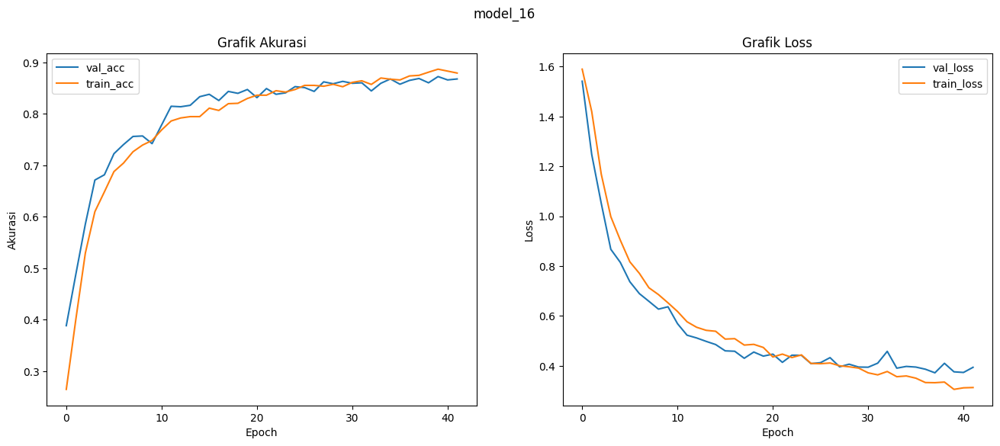

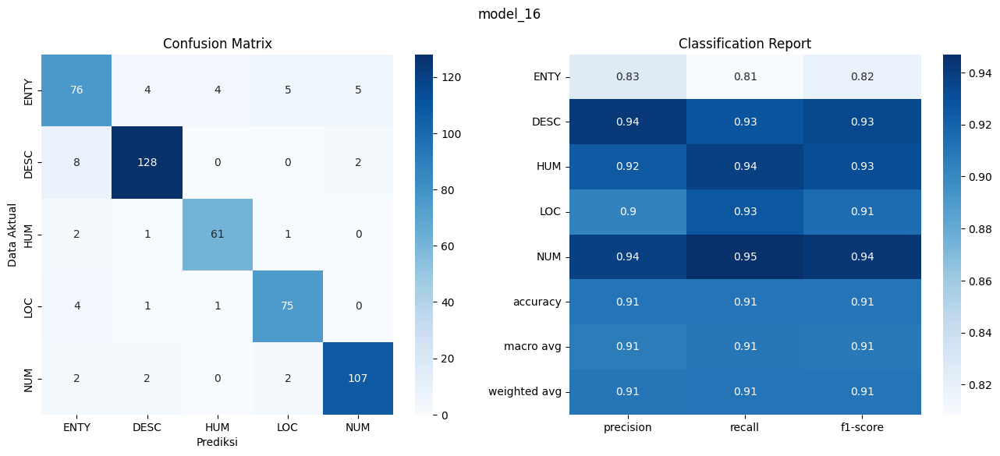

model logged

Scenario 17: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 17
early stopping implemented
traning is stopped by early stopping on epoch: 41
Test Loss: 0.2868, Test Acc: 0.9063

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.88      0.78      0.82        94
        DESC       0.90      0.95      0.92       138
         HUM       0.92      0.91      0.91        65
         LOC       0.88      0.96      0.92        81
         NUM       0.95      0.92      0.94       113

    accuracy                           0.91       491
   macro avg       0.91      0.90      0.90       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 73   7   4   7   3]
 [  6 131   0   0   1]
 [  3   2  59   1   0]
 [  1   1   0  78   1]
 [  0   5   1   3 104]]
Test accuracy: 0.9063


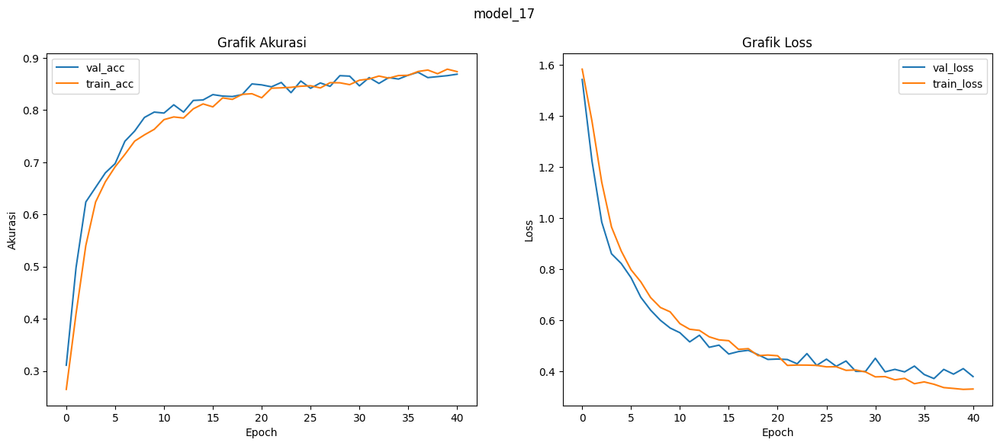

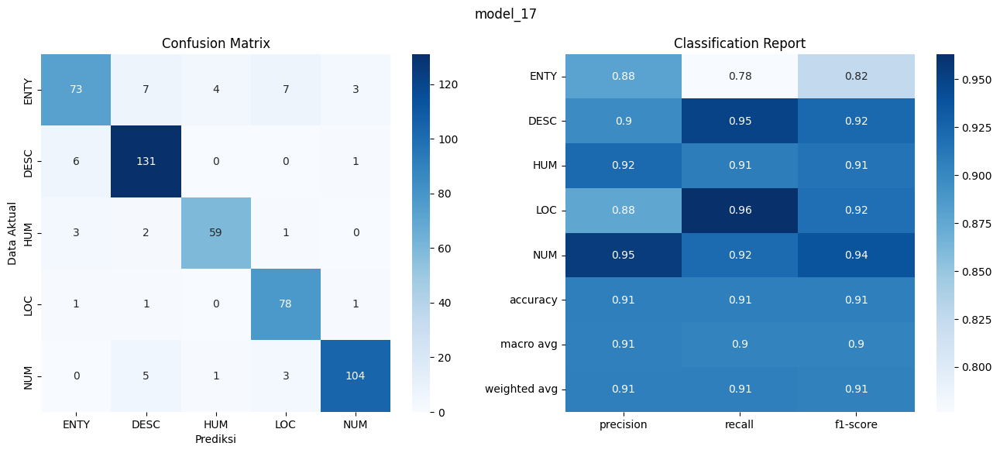

model logged

Scenario 18: {'vocabulary': None, 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 18
early stopping implemented
traning is stopped by early stopping on epoch: 30
Test Loss: 0.2736, Test Acc: 0.9063

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.88      0.72      0.80        94
        DESC       0.92      0.96      0.94       138
         HUM       0.86      0.94      0.90        65
         LOC       0.90      0.94      0.92        81
         NUM       0.94      0.96      0.95       113

    accuracy                           0.91       491
   macro avg       0.90      0.90      0.90       491
weighted avg       0.91      0.91      0.90       491


Confusion Matrix:
[[ 68   7   8   6   5]
 [  4 132   0   0   2]
 [  2   1  61   1   0]
 [  3   1   1  76   0]
 [  0   3   1   1 108]]
Test accuracy: 0.9063


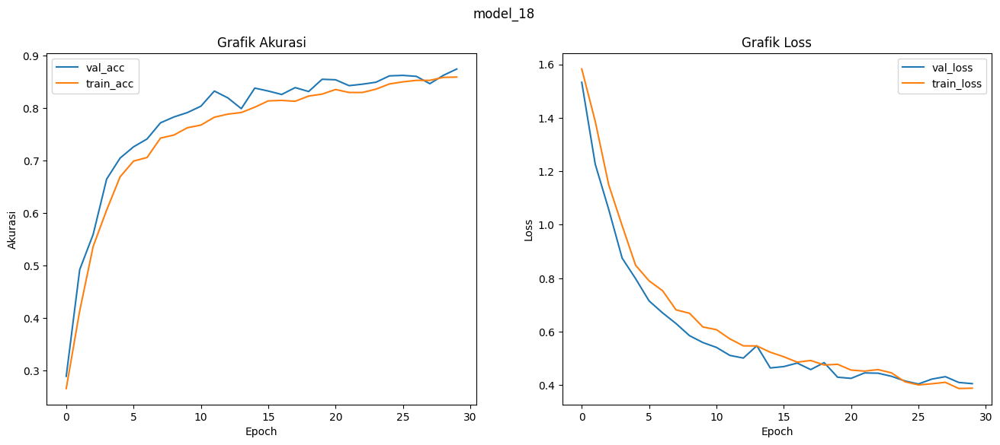

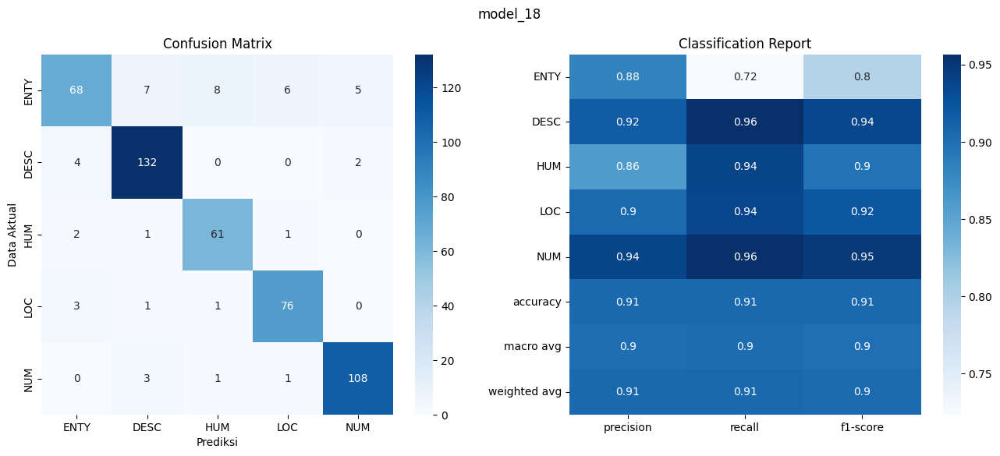

model logged

Scenario 19: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 19
early stopping implemented
traning is stopped by early stopping on epoch: 9
Test Loss: 1.6272, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


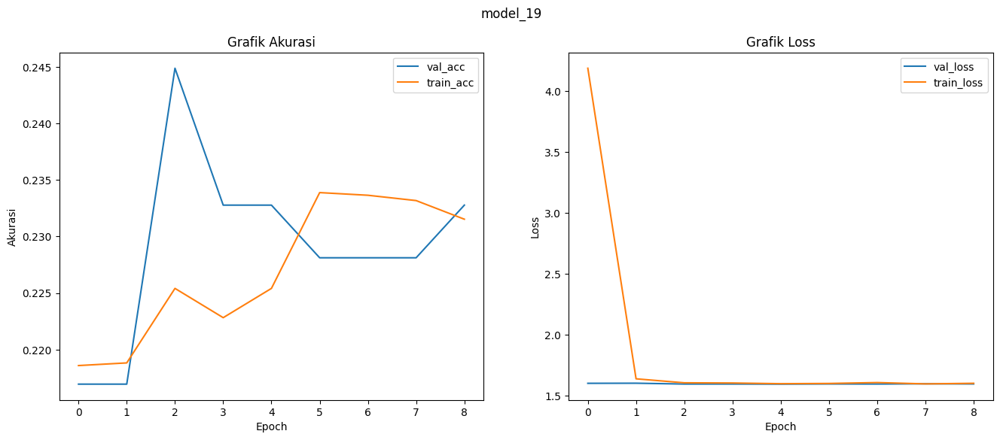

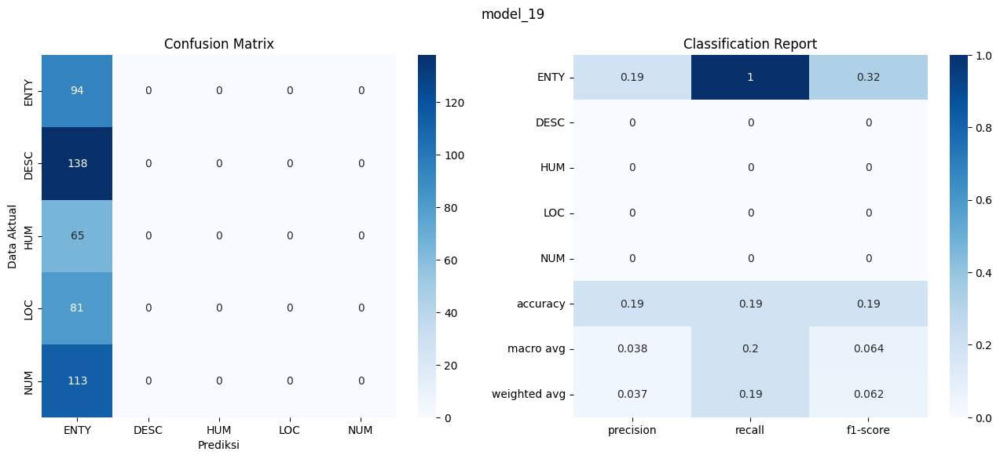

model logged

Scenario 20: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 20
early stopping implemented
traning is stopped by early stopping on epoch: 15
Test Loss: 1.6300, Test Acc: 0.1324

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      1.00      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  0   0  65   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1324


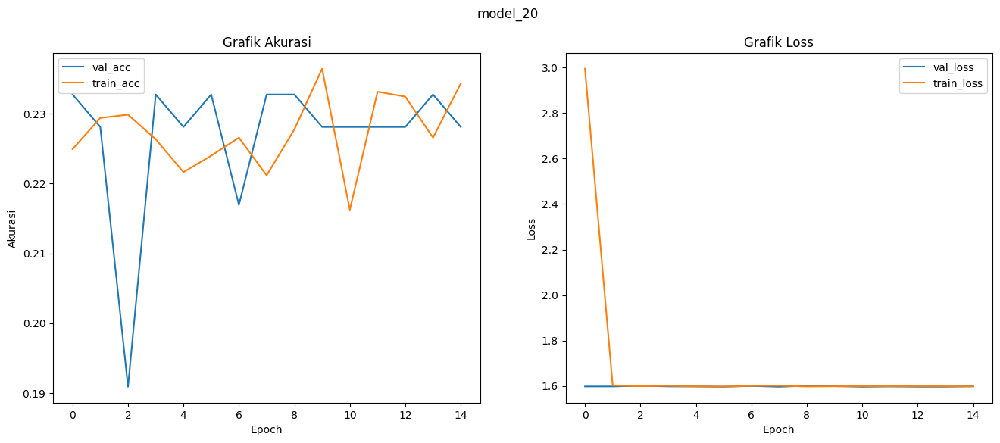

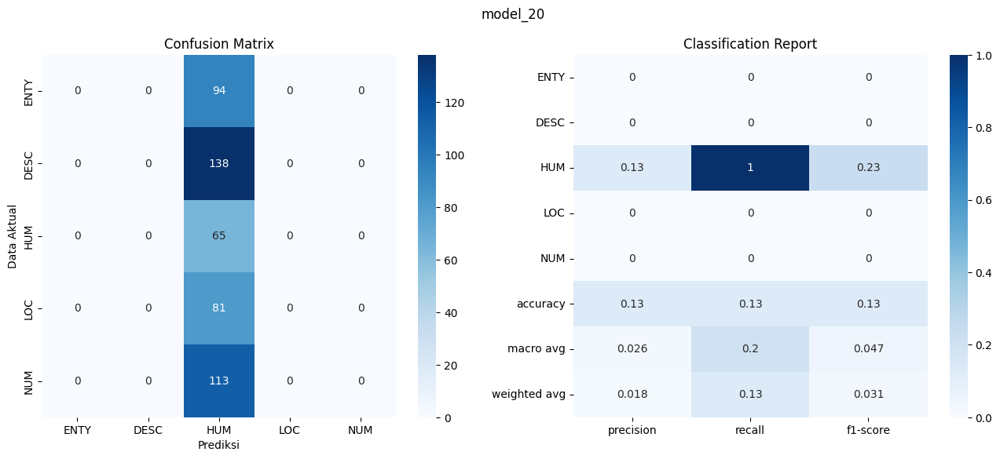

model logged

Scenario 21: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 21
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6265, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


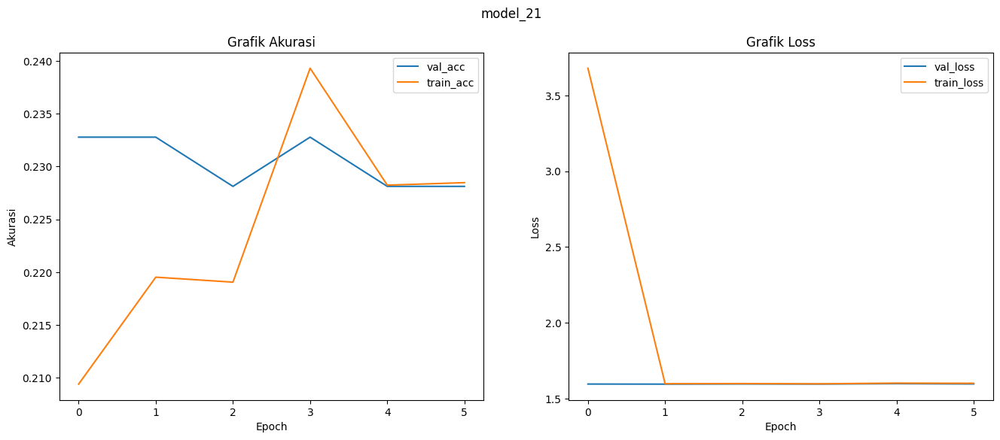

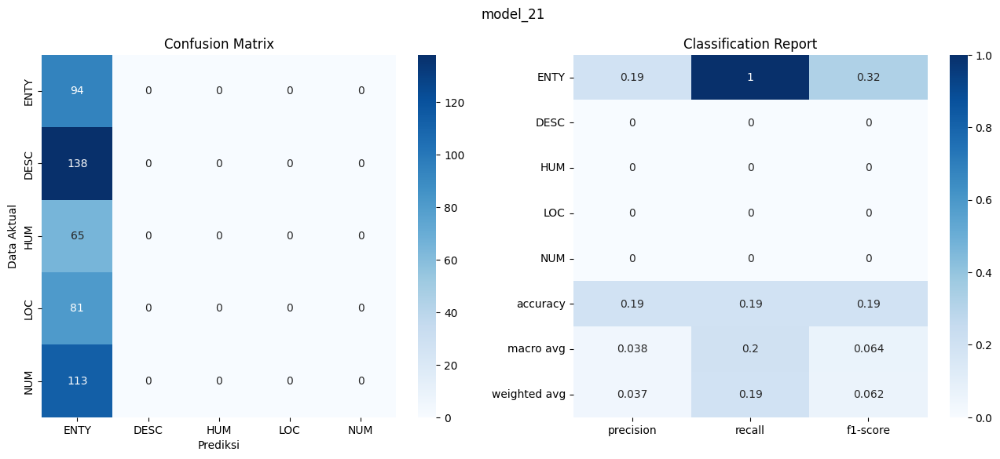

model logged

Scenario 22: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 22
early stopping implemented
traning is stopped by early stopping on epoch: 23
Test Loss: 0.2017, Test Acc: 0.9389

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.92      0.82      0.87        94
        DESC       0.94      0.97      0.95       138
         HUM       0.90      0.97      0.93        65
         LOC       0.94      0.98      0.96        81
         NUM       0.98      0.96      0.97       113

    accuracy                           0.94       491
   macro avg       0.94      0.94      0.94       491
weighted avg       0.94      0.94      0.94       491


Confusion Matrix:
[[ 77   5   6   4   2]
 [  4 134   0   0   0]
 [  2   0  63   0   0]
 [  1   0   1  79   0]
 [  0   4   0   1 108]]
Test accuracy: 0.9389


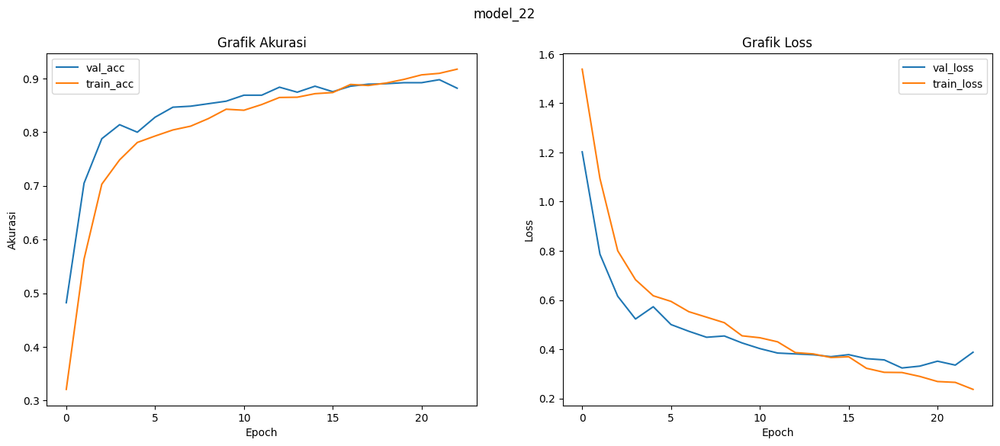

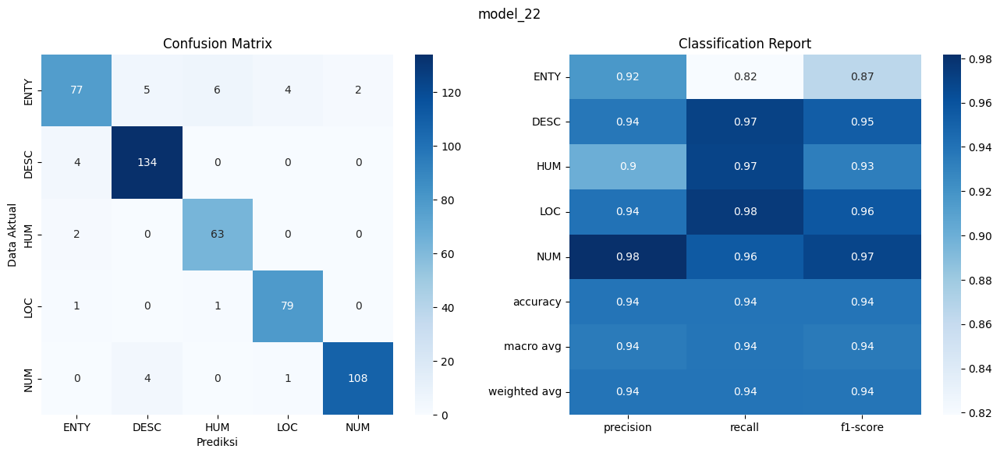

model logged

Scenario 23: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 23
early stopping implemented
traning is stopped by early stopping on epoch: 34
Test Loss: 0.2093, Test Acc: 0.9328

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.89      0.81      0.85        94
        DESC       0.97      0.96      0.97       138
         HUM       0.93      0.95      0.94        65
         LOC       0.88      1.00      0.94        81
         NUM       0.96      0.94      0.95       113

    accuracy                           0.93       491
   macro avg       0.93      0.93      0.93       491
weighted avg       0.93      0.93      0.93       491


Confusion Matrix:
[[ 76   2   5   8   3]
 [  4 133   0   0   1]
 [  2   0  62   1   0]
 [  0   0   0  81   0]
 [  3   2   0   2 106]]
Test accuracy: 0.9328


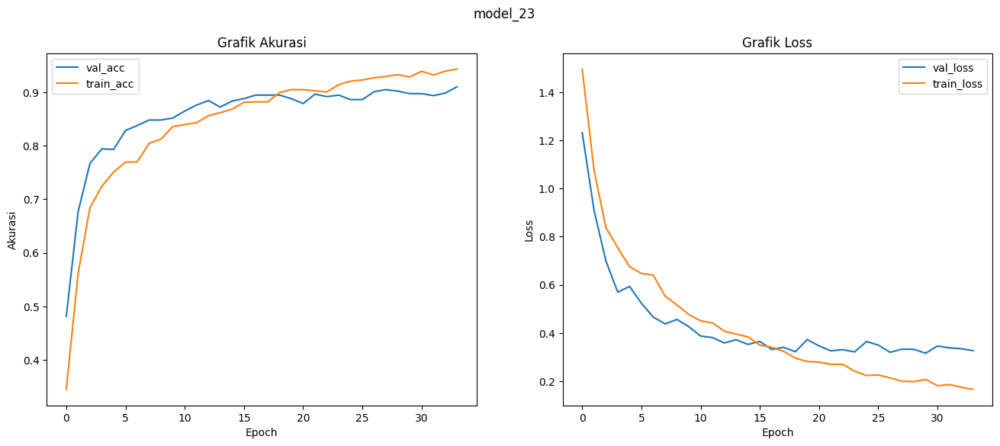

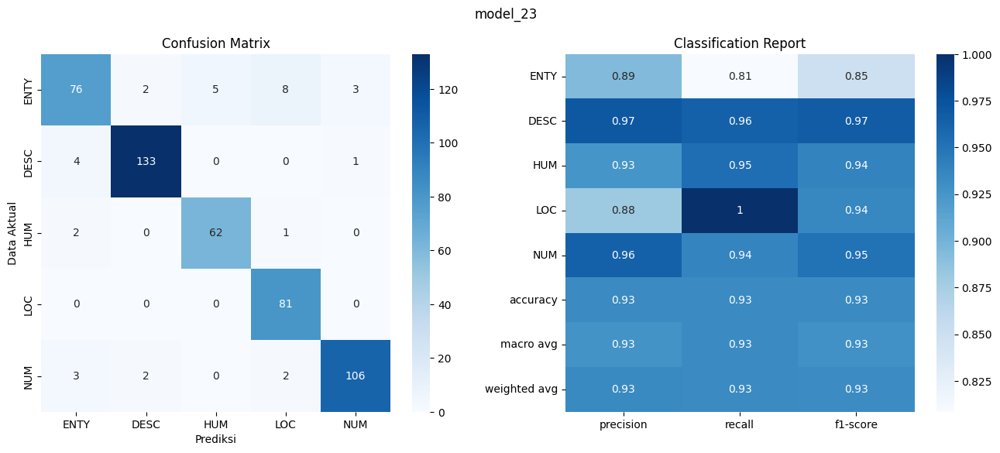

model logged

Scenario 24: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 24
early stopping implemented
traning is stopped by early stopping on epoch: 27
Test Loss: 0.2159, Test Acc: 0.9185

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.96      0.71      0.82        94
        DESC       0.86      0.99      0.92       138
         HUM       0.91      0.95      0.93        65
         LOC       0.93      0.98      0.95        81
         NUM       0.97      0.94      0.95       113

    accuracy                           0.92       491
   macro avg       0.93      0.91      0.92       491
weighted avg       0.92      0.92      0.92       491


Confusion Matrix:
[[ 67  15   6   4   2]
 [  1 137   0   0   0]
 [  1   1  62   1   0]
 [  0   1   0  79   1]
 [  1   5   0   1 106]]
Test accuracy: 0.9185


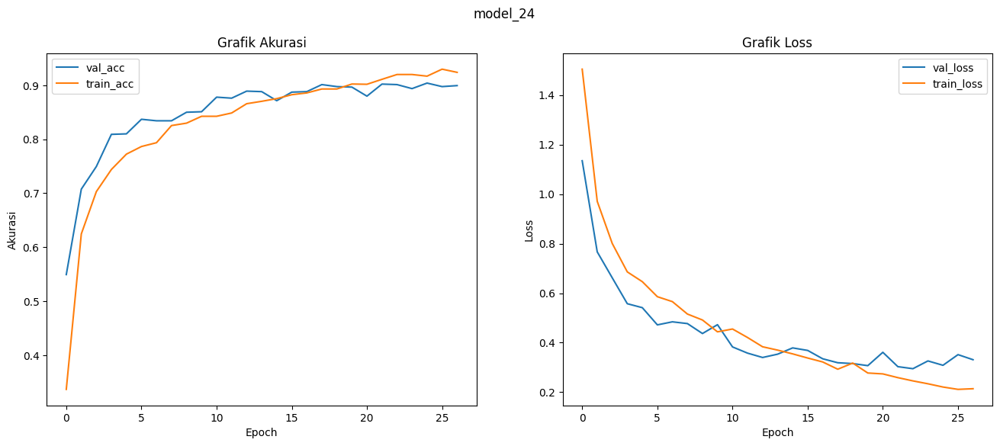

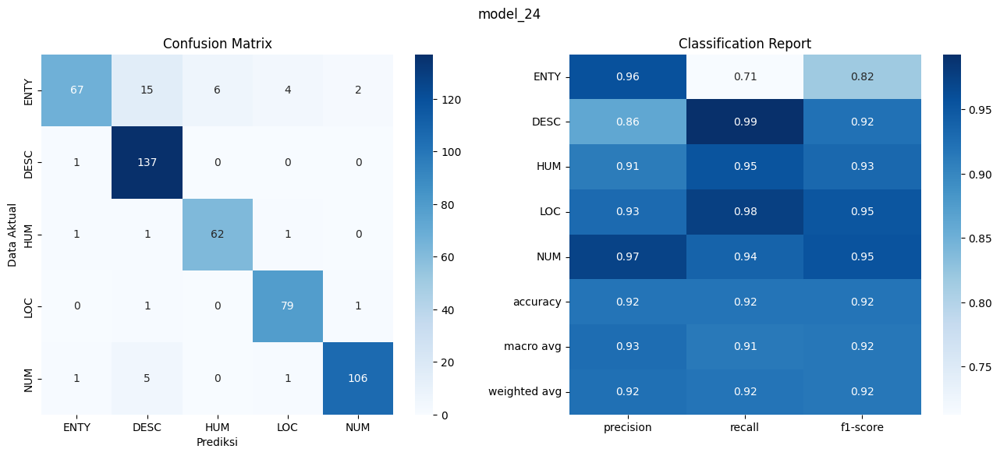

model logged

Scenario 25: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 25
early stopping implemented
traning is stopped by early stopping on epoch: 71
Test Loss: 0.2662, Test Acc: 0.9022

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.82      0.74      0.78        94
        DESC       0.88      0.98      0.93       138
         HUM       0.88      0.92      0.90        65
         LOC       0.94      0.93      0.93        81
         NUM       0.98      0.91      0.94       113

    accuracy                           0.90       491
   macro avg       0.90      0.90      0.90       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 70  13   6   3   2]
 [  3 135   0   0   0]
 [  4   0  60   1   0]
 [  4   1   1  75   0]
 [  4   4   1   1 103]]
Test accuracy: 0.9022


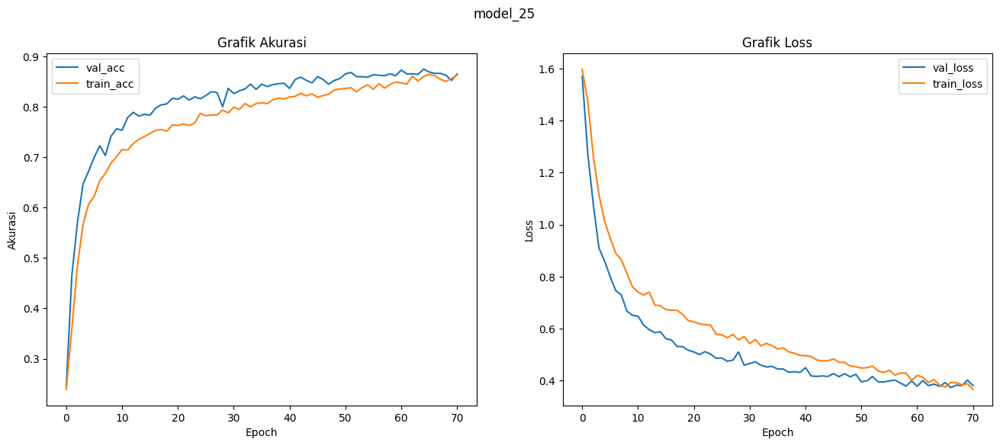

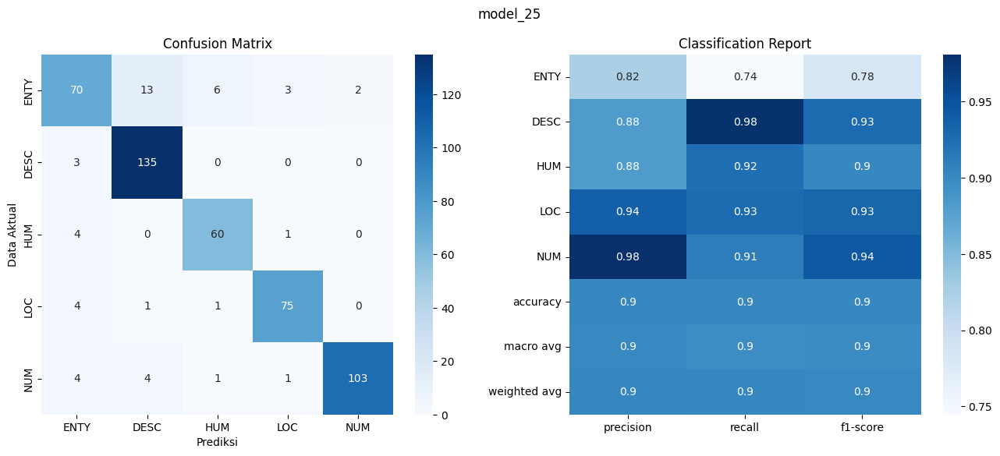

model logged

Scenario 26: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 26
early stopping implemented
traning is stopped by early stopping on epoch: 37
Test Loss: 0.3435, Test Acc: 0.8819

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.87      0.64      0.74        94
        DESC       0.91      0.97      0.94       138
         HUM       0.90      0.88      0.89        65
         LOC       0.78      0.98      0.87        81
         NUM       0.94      0.91      0.92       113

    accuracy                           0.88       491
   macro avg       0.88      0.87      0.87       491
weighted avg       0.89      0.88      0.88       491


Confusion Matrix:
[[ 60  10   6  12   6]
 [  3 134   0   1   0]
 [  5   1  57   2   0]
 [  1   0   0  79   1]
 [  0   3   0   7 103]]
Test accuracy: 0.8819


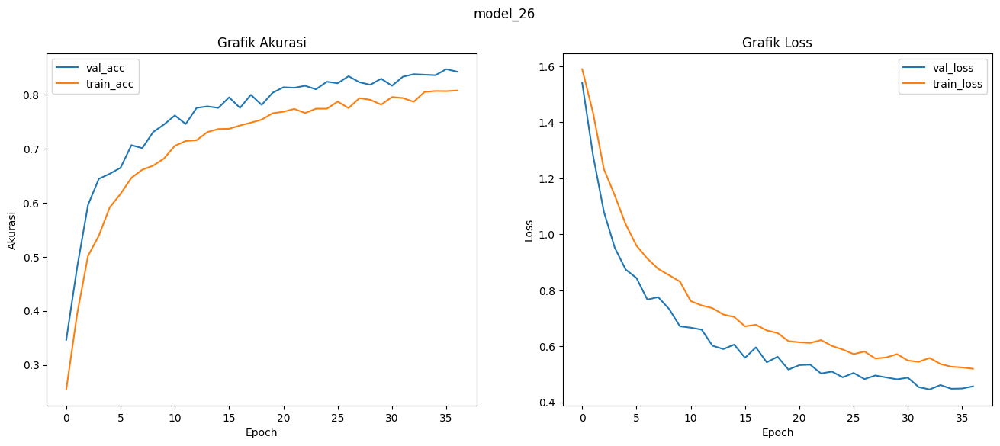

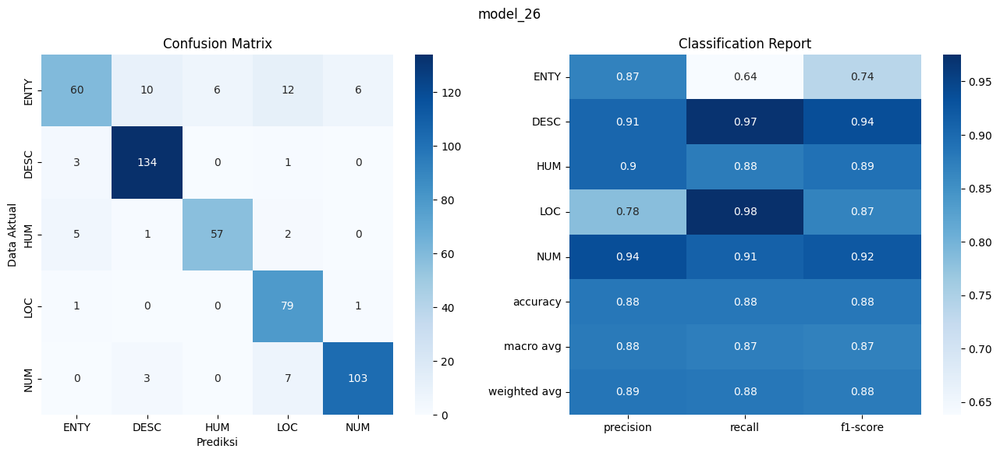

model logged

Scenario 27: {'vocabulary': None, 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 27
early stopping implemented
traning is stopped by early stopping on epoch: 27
Test Loss: 0.3953, Test Acc: 0.8656

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.78      0.73      0.75        94
        DESC       0.86      0.91      0.88       138
         HUM       0.90      0.88      0.89        65
         LOC       0.82      0.95      0.88        81
         NUM       0.98      0.85      0.91       113

    accuracy                           0.87       491
   macro avg       0.87      0.86      0.86       491
weighted avg       0.87      0.87      0.87       491


Confusion Matrix:
[[ 69  11   4   8   2]
 [ 11 126   0   1   0]
 [  3   3  57   2   0]
 [  2   1   1  77   0]
 [  4   6   1   6  96]]
Test accuracy: 0.8656


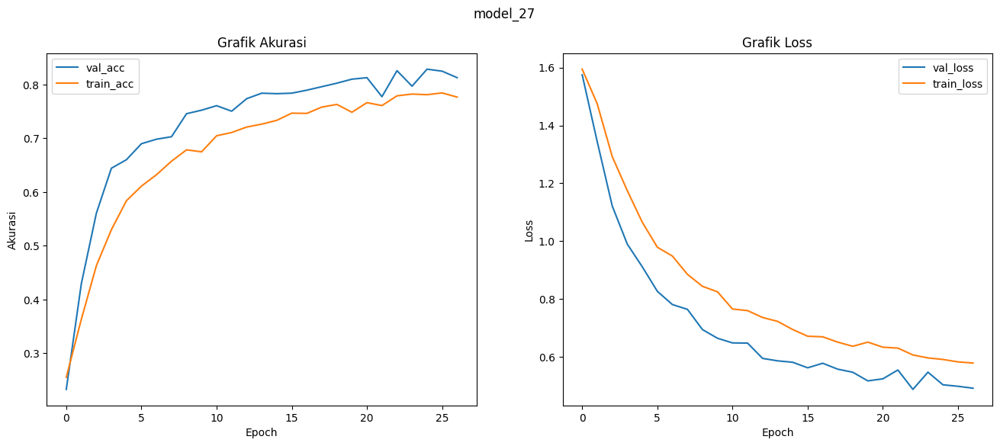

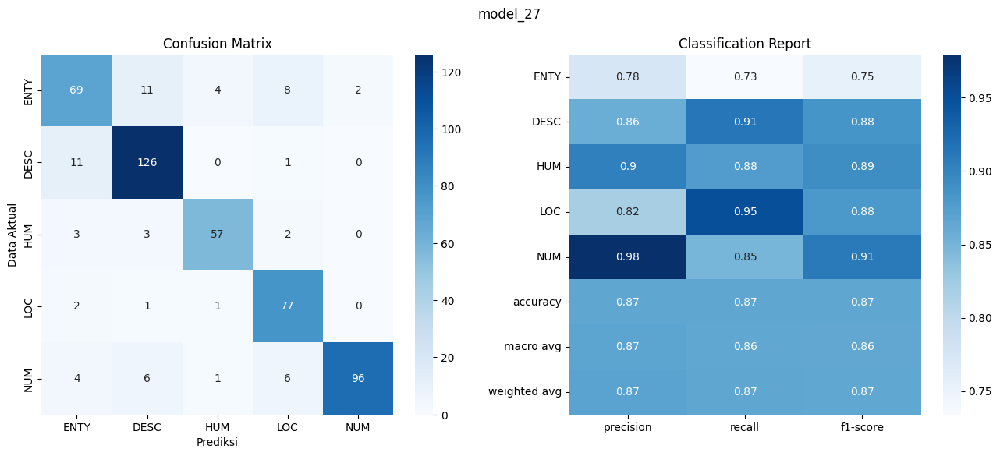

model logged

Scenario 28: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.01}
Jumlah vocabulary/kosa kata: 8766
created new data with intervention: use_stopwords
Starting training for scenario 28
early stopping implemented
traning is stopped by early stopping on epoch: 14
Test Loss: 1.6013, Test Acc: 0.3483

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.27      0.45      0.33        94
        DESC       0.44      0.76      0.56       138
         HUM       0.25      0.37      0.30        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.35       491
   macro avg       0.19      0.32      0.24       491
weighted avg       0.21      0.35      0.26       491


Confusion Matrix:
[[ 42  26  26   0   0]
 [ 25 105   8   0   0]
 [ 35   6  24   0   0]
 [ 22  39  20   0   0]
 [ 34  61  18   0   0]]

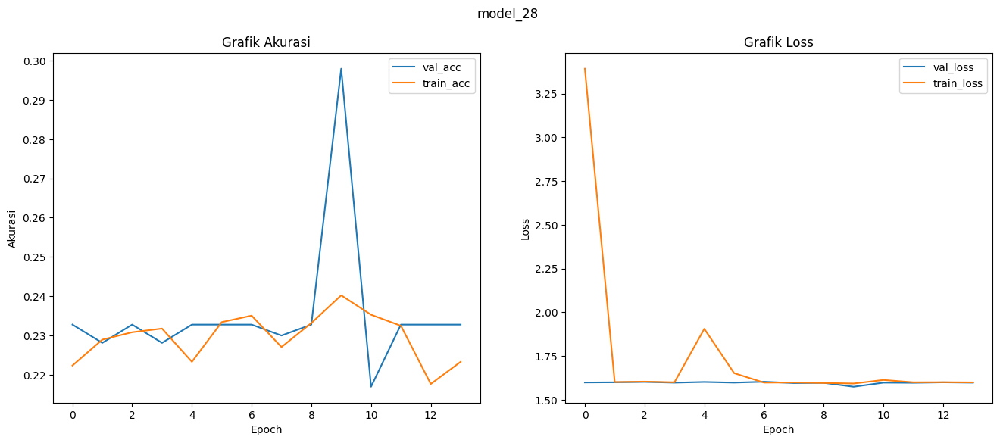

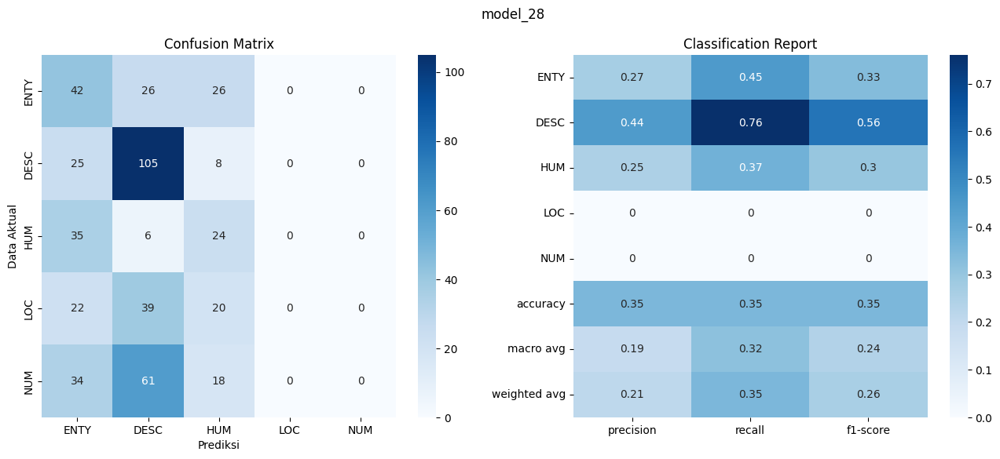

model logged

Scenario 29: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 29
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6288, Test Acc: 0.1324

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      1.00      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  0   0  65   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1324


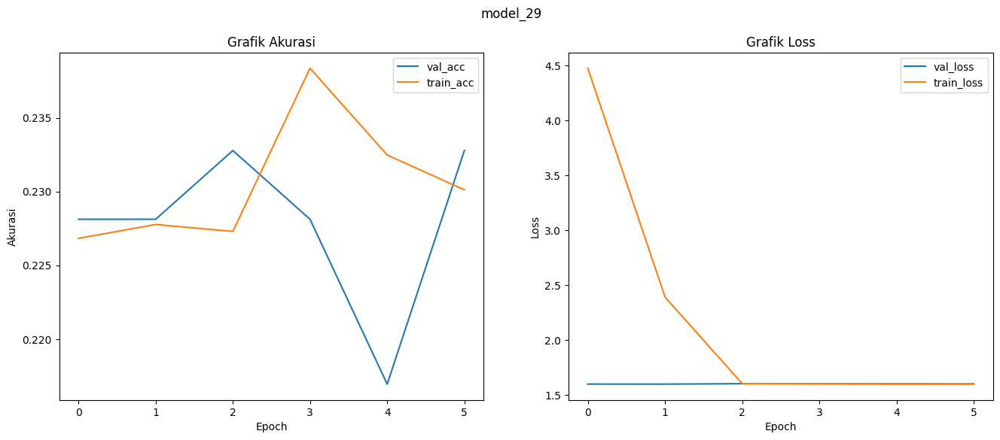

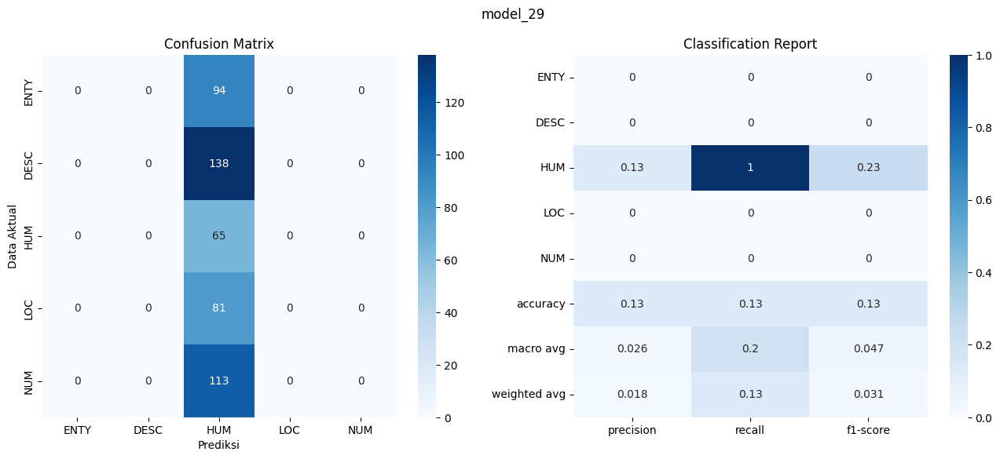

model logged

Scenario 30: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 30
early stopping implemented
traning is stopped by early stopping on epoch: 34
Test Loss: 1.1548, Test Acc: 0.5336

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.36      0.43      0.39        94
        DESC       0.66      0.62      0.64       138
         HUM       0.36      0.85      0.51        65
         LOC       0.00      0.00      0.00        81
         NUM       0.82      0.72      0.76       113

    accuracy                           0.53       491
   macro avg       0.44      0.52      0.46       491
weighted avg       0.49      0.53      0.50       491


Confusion Matrix:
[[40 32 20  0  2]
 [32 86  5  0 15]
 [10  0 55  0  0]
 [16  4 60  0  1]
 [12  9 11  0 81]]
Test accuracy: 0.5336


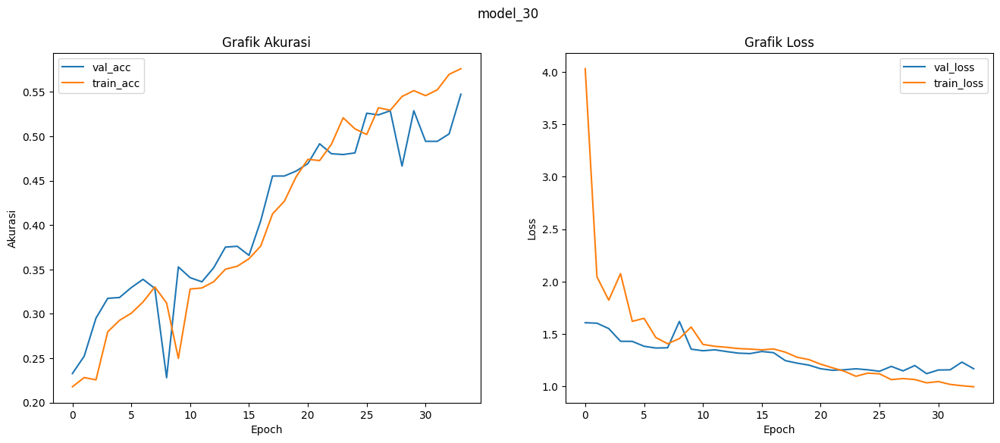

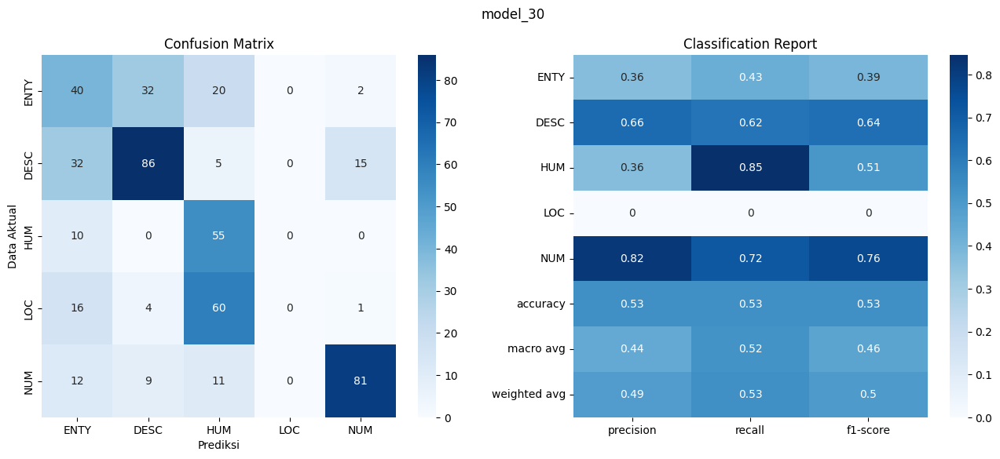

model logged

Scenario 31: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 31
early stopping implemented
traning is stopped by early stopping on epoch: 9
Test Loss: 0.7461, Test Acc: 0.7475

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.66      0.62      0.64        94
        DESC       0.83      0.79      0.81       138
         HUM       0.66      0.78      0.72        65
         LOC       0.71      0.80      0.76        81
         NUM       0.81      0.74      0.77       113

    accuracy                           0.75       491
   macro avg       0.74      0.75      0.74       491
weighted avg       0.75      0.75      0.75       491


Confusion Matrix:
[[ 58   9   9   9   9]
 [ 15 109   3   2   9]
 [  4   5  51   5   0]
 [  6   3   5  65   2]
 [  5   5   9  10  84]]
Test accuracy: 0.7475


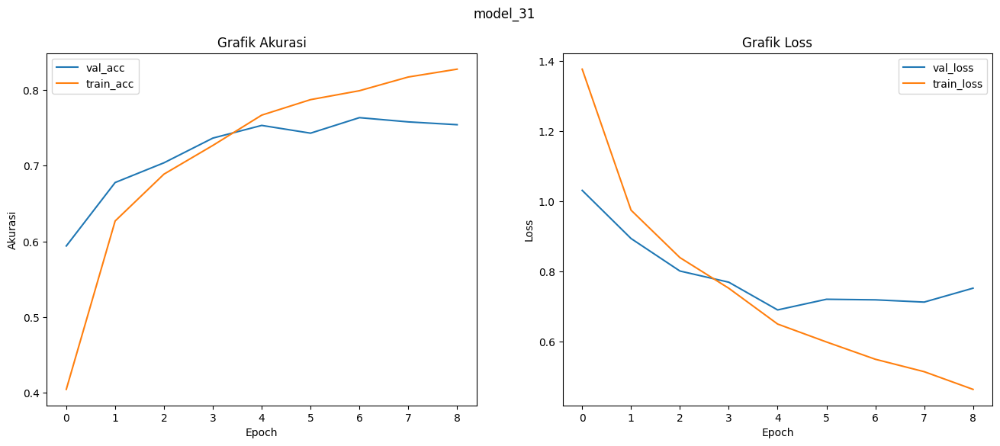

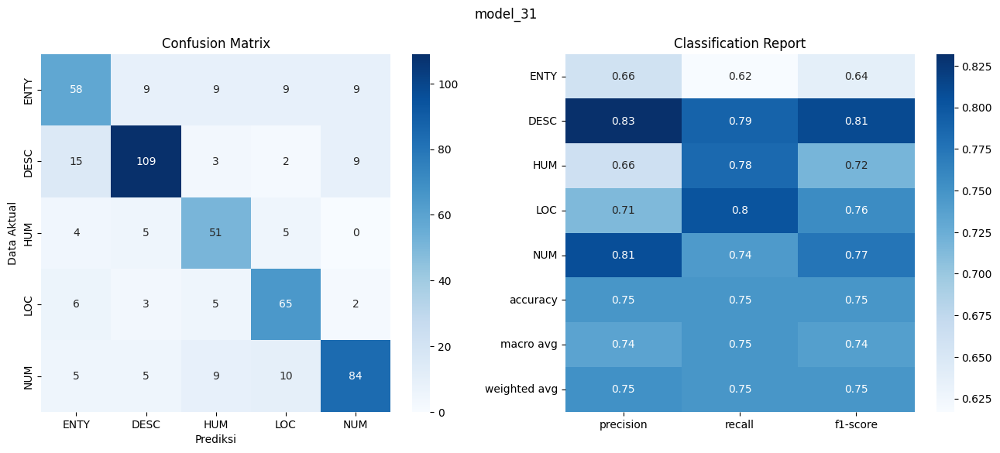

model logged

Scenario 32: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 32
early stopping implemented
traning is stopped by early stopping on epoch: 11
Test Loss: 0.6811, Test Acc: 0.7658

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.83      0.56      0.67        94
        DESC       0.76      0.92      0.83       138
         HUM       0.74      0.80      0.77        65
         LOC       0.70      0.79      0.74        81
         NUM       0.81      0.71      0.75       113

    accuracy                           0.77       491
   macro avg       0.77      0.76      0.75       491
weighted avg       0.77      0.77      0.76       491


Confusion Matrix:
[[ 53  14   8  11   8]
 [  3 127   2   2   4]
 [  1   5  52   5   2]
 [  5   5   2  64   5]
 [  2  16   6   9  80]]
Test accuracy: 0.7658


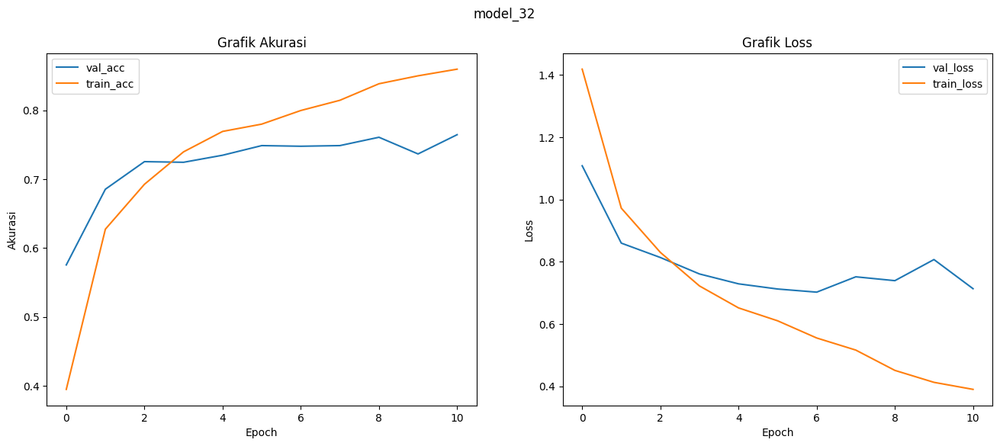

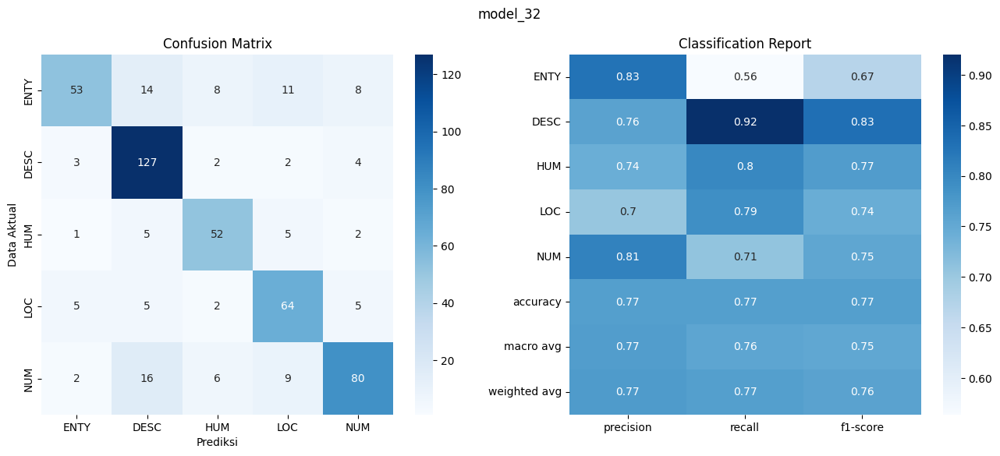

model logged

Scenario 33: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 33
early stopping implemented
traning is stopped by early stopping on epoch: 11
Test Loss: 0.7571, Test Acc: 0.7495

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.74      0.63      0.68        94
        DESC       0.72      0.88      0.79       138
         HUM       0.72      0.78      0.75        65
         LOC       0.76      0.75      0.76        81
         NUM       0.83      0.66      0.74       113

    accuracy                           0.75       491
   macro avg       0.75      0.74      0.74       491
weighted avg       0.76      0.75      0.75       491


Confusion Matrix:
[[ 59  17   5   9   4]
 [  9 122   2   0   5]
 [  1   7  51   3   3]
 [  7   5   5  61   3]
 [  4  19   8   7  75]]
Test accuracy: 0.7495


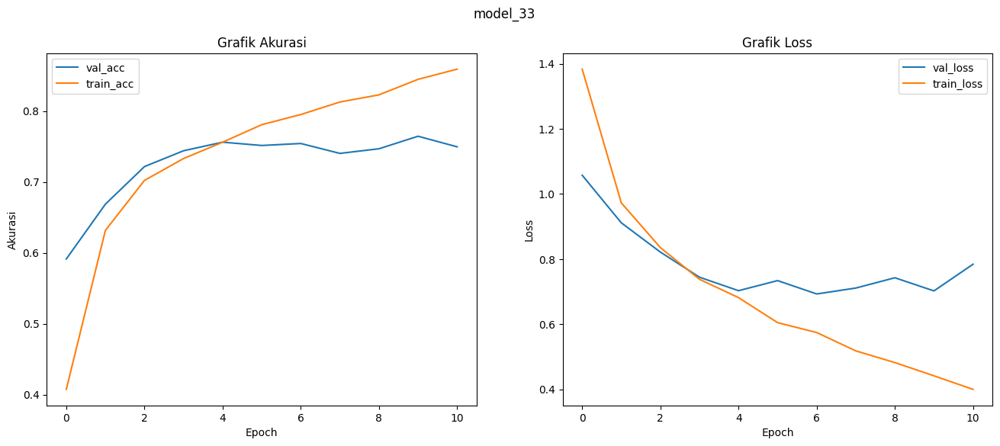

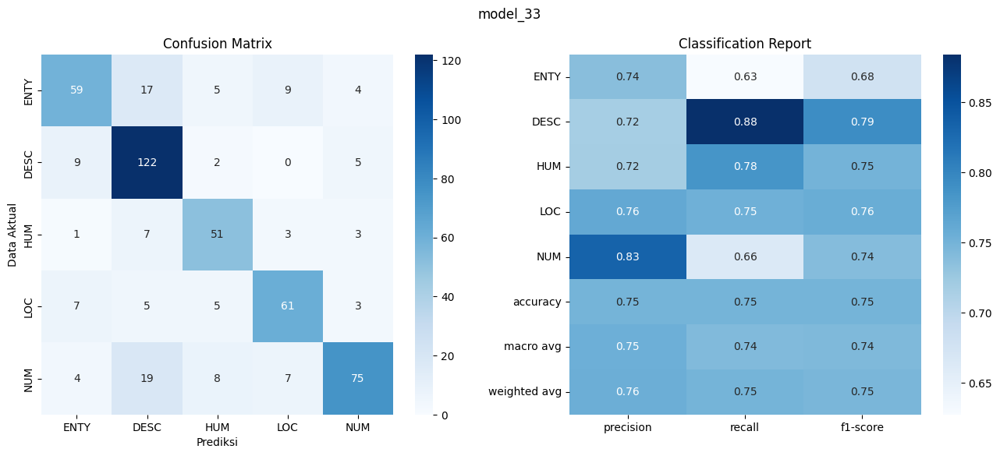

model logged

Scenario 34: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 34
early stopping implemented
traning is stopped by early stopping on epoch: 29
Test Loss: 0.7009, Test Acc: 0.7597

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.75      0.63      0.68        94
        DESC       0.82      0.84      0.83       138
         HUM       0.69      0.74      0.71        65
         LOC       0.68      0.80      0.74        81
         NUM       0.81      0.75      0.78       113

    accuracy                           0.76       491
   macro avg       0.75      0.75      0.75       491
weighted avg       0.76      0.76      0.76       491


Confusion Matrix:
[[ 59   8   9  12   6]
 [ 10 116   1   2   9]
 [  2   6  48   9   0]
 [  5   3   3  65   5]
 [  3   9   9   7  85]]
Test accuracy: 0.7597


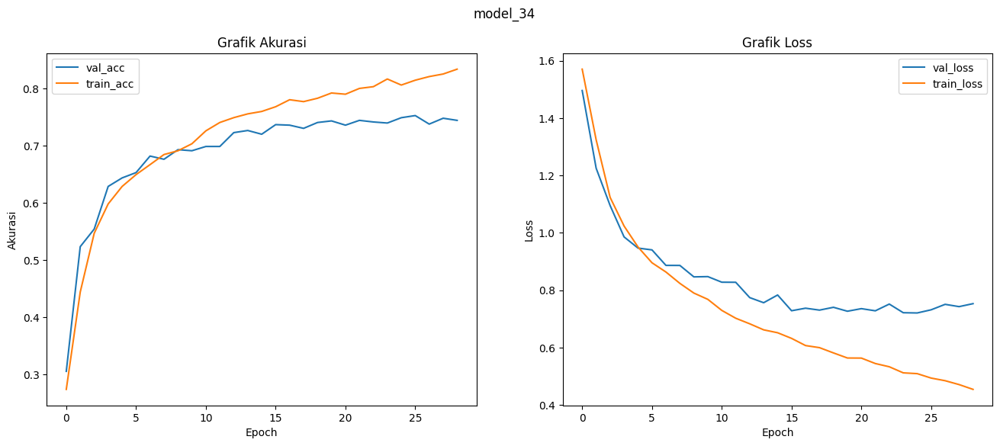

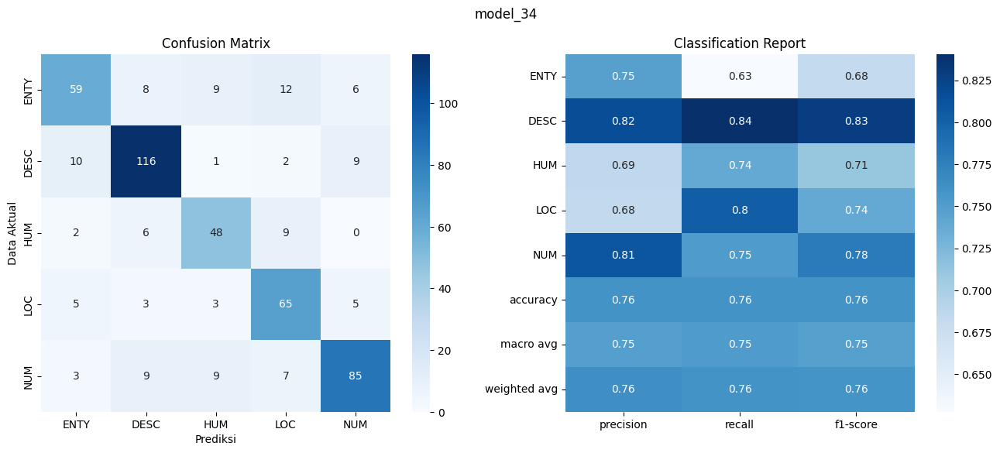

model logged

Scenario 35: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 35
early stopping implemented
traning is stopped by early stopping on epoch: 24
Test Loss: 0.7103, Test Acc: 0.7576

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.76      0.57      0.65        94
        DESC       0.75      0.85      0.79       138
         HUM       0.69      0.77      0.73        65
         LOC       0.74      0.75      0.75        81
         NUM       0.83      0.80      0.81       113

    accuracy                           0.76       491
   macro avg       0.75      0.75      0.75       491
weighted avg       0.76      0.76      0.75       491


Confusion Matrix:
[[ 54  20   9   8   3]
 [  9 117   1   1  10]
 [  2   6  50   6   1]
 [  4   5   6  61   5]
 [  2   9   6   6  90]]
Test accuracy: 0.7576


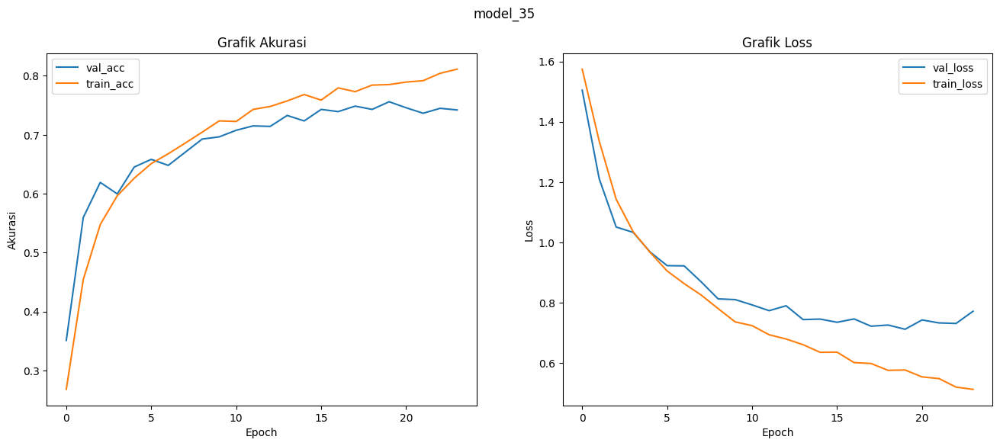

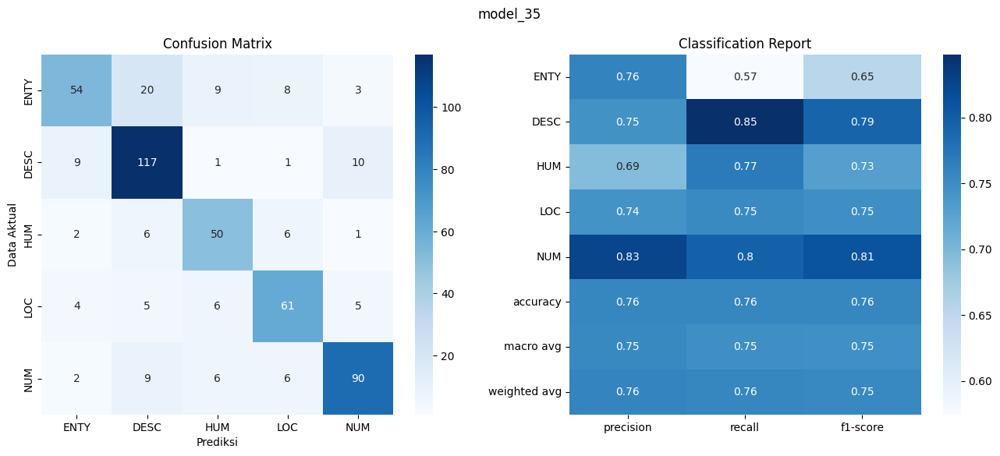

model logged

Scenario 36: {'vocabulary': 'use_stopwords', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 36
early stopping implemented
traning is stopped by early stopping on epoch: 23
Test Loss: 0.7265, Test Acc: 0.7495

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.78      0.68      0.73        94
        DESC       0.75      0.86      0.80       138
         HUM       0.69      0.72      0.71        65
         LOC       0.68      0.78      0.73        81
         NUM       0.82      0.66      0.74       113

    accuracy                           0.75       491
   macro avg       0.75      0.74      0.74       491
weighted avg       0.76      0.75      0.75       491


Confusion Matrix:
[[ 64  12   4  10   4]
 [  8 119   1   1   9]
 [  2   7  47   8   1]
 [  4   7   5  63   2]
 [  4  13  11  10  75]]
Test accuracy: 0.7495


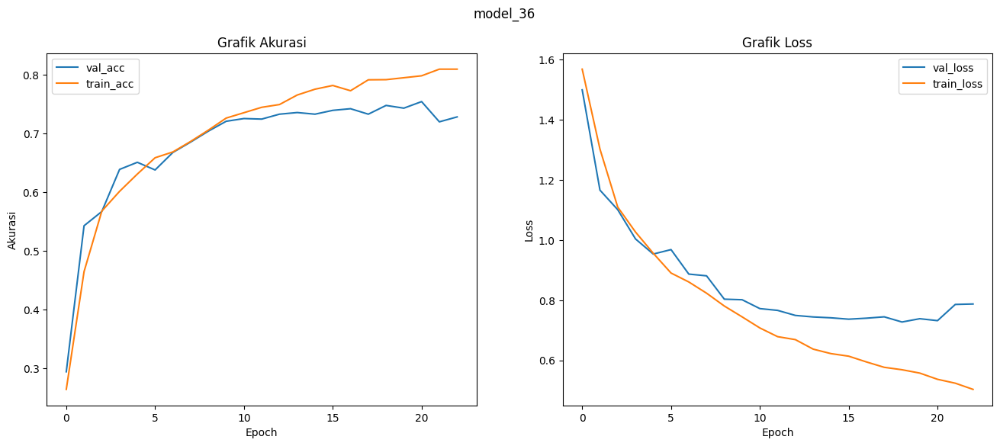

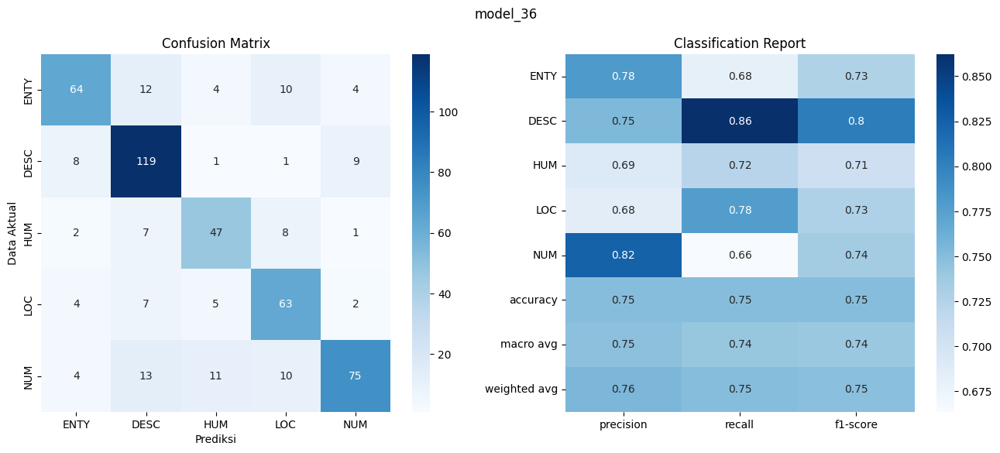

model logged

Scenario 37: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 37
early stopping implemented
traning is stopped by early stopping on epoch: 9
Test Loss: 1.4405, Test Acc: 0.3646

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      0.10      0.13        94
        DESC       0.36      0.91      0.52       138
         HUM       0.45      0.68      0.54        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.36       491
   macro avg       0.20      0.34      0.24       491
weighted avg       0.20      0.36      0.24       491


Confusion Matrix:
[[  9  63  22   0   0]
 [  7 126   5   0   0]
 [  9  12  44   0   0]
 [ 11  62   8   0   0]
 [ 11  84  18   0   0]]
Test accuracy: 0.3646


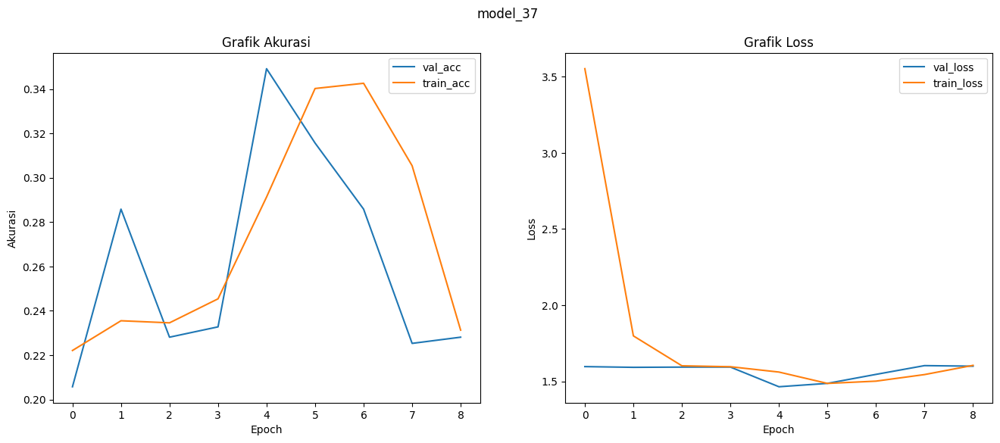

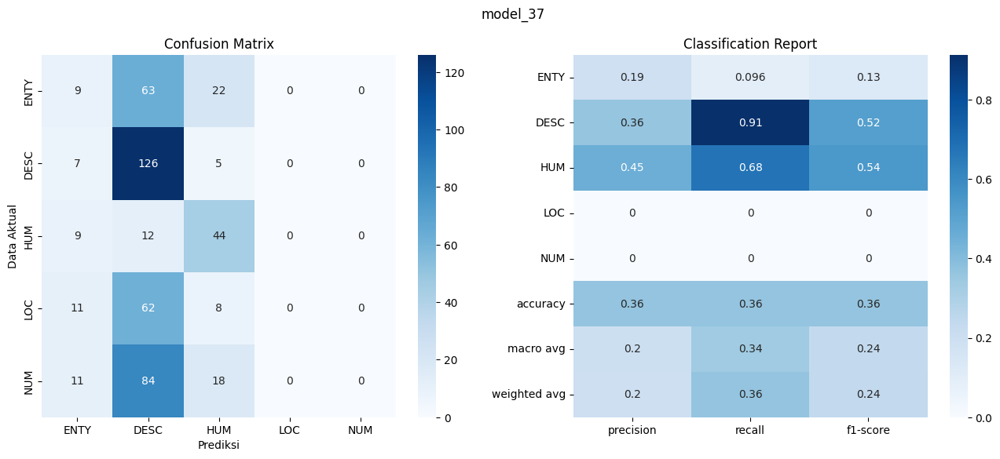

model logged

Scenario 38: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 38
early stopping implemented
traning is stopped by early stopping on epoch: 11
Test Loss: 1.5651, Test Acc: 0.3299

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.18      0.12      0.14        94
        DESC       0.36      0.99      0.52       138
         HUM       0.30      0.23      0.26        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.33       491
   macro avg       0.17      0.27      0.19       491
weighted avg       0.18      0.33      0.21       491


Confusion Matrix:
[[ 11  71  12   0   0]
 [  1 136   1   0   0]
 [ 15  35  15   0   0]
 [ 20  50  11   0   0]
 [ 13  89  11   0   0]]
Test accuracy: 0.3299


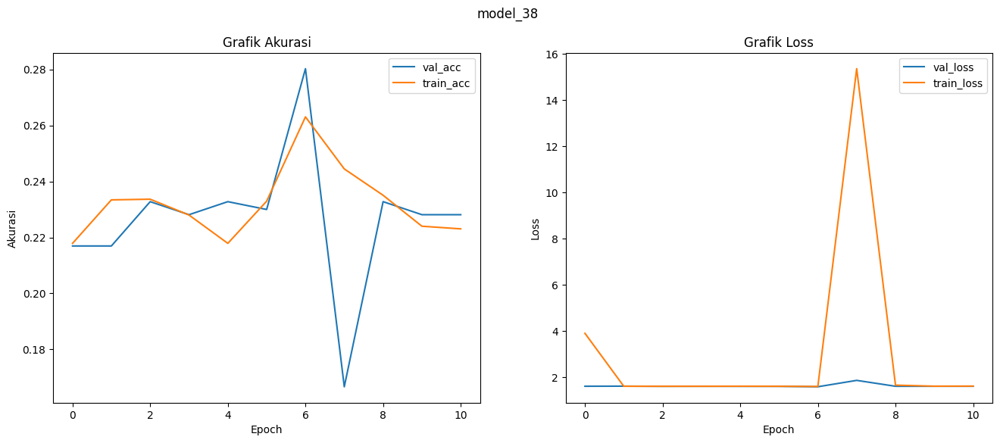

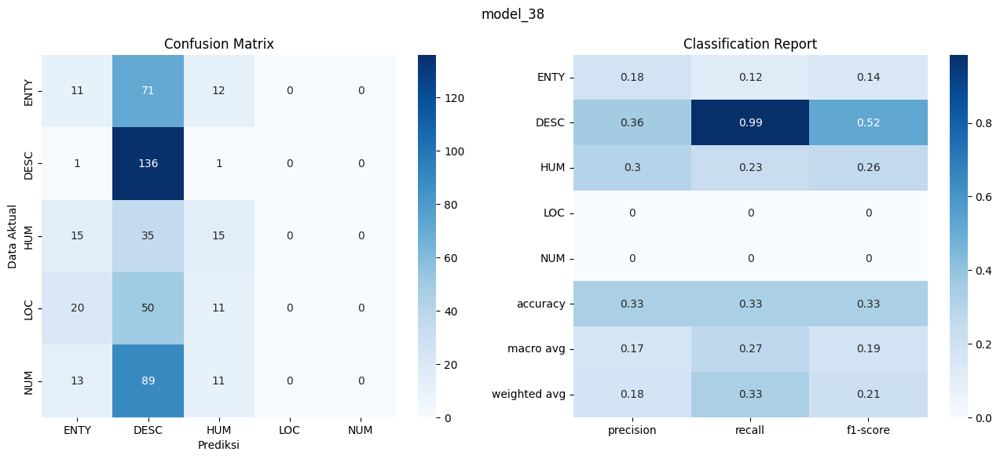

model logged

Scenario 39: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 39
early stopping implemented
traning is stopped by early stopping on epoch: 5
Test Loss: 1.6297, Test Acc: 0.1324

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      1.00      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  0   0  65   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1324


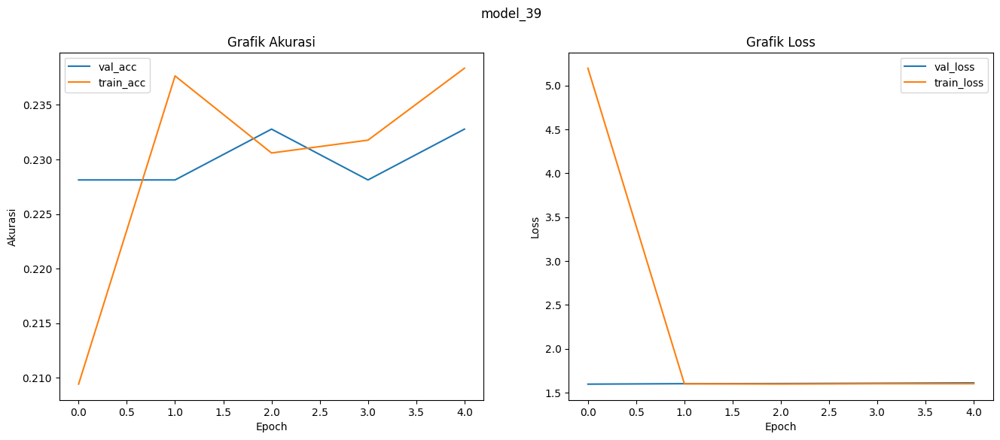

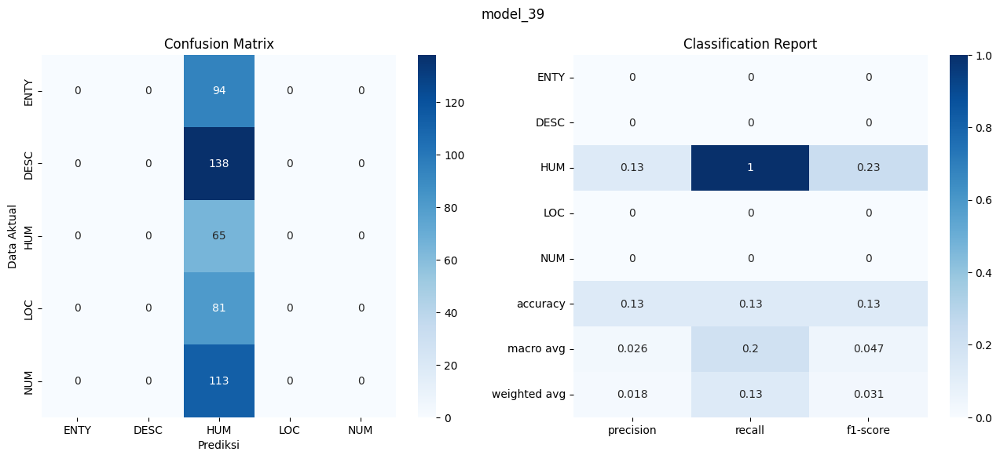

model logged

Scenario 40: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 40
early stopping implemented
traning is stopped by early stopping on epoch: 14
Test Loss: 0.6655, Test Acc: 0.7821

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.80      0.68      0.74        94
        DESC       0.83      0.88      0.85       138
         HUM       0.70      0.77      0.74        65
         LOC       0.80      0.74      0.77        81
         NUM       0.75      0.79      0.77       113

    accuracy                           0.78       491
   macro avg       0.78      0.77      0.77       491
weighted avg       0.78      0.78      0.78       491


Confusion Matrix:
[[ 64   7   7   5  11]
 [  7 121   2   1   7]
 [  2   7  50   4   2]
 [  5   2   4  60  10]
 [  2   9   8   5  89]]
Test accuracy: 0.7821


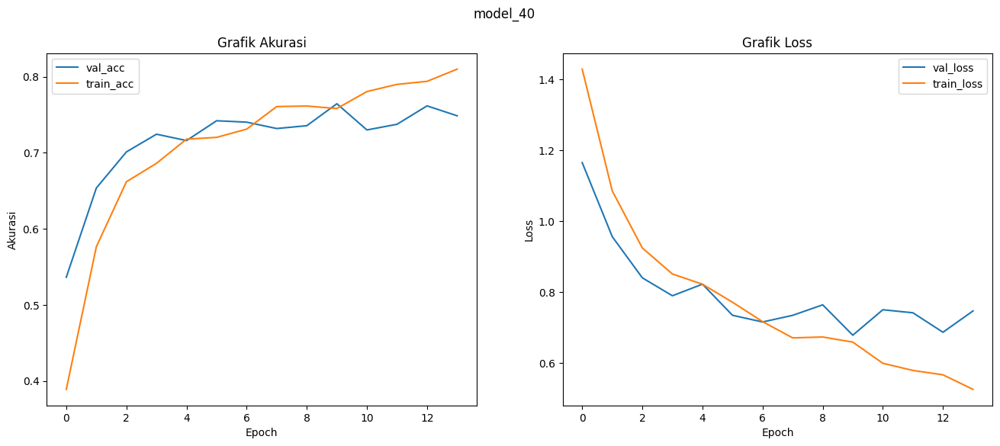

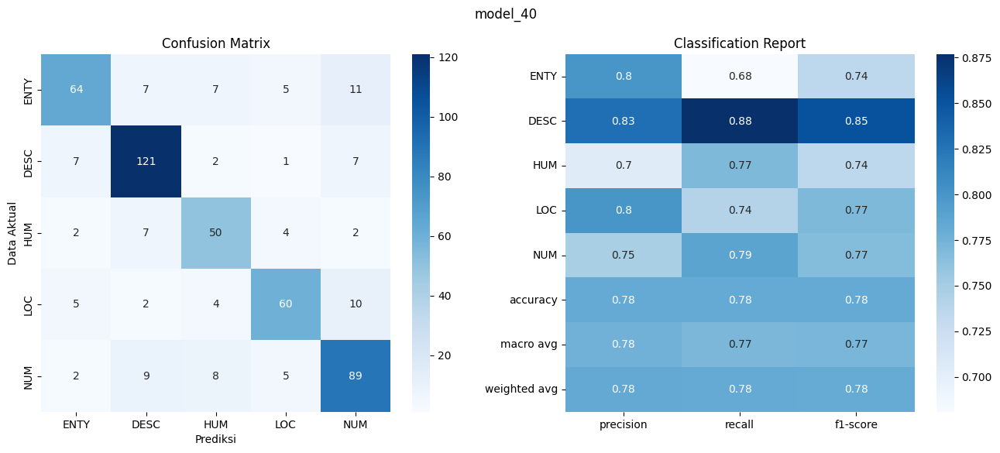

model logged

Scenario 41: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 41
early stopping implemented
traning is stopped by early stopping on epoch: 20
Test Loss: 0.6229, Test Acc: 0.7984

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.87      0.63      0.73        94
        DESC       0.76      0.93      0.84       138
         HUM       0.75      0.83      0.79        65
         LOC       0.73      0.84      0.78        81
         NUM       0.92      0.73      0.81       113

    accuracy                           0.80       491
   macro avg       0.81      0.79      0.79       491
weighted avg       0.81      0.80      0.80       491


Confusion Matrix:
[[ 59  16   5  11   3]
 [  5 129   0   1   3]
 [  0   6  54   5   0]
 [  3   4   5  68   1]
 [  1  14   8   8  82]]
Test accuracy: 0.7984


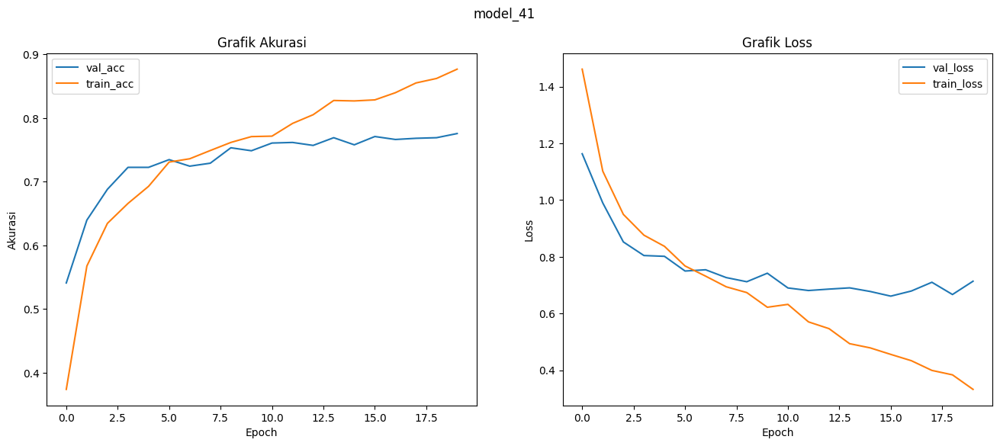

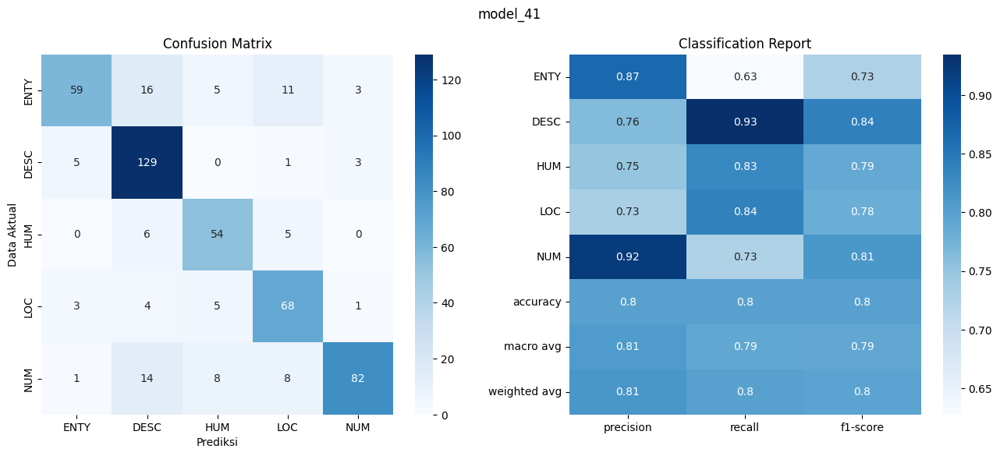

model logged

Scenario 42: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 42
early stopping implemented
traning is stopped by early stopping on epoch: 16
Test Loss: 0.5927, Test Acc: 0.7862

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.77      0.65      0.71        94
        DESC       0.76      0.92      0.83       138
         HUM       0.83      0.77      0.80        65
         LOC       0.75      0.78      0.76        81
         NUM       0.85      0.75      0.80       113

    accuracy                           0.79       491
   macro avg       0.79      0.77      0.78       491
weighted avg       0.79      0.79      0.78       491


Confusion Matrix:
[[ 61  17   4   7   5]
 [  6 127   1   1   3]
 [  3   5  50   6   1]
 [  7   5   0  63   6]
 [  2  14   5   7  85]]
Test accuracy: 0.7862


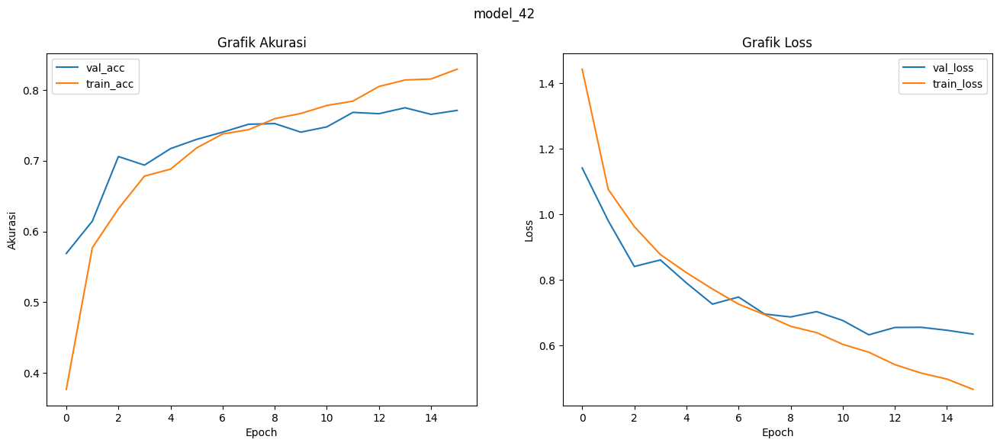

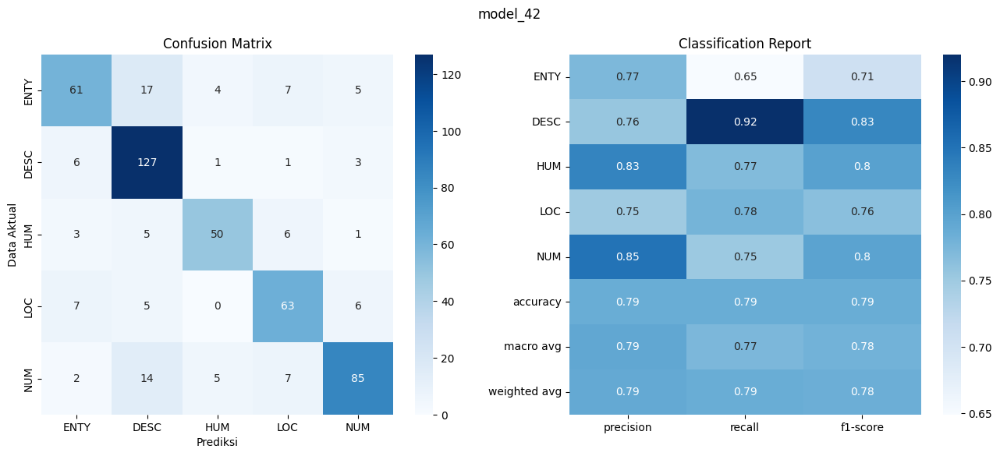

model logged

Scenario 43: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 43
early stopping implemented
traning is stopped by early stopping on epoch: 31
Test Loss: 0.6987, Test Acc: 0.7597

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.79      0.53      0.64        94
        DESC       0.75      0.91      0.82       138
         HUM       0.66      0.82      0.73        65
         LOC       0.75      0.77      0.76        81
         NUM       0.85      0.73      0.78       113

    accuracy                           0.76       491
   macro avg       0.76      0.75      0.75       491
weighted avg       0.77      0.76      0.75       491


Confusion Matrix:
[[ 50  21   9   8   6]
 [  4 126   2   1   5]
 [  2   6  53   4   0]
 [  4   5   6  62   4]
 [  3  10  10   8  82]]
Test accuracy: 0.7597


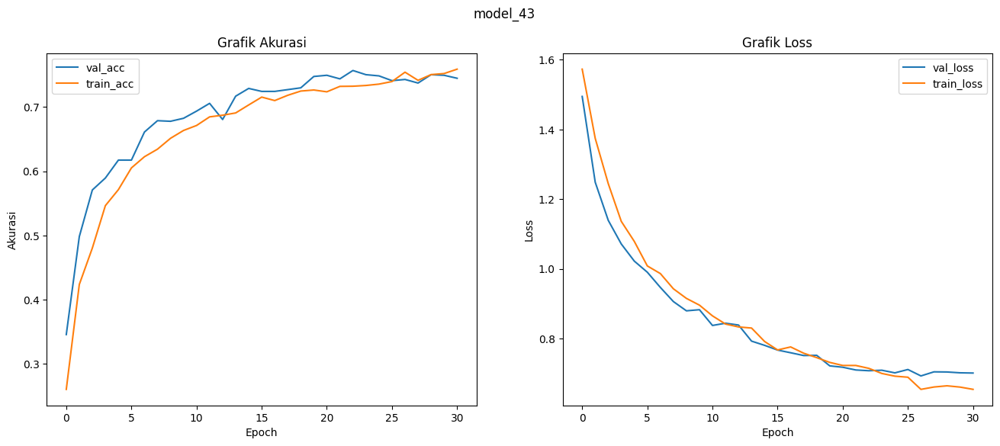

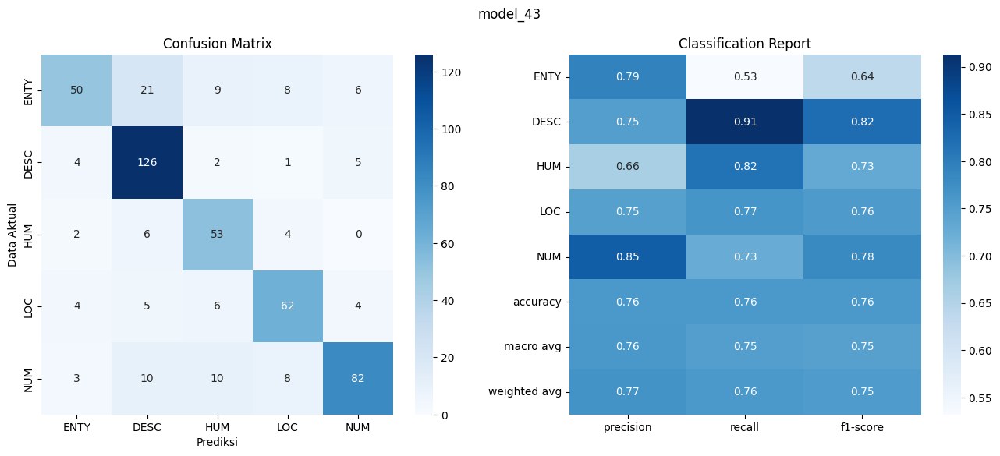

model logged

Scenario 44: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 44
early stopping implemented
traning is stopped by early stopping on epoch: 28
Test Loss: 0.6959, Test Acc: 0.7576

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.80      0.55      0.65        94
        DESC       0.79      0.90      0.84       138
         HUM       0.65      0.77      0.70        65
         LOC       0.70      0.77      0.73        81
         NUM       0.82      0.74      0.78       113

    accuracy                           0.76       491
   macro avg       0.75      0.75      0.74       491
weighted avg       0.76      0.76      0.75       491


Confusion Matrix:
[[ 52  16  10  11   5]
 [  5 124   1   1   7]
 [  2   5  50   7   1]
 [  4   5   4  62   6]
 [  2   7  12   8  84]]
Test accuracy: 0.7576


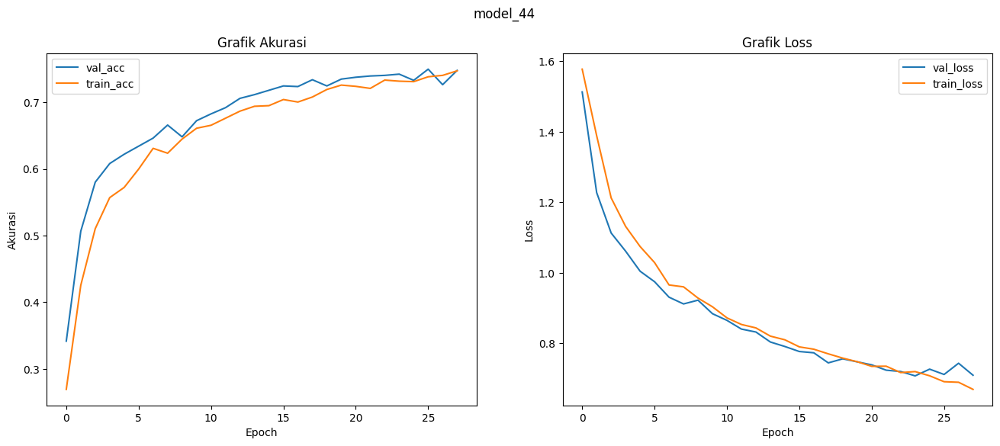

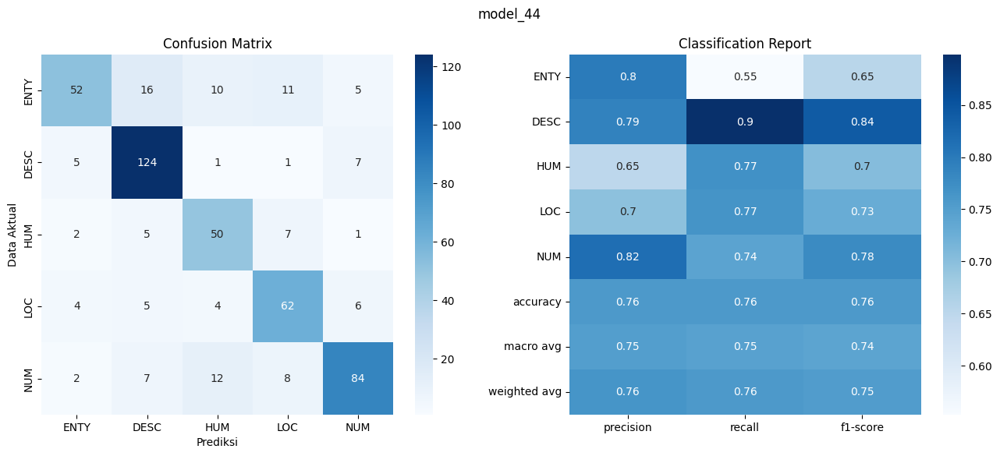

model logged

Scenario 45: {'vocabulary': 'use_stopwords', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 45
early stopping implemented
traning is stopped by early stopping on epoch: 31
Test Loss: 0.6847, Test Acc: 0.7699

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.77      0.59      0.67        94
        DESC       0.78      0.91      0.84       138
         HUM       0.66      0.82      0.73        65
         LOC       0.72      0.78      0.75        81
         NUM       0.89      0.73      0.80       113

    accuracy                           0.77       491
   macro avg       0.77      0.76      0.76       491
weighted avg       0.78      0.77      0.77       491


Confusion Matrix:
[[ 55  17   8  10   4]
 [  6 125   2   1   4]
 [  2   5  53   5   0]
 [  5   6   5  63   2]
 [  3   8  12   8  82]]
Test accuracy: 0.7699


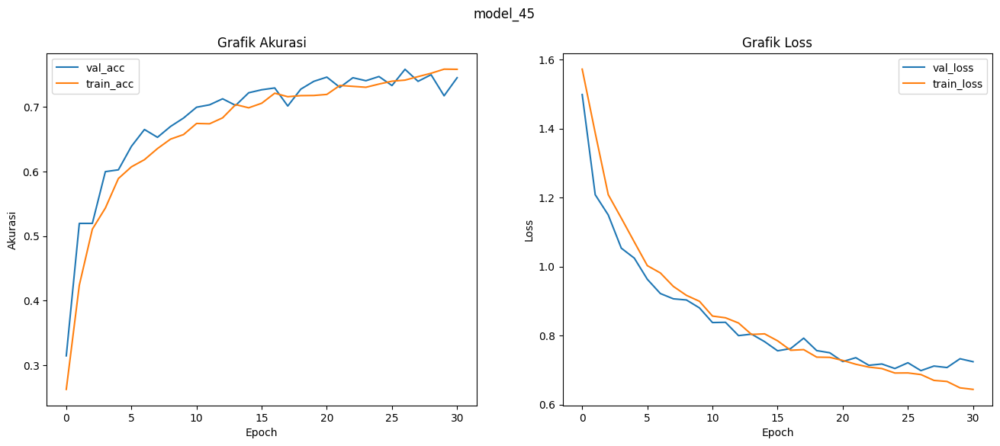

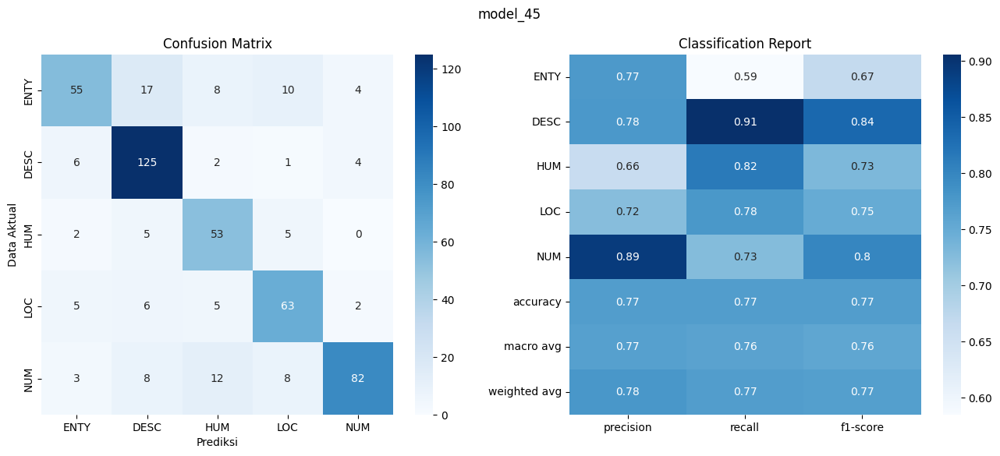

model logged

Scenario 46: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 46
early stopping implemented
traning is stopped by early stopping on epoch: 9
Test Loss: 1.6213, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


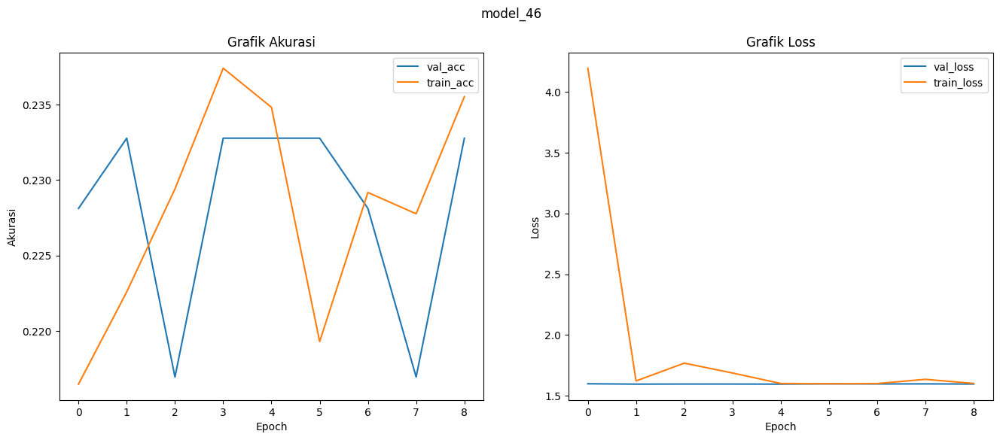

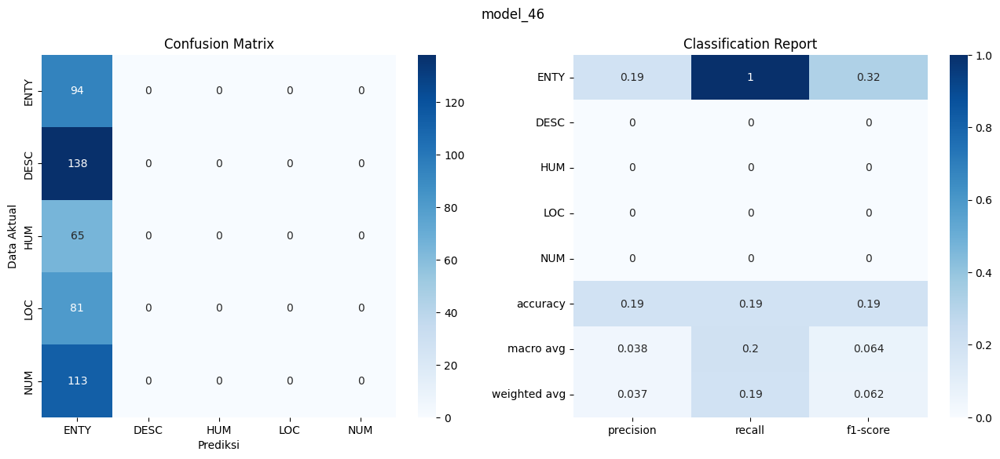

model logged

Scenario 47: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 47
early stopping implemented
traning is stopped by early stopping on epoch: 36
Test Loss: 0.8126, Test Acc: 0.7271

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.48      0.70      0.57        94
        DESC       0.82      0.78      0.80       138
         HUM       0.77      0.85      0.81        65
         LOC       0.74      0.74      0.74        81
         NUM       0.97      0.60      0.74       113

    accuracy                           0.73       491
   macro avg       0.76      0.73      0.73       491
weighted avg       0.77      0.73      0.73       491


Confusion Matrix:
[[ 66  10   8   9   1]
 [ 28 108   1   0   1]
 [  4   0  55   6   0]
 [ 18   0   3  60   0]
 [ 22  13   4   6  68]]
Test accuracy: 0.7271


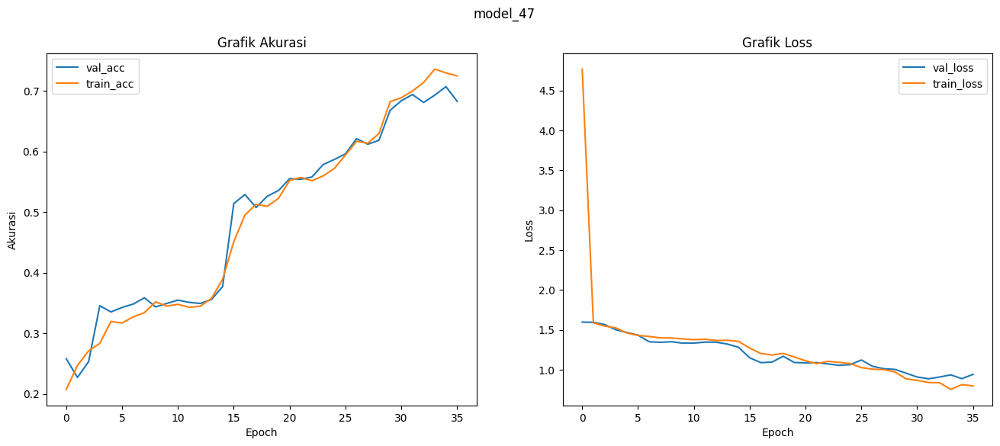

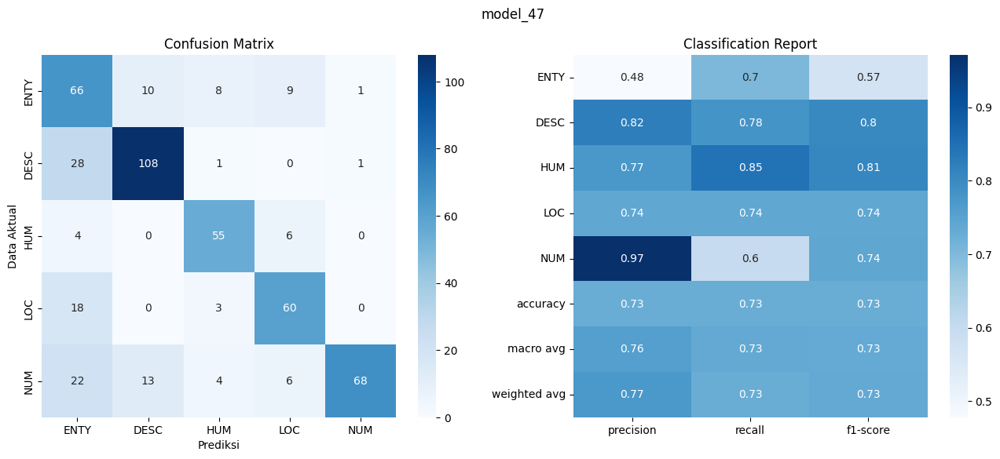

model logged

Scenario 48: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 48
early stopping implemented
traning is stopped by early stopping on epoch: 11
Test Loss: 1.6251, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


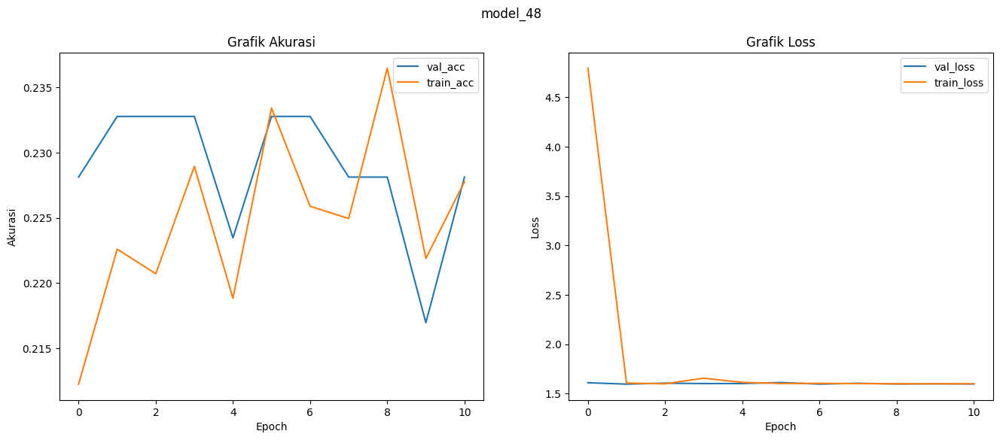

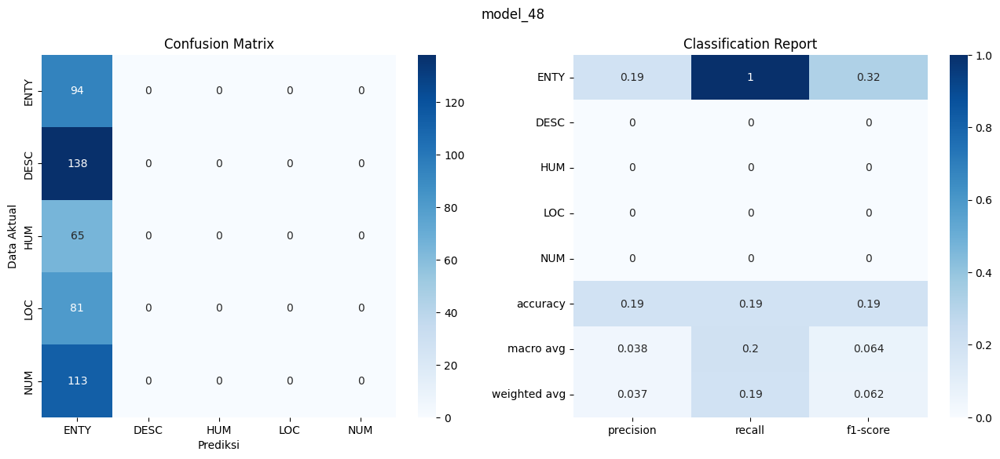

model logged

Scenario 49: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 49
early stopping implemented
traning is stopped by early stopping on epoch: 29
Test Loss: 0.5711, Test Acc: 0.8045

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.89      0.66      0.76        94
        DESC       0.74      0.97      0.84       138
         HUM       0.78      0.91      0.84        65
         LOC       0.78      0.80      0.79        81
         NUM       0.93      0.66      0.77       113

    accuracy                           0.80       491
   macro avg       0.82      0.80      0.80       491
weighted avg       0.82      0.80      0.80       491


Confusion Matrix:
[[ 62  17   6   7   2]
 [  3 134   0   0   1]
 [  0   4  59   2   0]
 [  4   6   3  65   3]
 [  1  20   8   9  75]]
Test accuracy: 0.8045


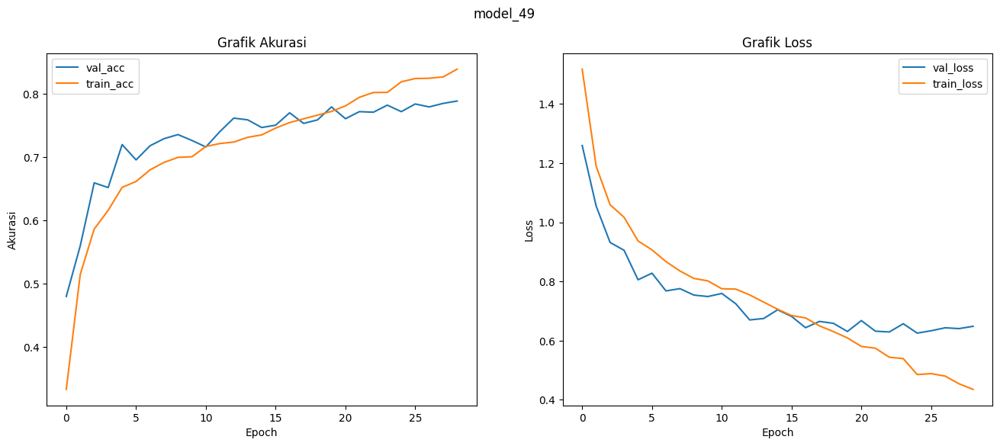

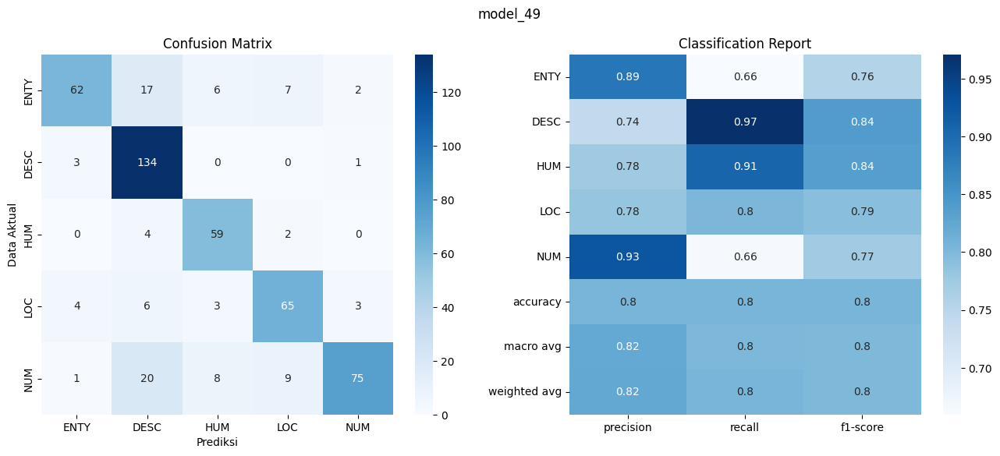

model logged

Scenario 50: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 50
early stopping implemented
traning is stopped by early stopping on epoch: 25
Test Loss: 0.5926, Test Acc: 0.7902

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.76      0.68      0.72        94
        DESC       0.83      0.89      0.86       138
         HUM       0.67      0.83      0.74        65
         LOC       0.78      0.78      0.78        81
         NUM       0.87      0.74      0.80       113

    accuracy                           0.79       491
   macro avg       0.78      0.78      0.78       491
weighted avg       0.80      0.79      0.79       491


Confusion Matrix:
[[ 64  12   6   7   5]
 [  6 123   6   0   3]
 [  4   4  54   3   0]
 [  5   2   6  63   5]
 [  5   7   9   8  84]]
Test accuracy: 0.7902


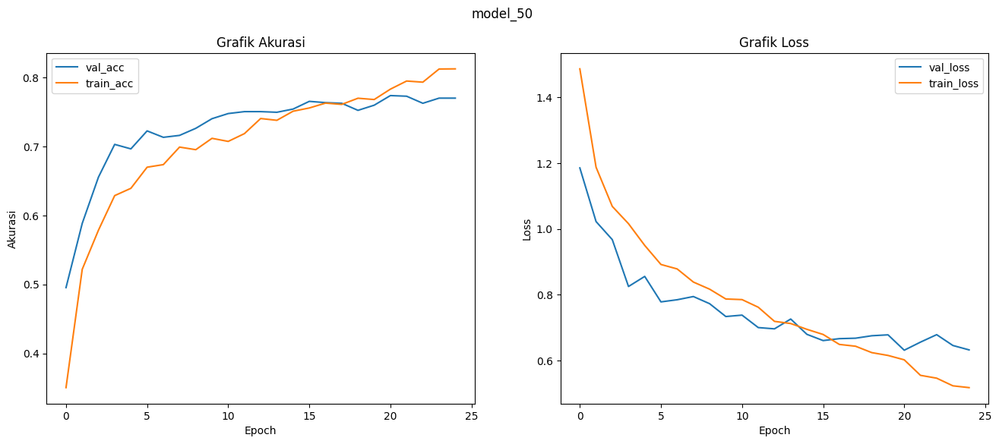

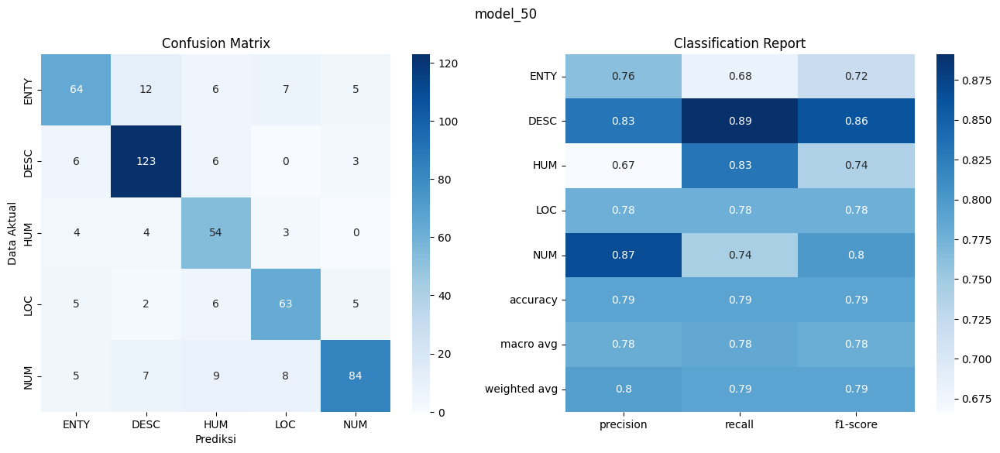

model logged

Scenario 51: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 51
early stopping implemented
traning is stopped by early stopping on epoch: 33
Test Loss: 0.5449, Test Acc: 0.8248

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.88      0.76      0.81        94
        DESC       0.79      0.93      0.85       138
         HUM       0.82      0.78      0.80        65
         LOC       0.77      0.86      0.81        81
         NUM       0.89      0.75      0.82       113

    accuracy                           0.82       491
   macro avg       0.83      0.82      0.82       491
weighted avg       0.83      0.82      0.82       491


Confusion Matrix:
[[ 71  11   3   6   3]
 [  5 128   1   1   3]
 [  1   8  51   5   0]
 [  3   3   1  70   4]
 [  1  12   6   9  85]]
Test accuracy: 0.8248


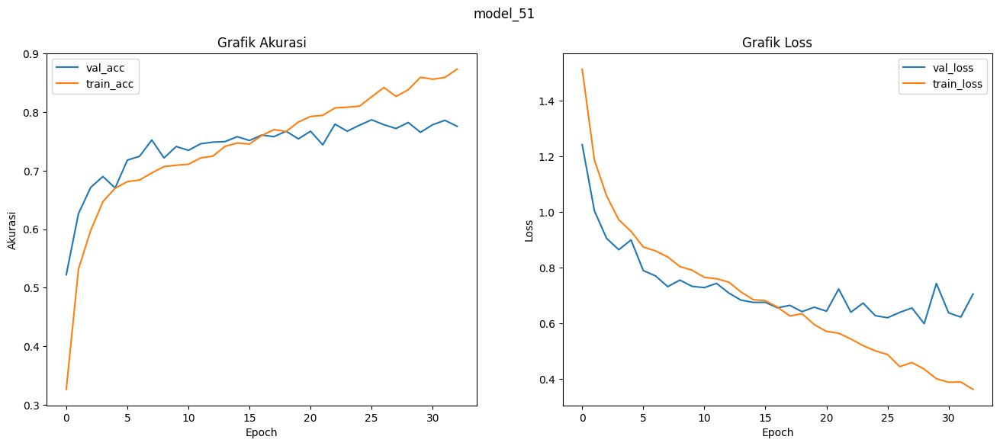

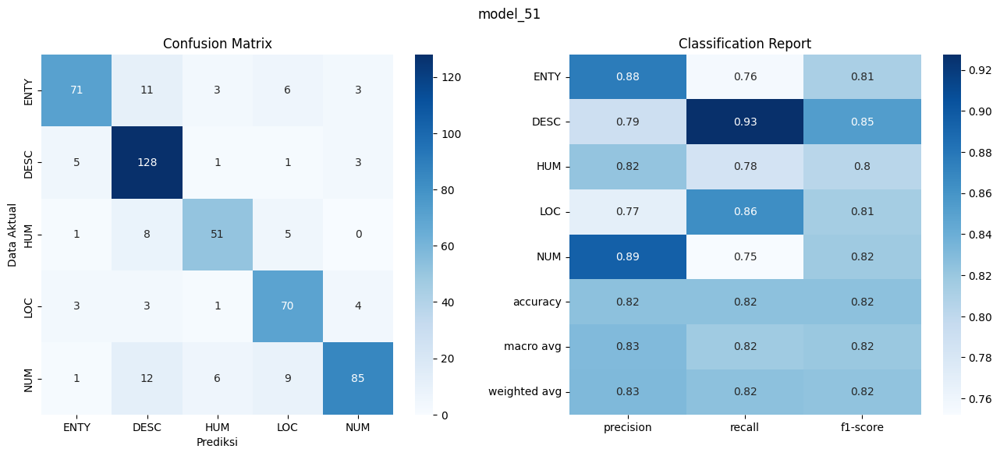

model logged

Scenario 52: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 52
early stopping implemented
traning is stopped by early stopping on epoch: 73
Test Loss: 0.6291, Test Acc: 0.7902

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.79      0.56      0.66        94
        DESC       0.79      0.93      0.85       138
         HUM       0.66      0.83      0.73        65
         LOC       0.80      0.79      0.80        81
         NUM       0.90      0.79      0.84       113

    accuracy                           0.79       491
   macro avg       0.79      0.78      0.78       491
weighted avg       0.80      0.79      0.79       491


Confusion Matrix:
[[ 53  18  12   7   4]
 [  6 128   2   0   2]
 [  2   5  54   4   0]
 [  5   5   3  64   4]
 [  1   7  11   5  89]]
Test accuracy: 0.7902


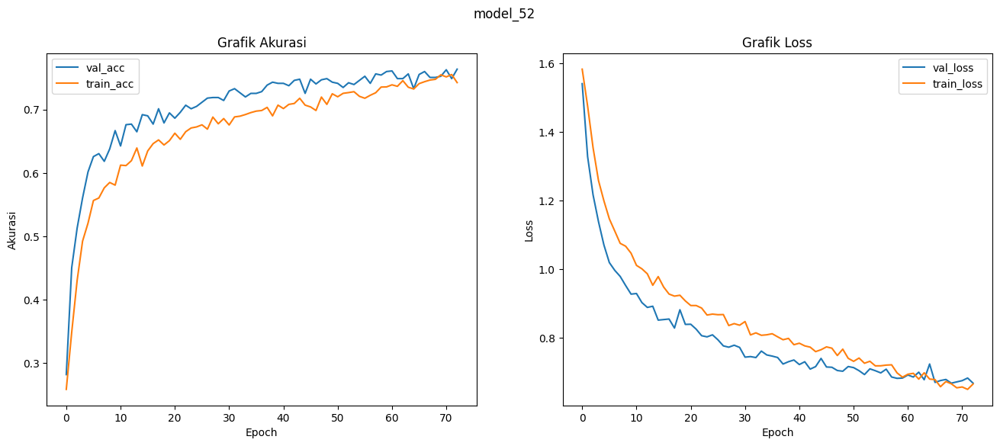

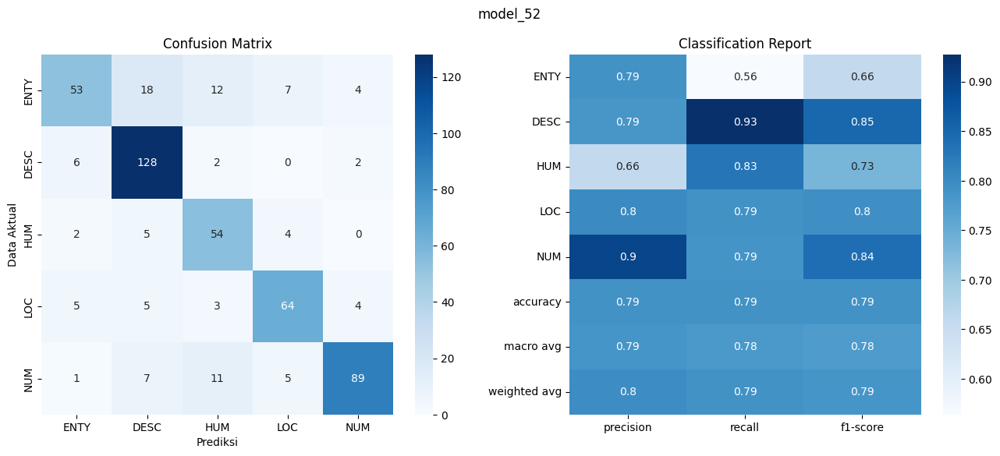

model logged

Scenario 53: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 53
early stopping implemented
traning is stopped by early stopping on epoch: 50
Test Loss: 0.6768, Test Acc: 0.7658

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.76      0.57      0.65        94
        DESC       0.76      0.92      0.83       138
         HUM       0.68      0.78      0.73        65
         LOC       0.75      0.77      0.76        81
         NUM       0.87      0.73      0.79       113

    accuracy                           0.77       491
   macro avg       0.76      0.75      0.75       491
weighted avg       0.77      0.77      0.76       491


Confusion Matrix:
[[ 54  18   9  10   3]
 [  5 127   1   1   4]
 [  4   6  51   4   0]
 [  5   6   3  62   5]
 [  3  11  11   6  82]]
Test accuracy: 0.7658


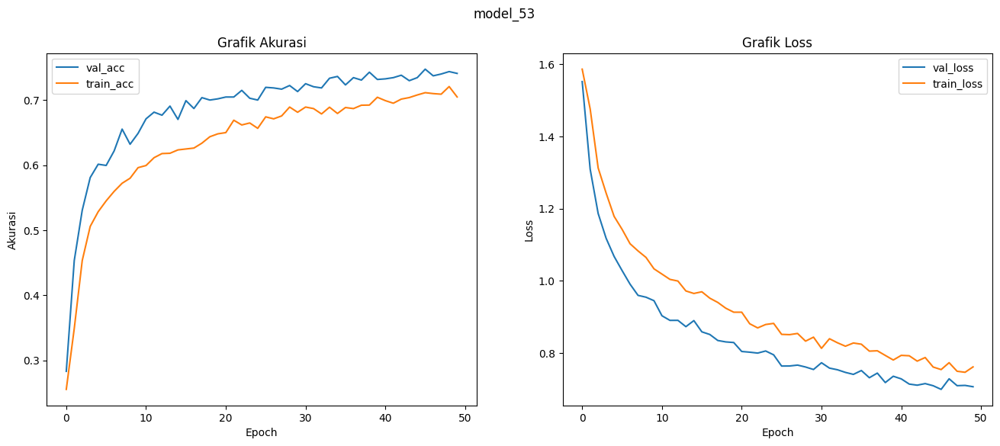

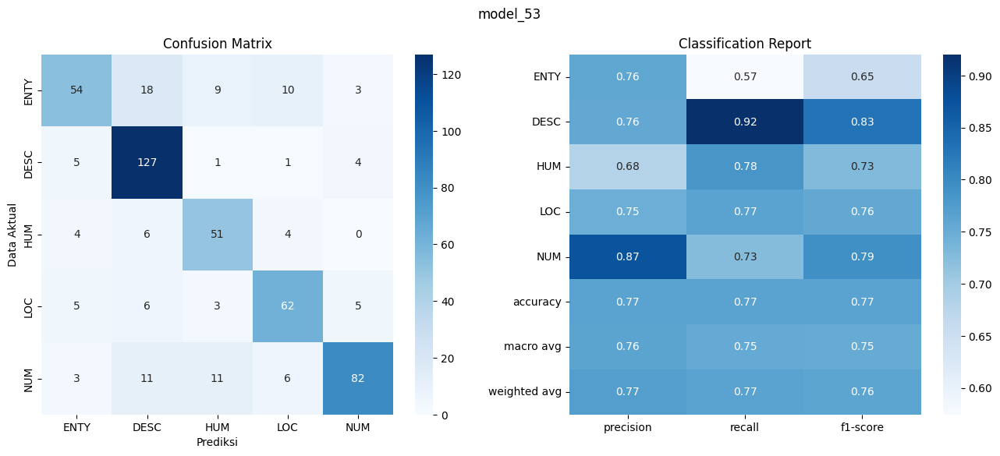

model logged

Scenario 54: {'vocabulary': 'use_stopwords', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 54
early stopping implemented
traning is stopped by early stopping on epoch: 62
Test Loss: 0.6397, Test Acc: 0.7678

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.79      0.59      0.67        94
        DESC       0.77      0.94      0.85       138
         HUM       0.67      0.78      0.72        65
         LOC       0.70      0.77      0.73        81
         NUM       0.90      0.70      0.79       113

    accuracy                           0.77       491
   macro avg       0.77      0.76      0.75       491
weighted avg       0.78      0.77      0.76       491


Confusion Matrix:
[[ 55  17   9   9   4]
 [  4 130   1   0   3]
 [  3   5  51   6   0]
 [  6   7   4  62   2]
 [  2  10  11  11  79]]
Test accuracy: 0.7678


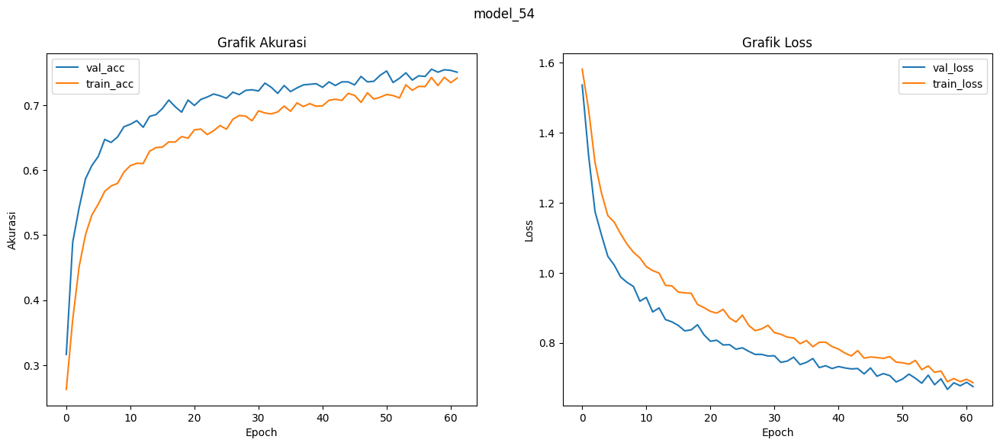

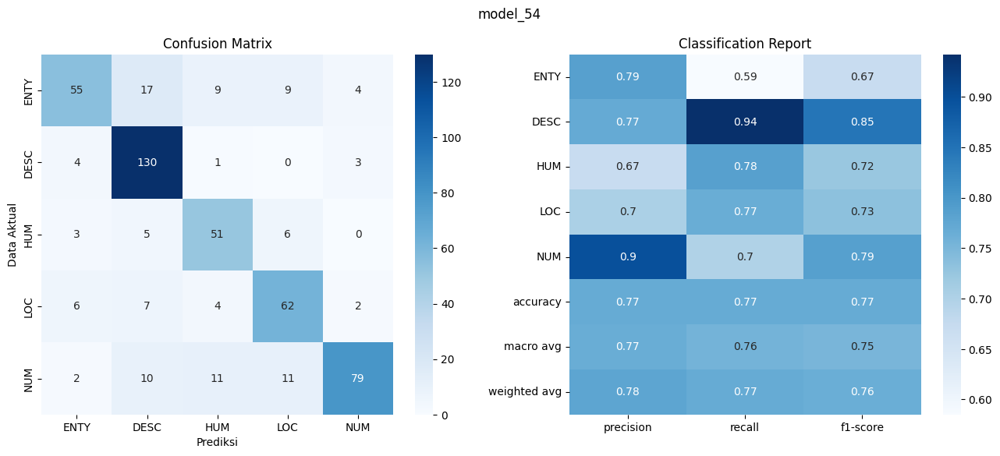

model logged

Scenario 55: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.01}
Jumlah vocabulary/kosa kata: 7375
created new data with intervention: use_stemming
Starting training for scenario 55
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6159, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Te

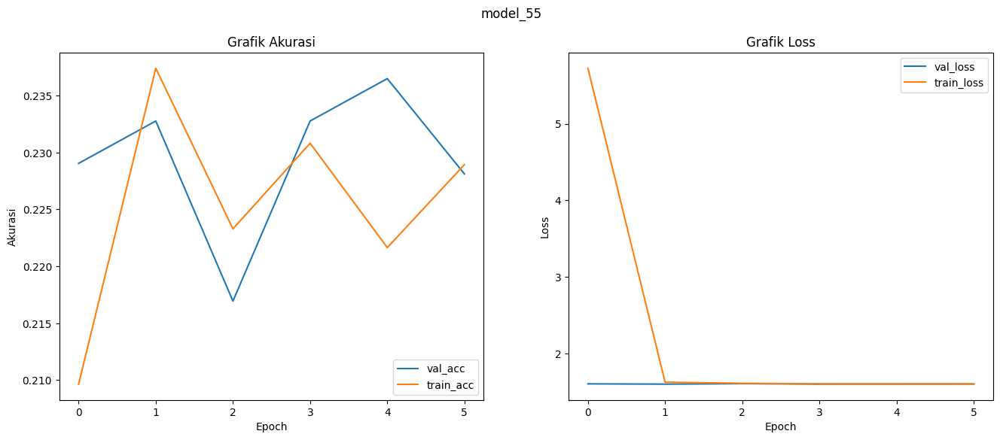

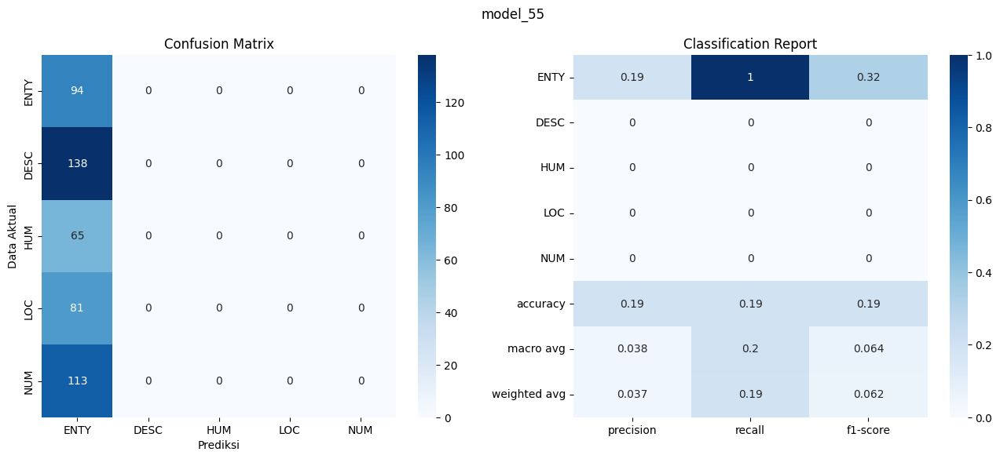

model logged

Scenario 56: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 56
early stopping implemented
traning is stopped by early stopping on epoch: 10
Test Loss: 1.6155, Test Acc: 0.2118

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.38      0.30      0.33       138
         HUM       0.16      0.97      0.28        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.21       491
   macro avg       0.11      0.25      0.12       491
weighted avg       0.13      0.21      0.13       491


Confusion Matrix:
[[ 0 27 67  0  0]
 [ 0 41 97  0  0]
 [ 0  2 63  0  0]
 [ 0 15 66  0  0]
 [ 0 24 89  0  0]]
Test accuracy: 0.2118


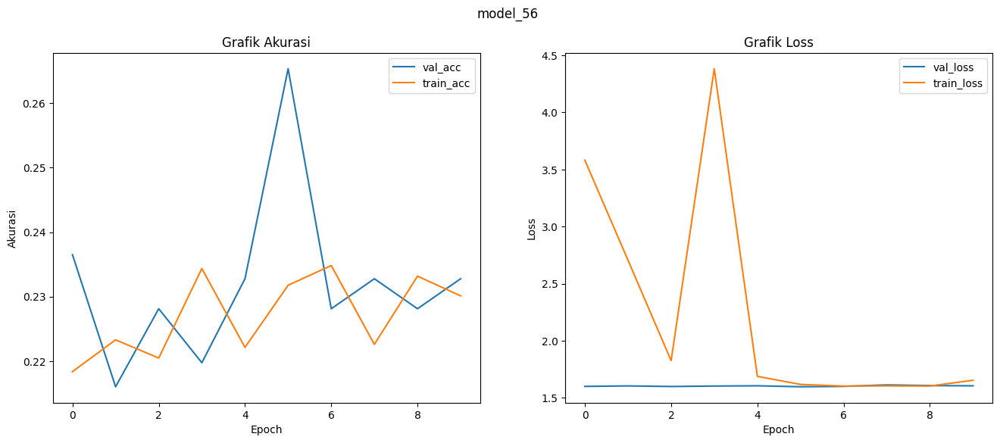

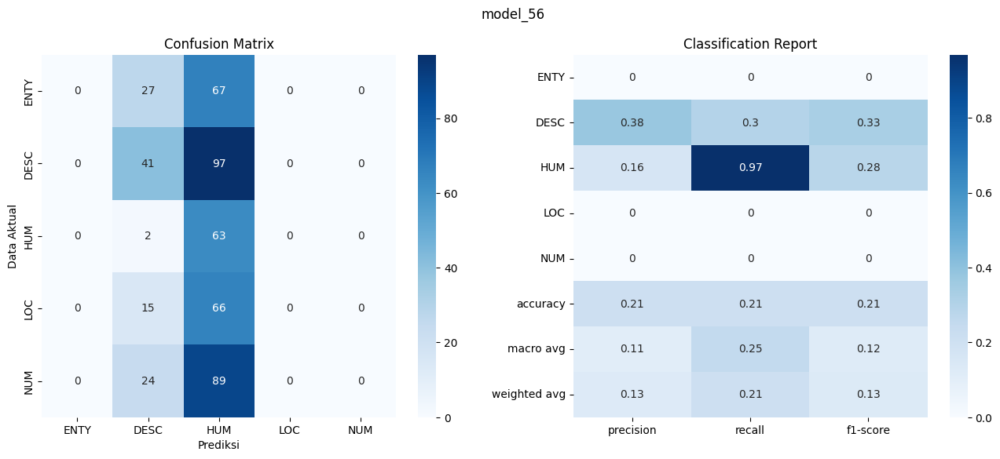

model logged

Scenario 57: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 57
early stopping implemented
traning is stopped by early stopping on epoch: 9
Test Loss: 1.6220, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


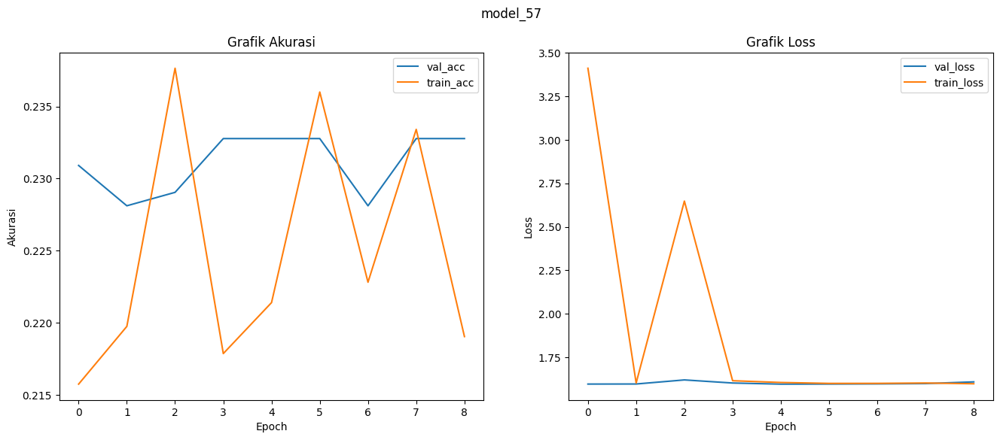

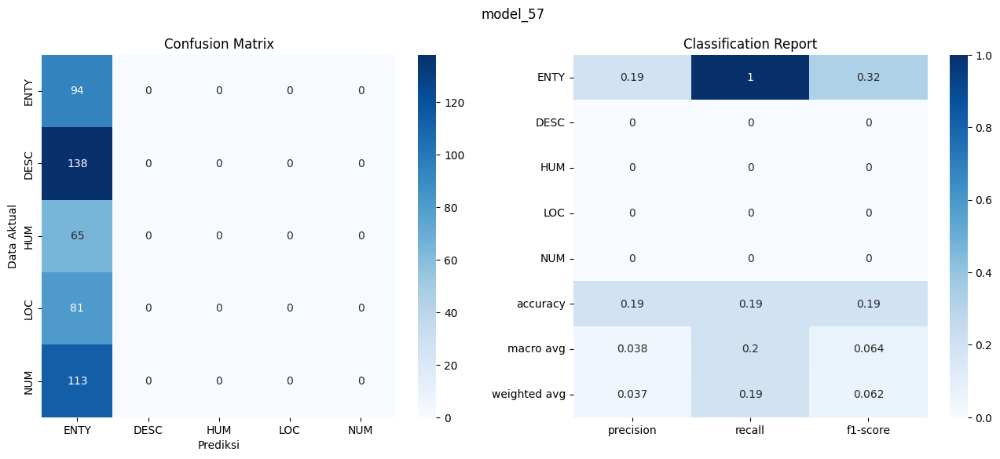

model logged

Scenario 58: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 58
early stopping implemented
traning is stopped by early stopping on epoch: 14
Test Loss: 0.3463, Test Acc: 0.8656

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.78      0.73      0.75        94
        DESC       0.88      0.93      0.91       138
         HUM       0.88      0.89      0.89        65
         LOC       0.82      0.86      0.84        81
         NUM       0.95      0.88      0.91       113

    accuracy                           0.87       491
   macro avg       0.86      0.86      0.86       491
weighted avg       0.87      0.87      0.87       491


Confusion Matrix:
[[ 69   9   3  10   3]
 [  5 129   2   1   1]
 [  5   2  58   0   0]
 [  7   2   1  70   1]
 [  3   5   2   4  99]]
Test accuracy: 0.8656


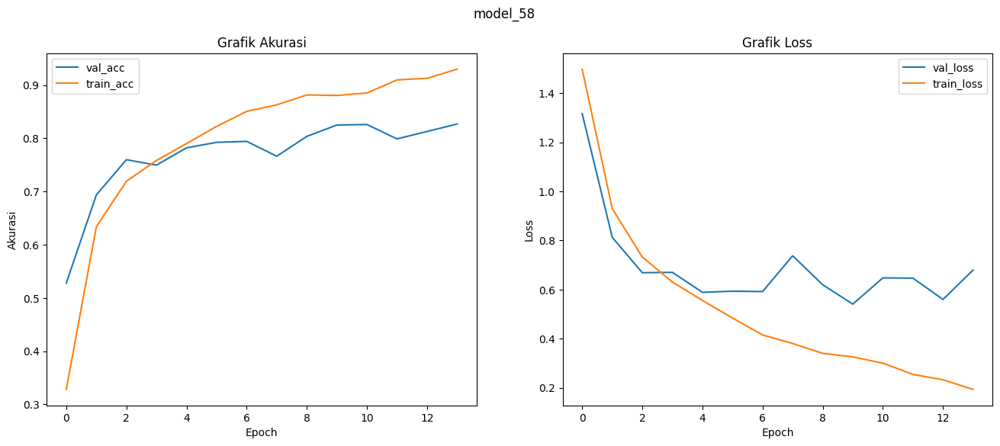

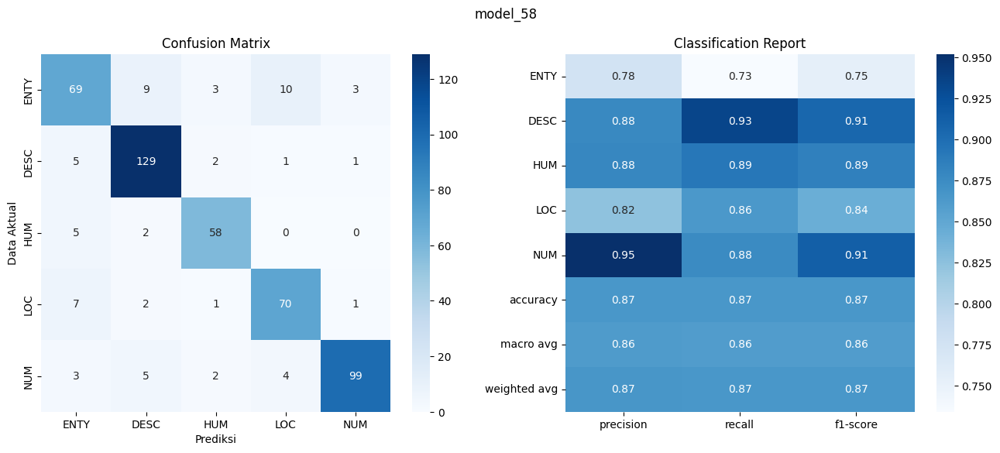

model logged

Scenario 59: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 59
early stopping implemented
traning is stopped by early stopping on epoch: 12
Test Loss: 0.3984, Test Acc: 0.8554

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.80      0.68      0.74        94
        DESC       0.85      0.98      0.91       138
         HUM       0.90      0.88      0.89        65
         LOC       0.83      0.85      0.84        81
         NUM       0.89      0.84      0.86       113

    accuracy                           0.86       491
   macro avg       0.86      0.85      0.85       491
weighted avg       0.85      0.86      0.85       491


Confusion Matrix:
[[ 64   8   4   8  10]
 [  2 135   0   0   1]
 [  5   1  57   2   0]
 [  6   4   1  69   1]
 [  3  10   1   4  95]]
Test accuracy: 0.8554


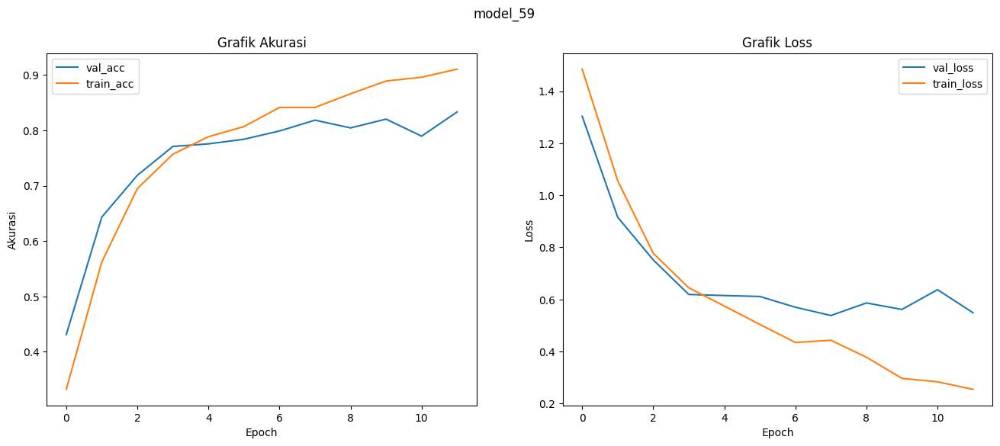

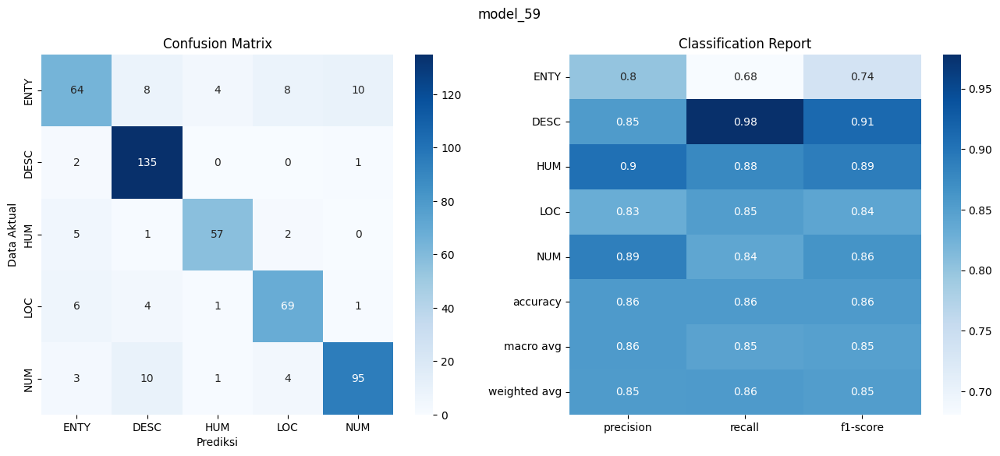

model logged

Scenario 60: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 60
early stopping implemented
traning is stopped by early stopping on epoch: 14
Test Loss: 0.3655, Test Acc: 0.8615

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.76      0.70      0.73        94
        DESC       0.90      0.92      0.91       138
         HUM       0.87      0.91      0.89        65
         LOC       0.85      0.85      0.85        81
         NUM       0.89      0.90      0.90       113

    accuracy                           0.86       491
   macro avg       0.85      0.86      0.86       491
weighted avg       0.86      0.86      0.86       491


Confusion Matrix:
[[ 66   7   6   6   9]
 [  7 127   1   1   2]
 [  3   2  59   1   0]
 [  9   1   1  69   1]
 [  2   4   1   4 102]]
Test accuracy: 0.8615


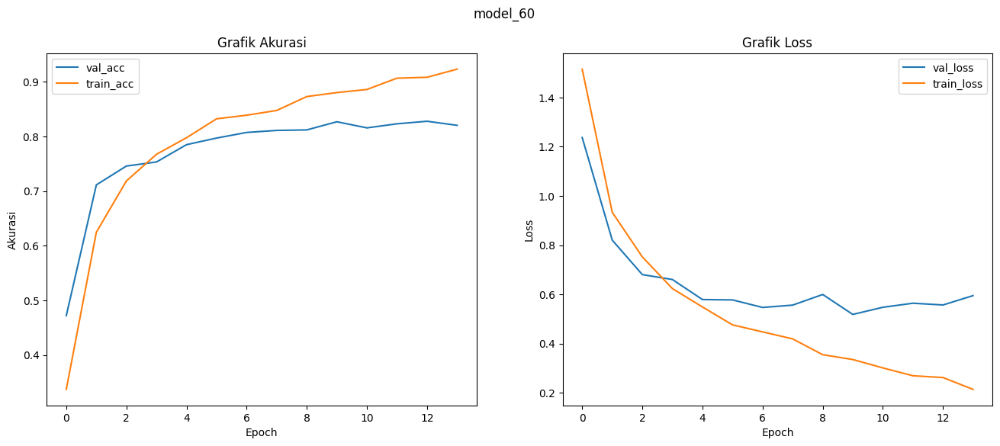

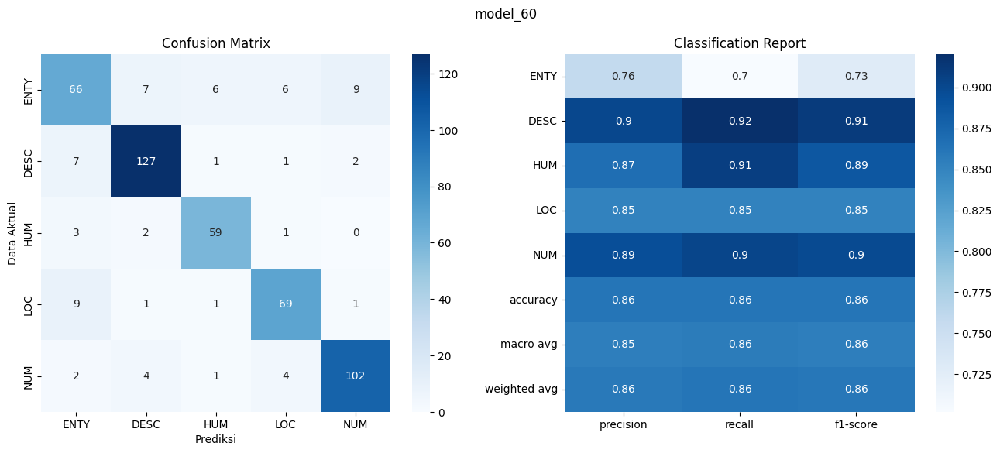

model logged

Scenario 61: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 61
early stopping implemented
traning is stopped by early stopping on epoch: 35
Test Loss: 0.4066, Test Acc: 0.8615

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.79      0.67      0.72        94
        DESC       0.87      0.93      0.90       138
         HUM       0.89      0.89      0.89        65
         LOC       0.78      0.94      0.85        81
         NUM       0.96      0.86      0.91       113

    accuracy                           0.86       491
   macro avg       0.86      0.86      0.86       491
weighted avg       0.86      0.86      0.86       491


Confusion Matrix:
[[ 63  11   7  11   2]
 [  6 129   0   2   1]
 [  3   2  58   2   0]
 [  4   0   0  76   1]
 [  4   6   0   6  97]]
Test accuracy: 0.8615


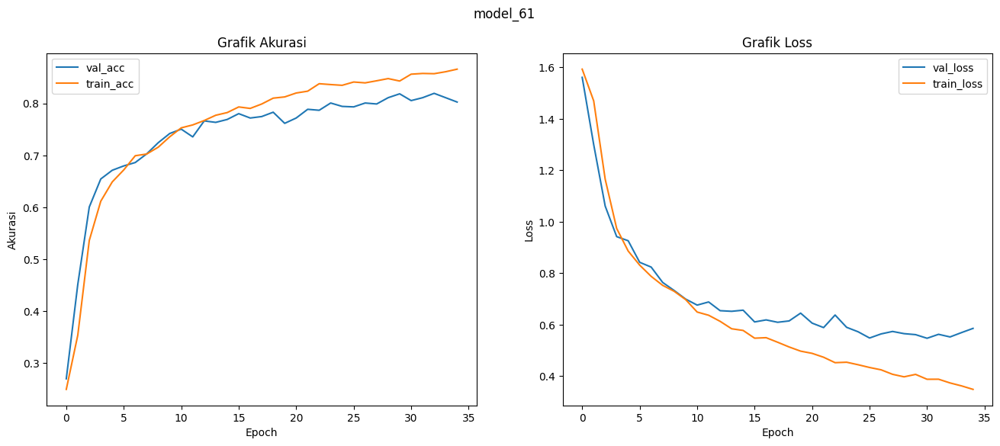

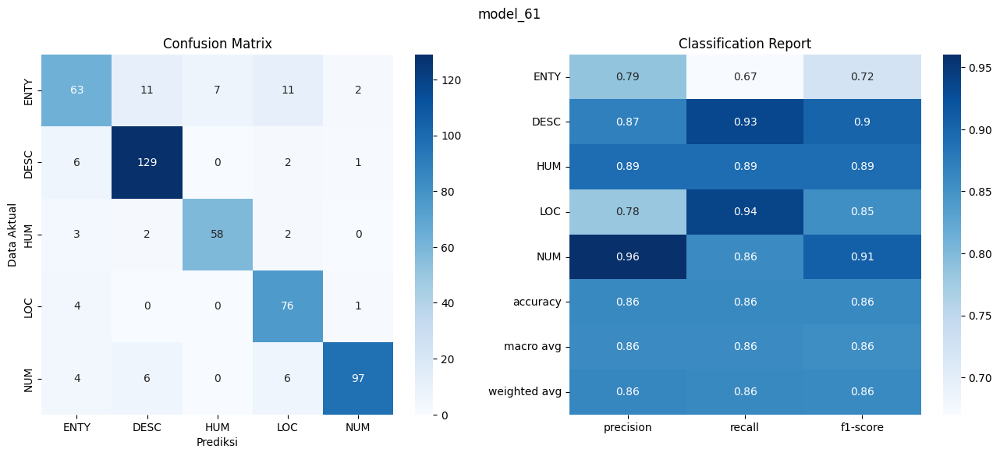

model logged

Scenario 62: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 62
early stopping implemented
traning is stopped by early stopping on epoch: 40
Test Loss: 0.3786, Test Acc: 0.8717

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.85      0.67      0.75        94
        DESC       0.85      0.97      0.91       138
         HUM       0.87      0.94      0.90        65
         LOC       0.83      0.89      0.86        81
         NUM       0.96      0.87      0.91       113

    accuracy                           0.87       491
   macro avg       0.87      0.87      0.87       491
weighted avg       0.87      0.87      0.87       491


Confusion Matrix:
[[ 63  12   7   9   3]
 [  4 134   0   0   0]
 [  1   2  61   1   0]
 [  4   4   0  72   1]
 [  2   6   2   5  98]]
Test accuracy: 0.8717


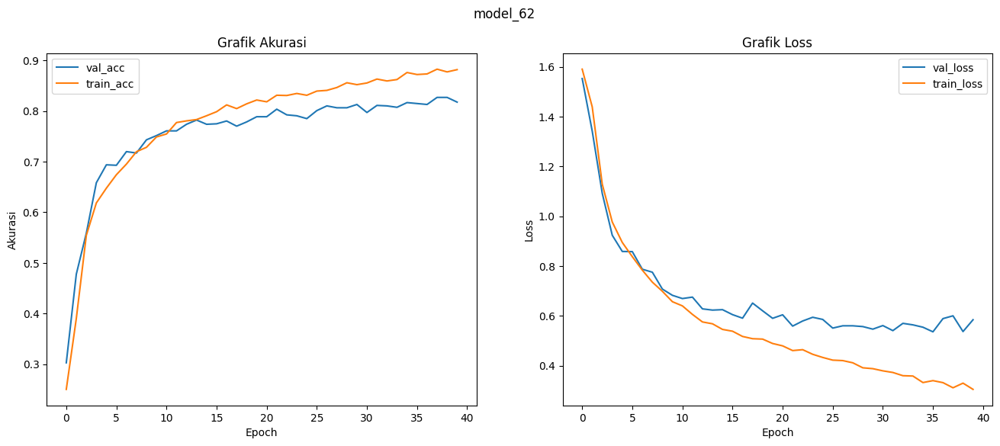

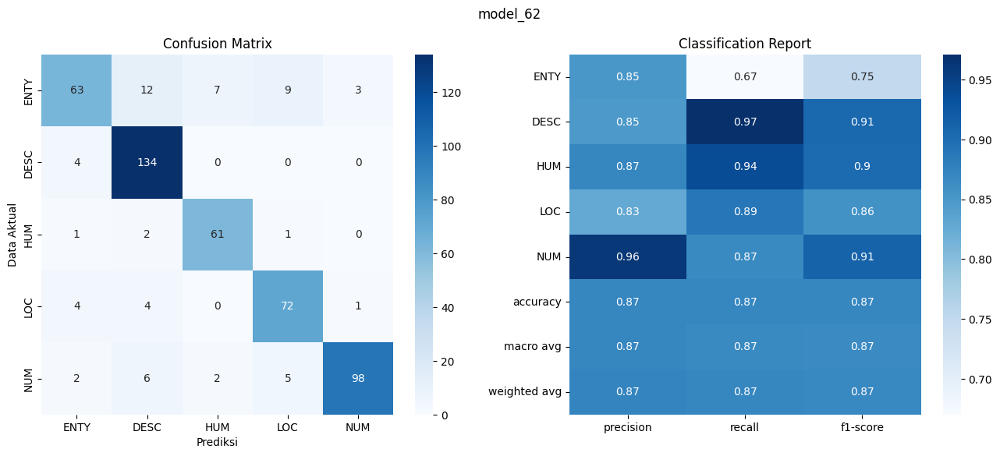

model logged

Scenario 63: {'vocabulary': 'use_stemming', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 63
early stopping implemented
traning is stopped by early stopping on epoch: 28
Test Loss: 0.3853, Test Acc: 0.8615

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.84      0.66      0.74        94
        DESC       0.84      0.96      0.90       138
         HUM       0.89      0.91      0.90        65
         LOC       0.83      0.85      0.84        81
         NUM       0.91      0.88      0.90       113

    accuracy                           0.86       491
   macro avg       0.86      0.85      0.86       491
weighted avg       0.86      0.86      0.86       491


Confusion Matrix:
[[ 62  13   6   6   7]
 [  4 133   0   0   1]
 [  2   2  59   2   0]
 [  4   6   0  69   2]
 [  2   4   1   6 100]]
Test accuracy: 0.8615


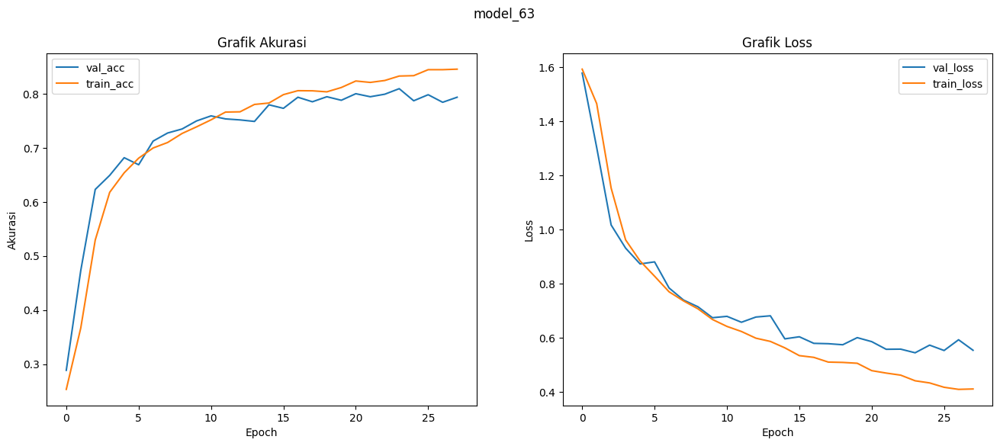

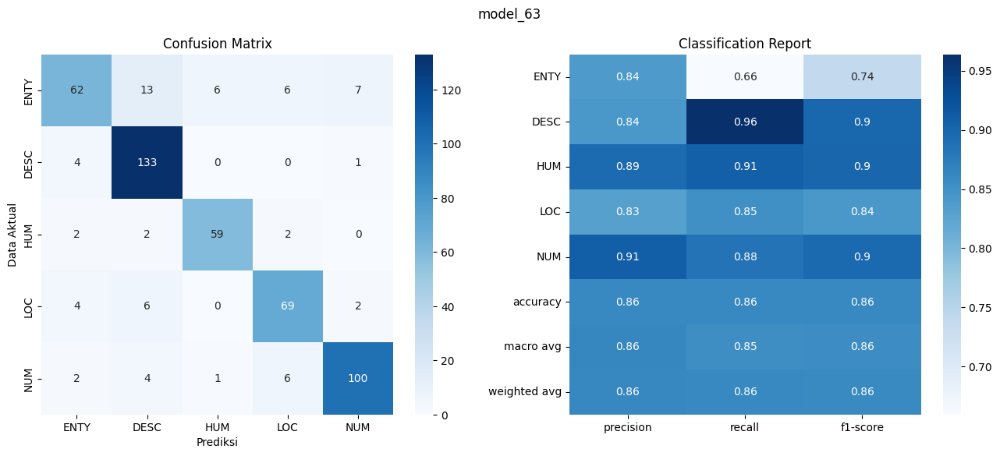

model logged

Scenario 64: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 64
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6241, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


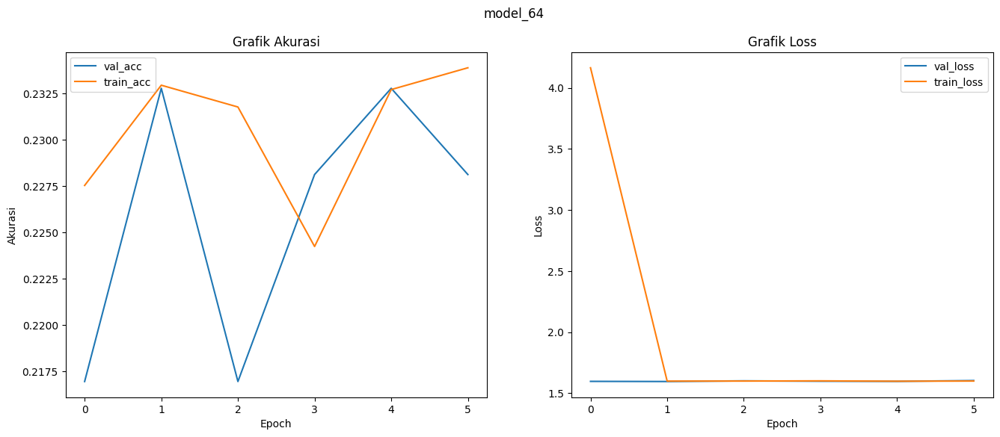

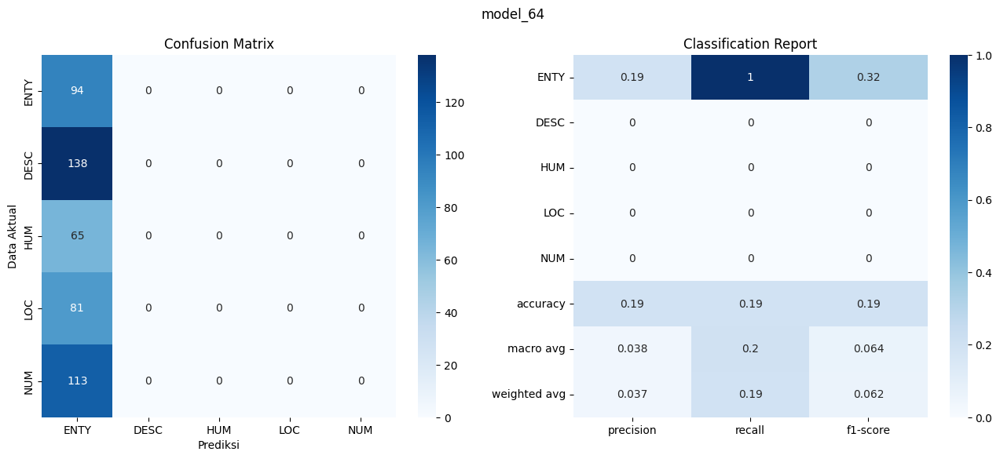

model logged

Scenario 65: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 65
early stopping implemented
traning is stopped by early stopping on epoch: 5
Test Loss: 1.6219, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


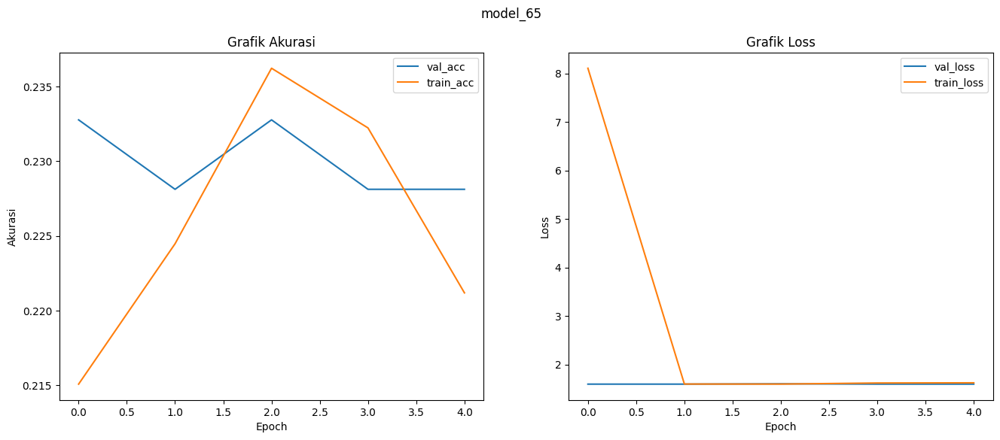

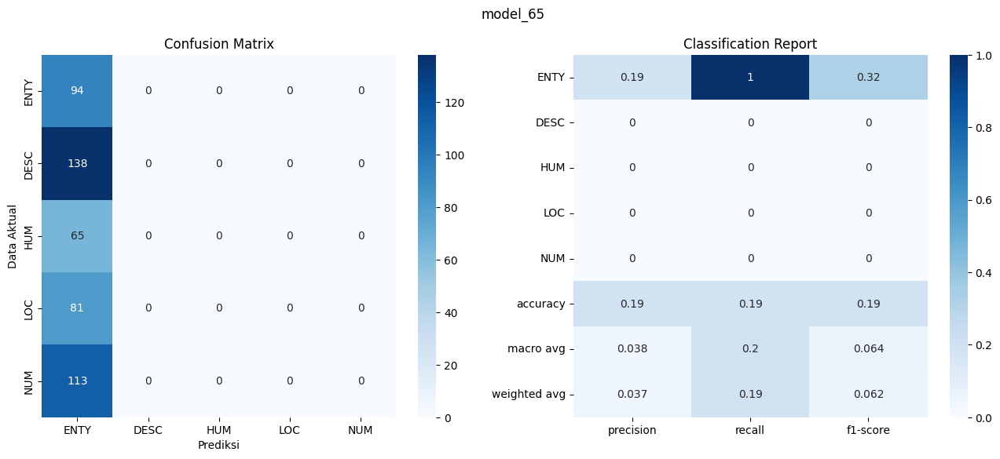

model logged

Scenario 66: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 66
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6215, Test Acc: 0.1752

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.27      0.24      0.26        94
        DESC       0.00      0.00      0.00       138
         HUM       0.16      0.97      0.27        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.18       491
   macro avg       0.08      0.24      0.10       491
weighted avg       0.07      0.18      0.08       491


Confusion Matrix:
[[ 23   0  71   0   0]
 [ 13   0 125   0   0]
 [  2   0  63   0   0]
 [ 11   0  70   0   0]
 [ 37   0  76   0   0]]
Test accuracy: 0.1752


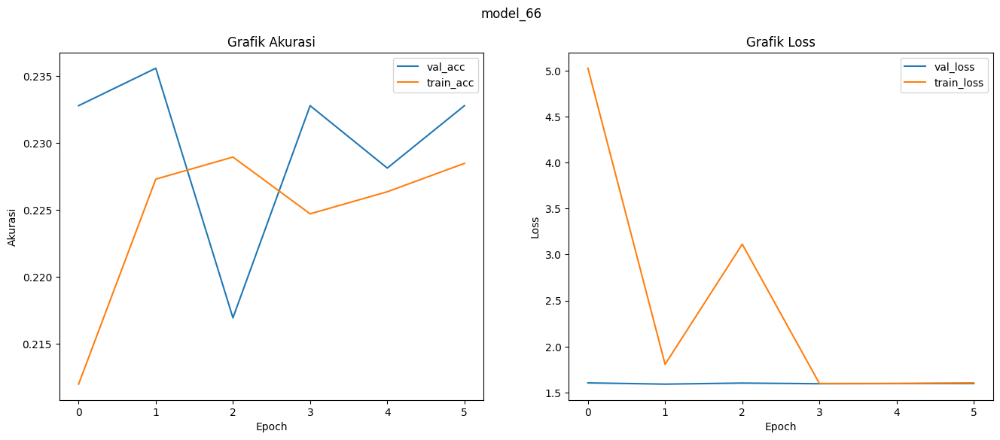

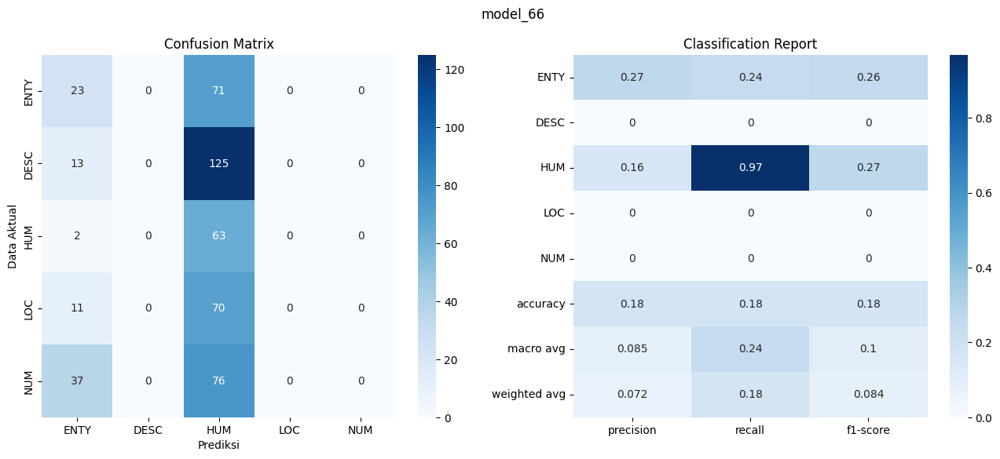

model logged

Scenario 67: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 67
early stopping implemented
traning is stopped by early stopping on epoch: 18
Test Loss: 0.3409, Test Acc: 0.8717

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.78      0.72      0.75        94
        DESC       0.90      0.93      0.91       138
         HUM       0.86      0.92      0.89        65
         LOC       0.84      0.90      0.87        81
         NUM       0.94      0.88      0.91       113

    accuracy                           0.87       491
   macro avg       0.86      0.87      0.87       491
weighted avg       0.87      0.87      0.87       491


Confusion Matrix:
[[ 68  11   6   5   4]
 [  8 128   0   0   2]
 [  2   1  60   2   0]
 [  5   0   3  73   0]
 [  4   2   1   7  99]]
Test accuracy: 0.8717


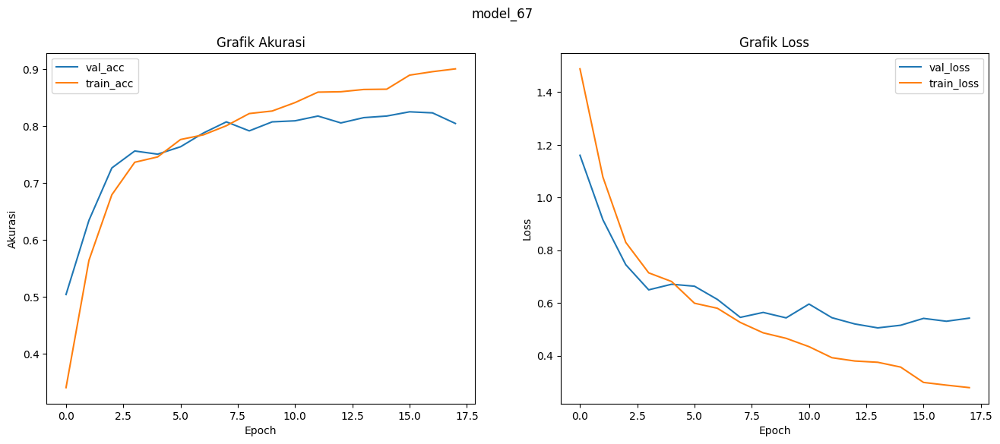

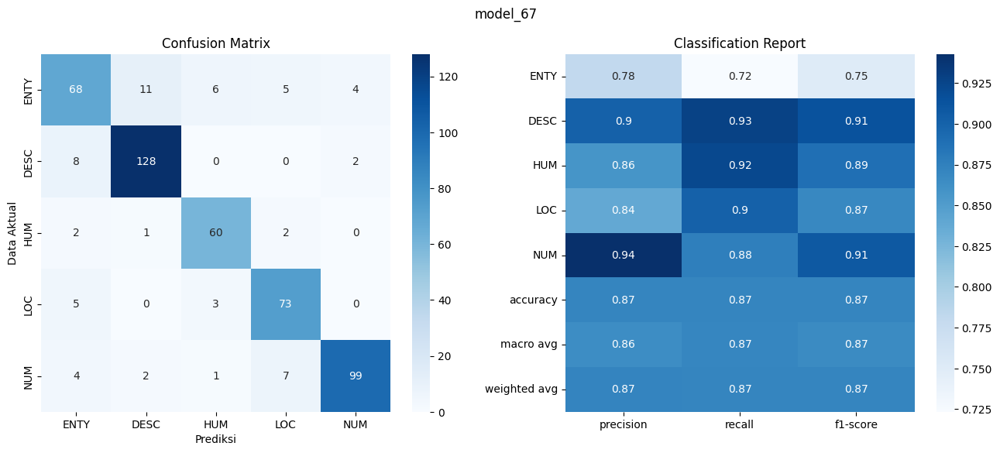

model logged

Scenario 68: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 68
early stopping implemented
traning is stopped by early stopping on epoch: 15
Test Loss: 0.3658, Test Acc: 0.8574

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.91      0.55      0.69        94
        DESC       0.77      0.99      0.87       138
         HUM       0.88      0.92      0.90        65
         LOC       0.91      0.83      0.86        81
         NUM       0.91      0.94      0.93       113

    accuracy                           0.86       491
   macro avg       0.88      0.85      0.85       491
weighted avg       0.87      0.86      0.85       491


Confusion Matrix:
[[ 52  25   7   5   5]
 [  0 136   0   0   2]
 [  2   2  60   1   0]
 [  3   7   1  67   3]
 [  0   6   0   1 106]]
Test accuracy: 0.8574


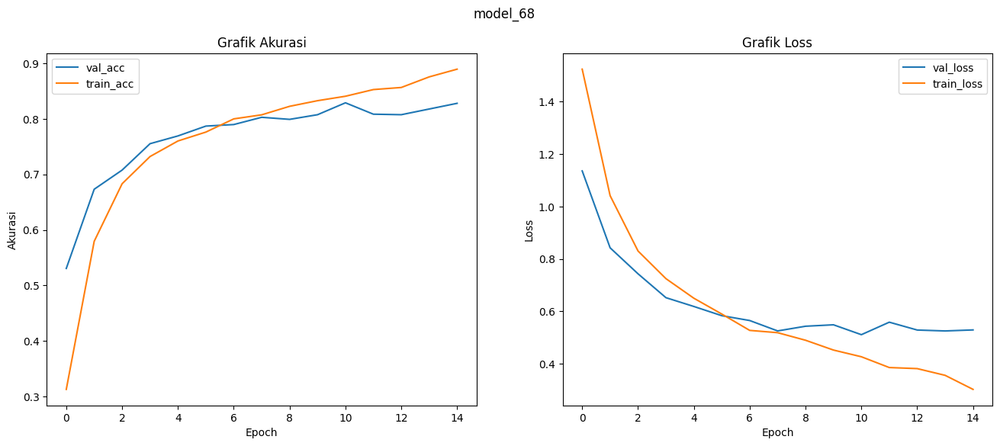

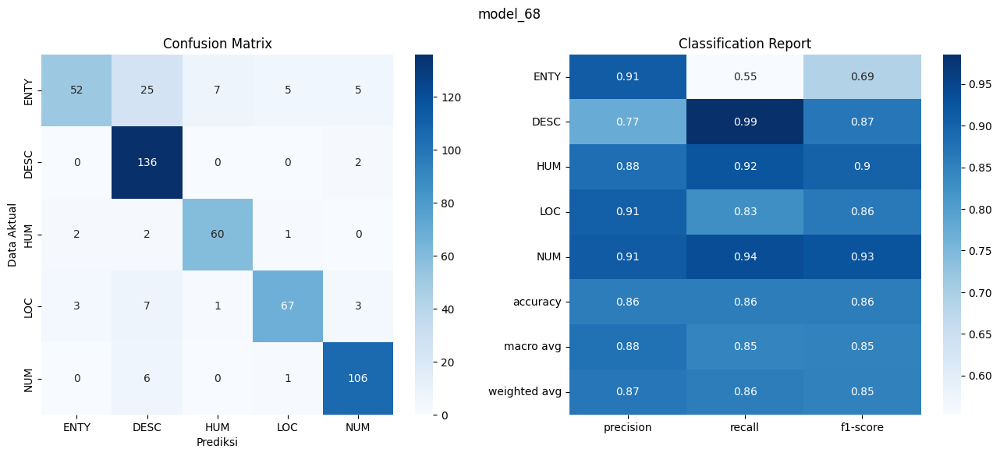

model logged

Scenario 69: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 69
early stopping implemented
traning is stopped by early stopping on epoch: 23
Test Loss: 0.3206, Test Acc: 0.8900

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.73      0.82      0.77        94
        DESC       0.94      0.96      0.95       138
         HUM       0.91      0.89      0.90        65
         LOC       0.89      0.88      0.88        81
         NUM       0.97      0.87      0.92       113

    accuracy                           0.89       491
   macro avg       0.89      0.88      0.88       491
weighted avg       0.90      0.89      0.89       491


Confusion Matrix:
[[ 77   5   4   5   3]
 [  5 133   0   0   0]
 [  6   0  58   1   0]
 [  9   0   1  71   0]
 [  8   3   1   3  98]]
Test accuracy: 0.8900


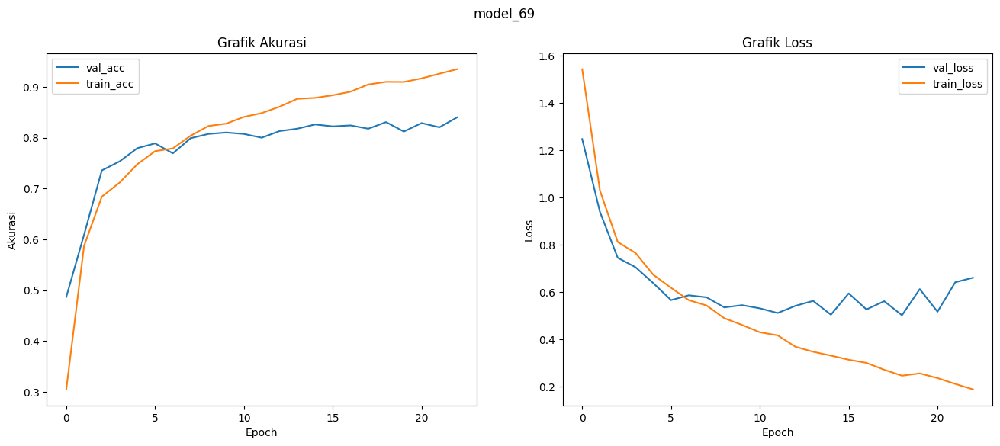

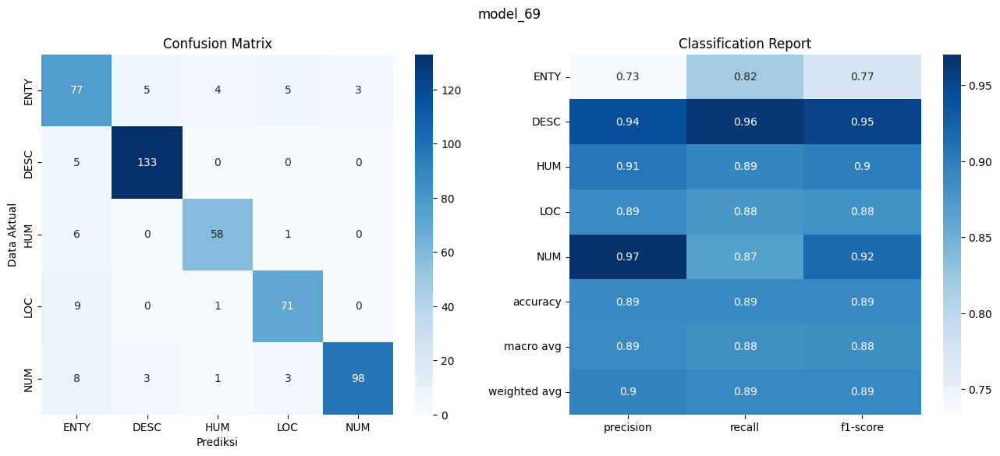

model logged

Scenario 70: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 70
early stopping implemented
traning is stopped by early stopping on epoch: 60
Test Loss: 0.3471, Test Acc: 0.8717

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.76      0.73      0.75        94
        DESC       0.91      0.93      0.92       138
         HUM       0.94      0.89      0.91        65
         LOC       0.82      0.94      0.87        81
         NUM       0.92      0.85      0.88       113

    accuracy                           0.87       491
   macro avg       0.87      0.87      0.87       491
weighted avg       0.87      0.87      0.87       491


Confusion Matrix:
[[ 69   6   4   9   6]
 [  8 129   0   0   1]
 [  4   1  58   2   0]
 [  4   0   0  76   1]
 [  6   5   0   6  96]]
Test accuracy: 0.8717


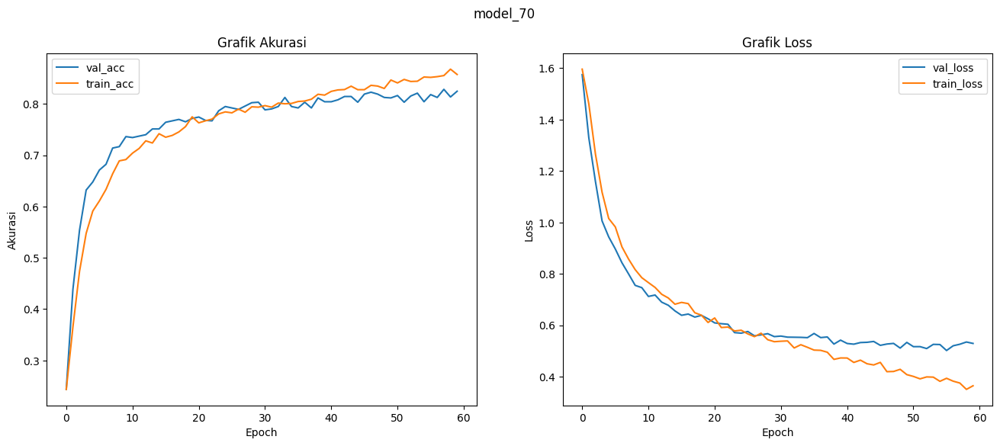

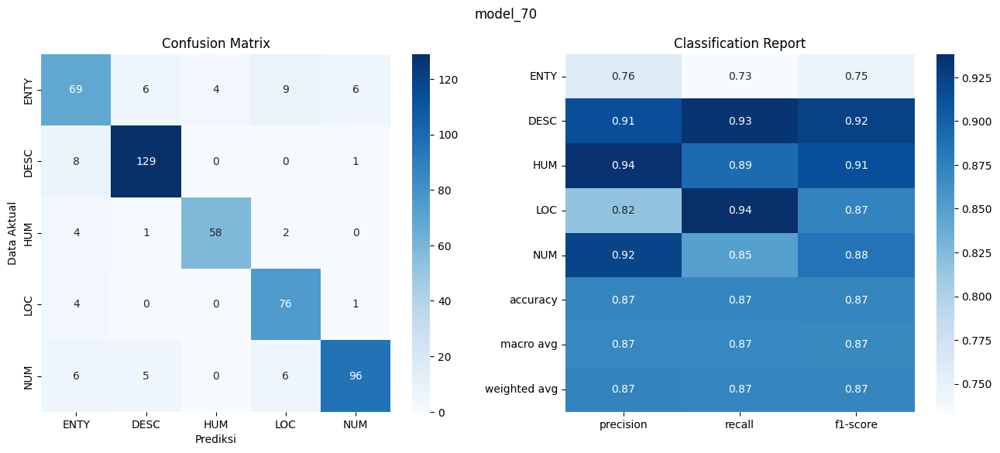

model logged

Scenario 71: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 71
early stopping implemented
traning is stopped by early stopping on epoch: 47
Test Loss: 0.3844, Test Acc: 0.8574

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.78      0.66      0.72        94
        DESC       0.80      0.97      0.88       138
         HUM       0.91      0.89      0.90        65
         LOC       0.89      0.84      0.87        81
         NUM       0.95      0.88      0.91       113

    accuracy                           0.86       491
   macro avg       0.87      0.85      0.85       491
weighted avg       0.86      0.86      0.86       491


Confusion Matrix:
[[ 62  18   5   5   4]
 [  4 134   0   0   0]
 [  4   2  58   1   0]
 [  4   7   1  68   1]
 [  5   7   0   2  99]]
Test accuracy: 0.8574


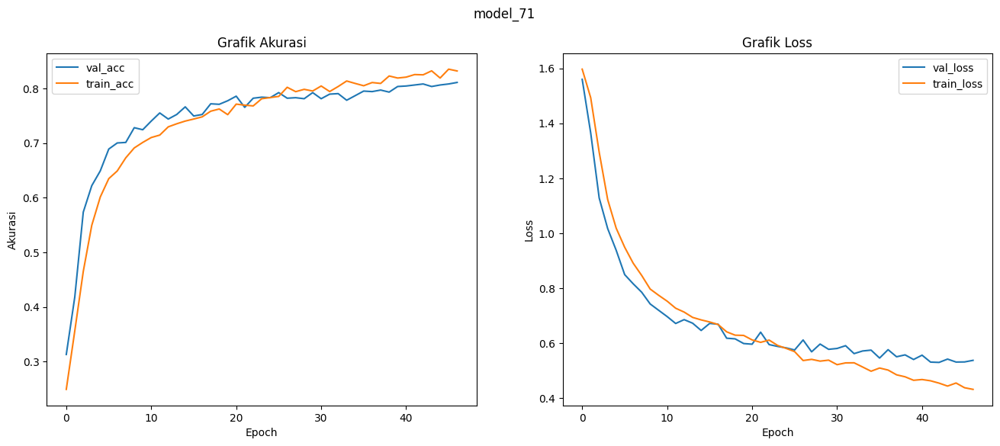

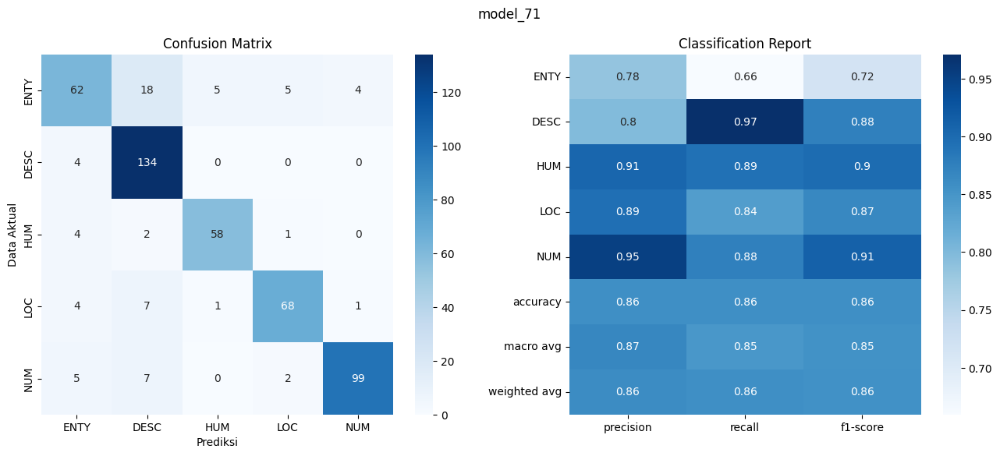

model logged

Scenario 72: {'vocabulary': 'use_stemming', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 72
early stopping implemented
traning is stopped by early stopping on epoch: 57
Test Loss: 0.3714, Test Acc: 0.8656

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.82      0.67      0.74        94
        DESC       0.86      0.96      0.90       138
         HUM       0.92      0.92      0.92        65
         LOC       0.79      0.90      0.84        81
         NUM       0.94      0.86      0.90       113

    accuracy                           0.87       491
   macro avg       0.87      0.86      0.86       491
weighted avg       0.87      0.87      0.86       491


Confusion Matrix:
[[ 63  11   5  11   4]
 [  5 132   0   0   1]
 [  2   2  60   1   0]
 [  3   4   0  73   1]
 [  4   5   0   7  97]]
Test accuracy: 0.8656


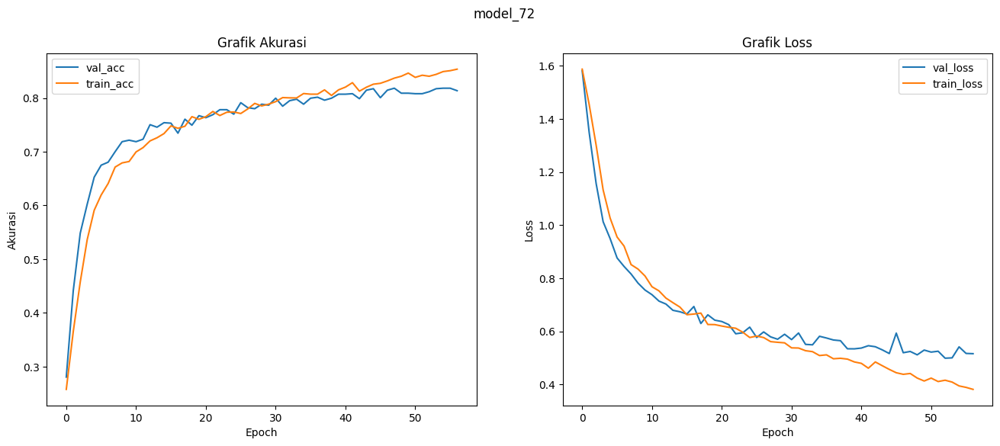

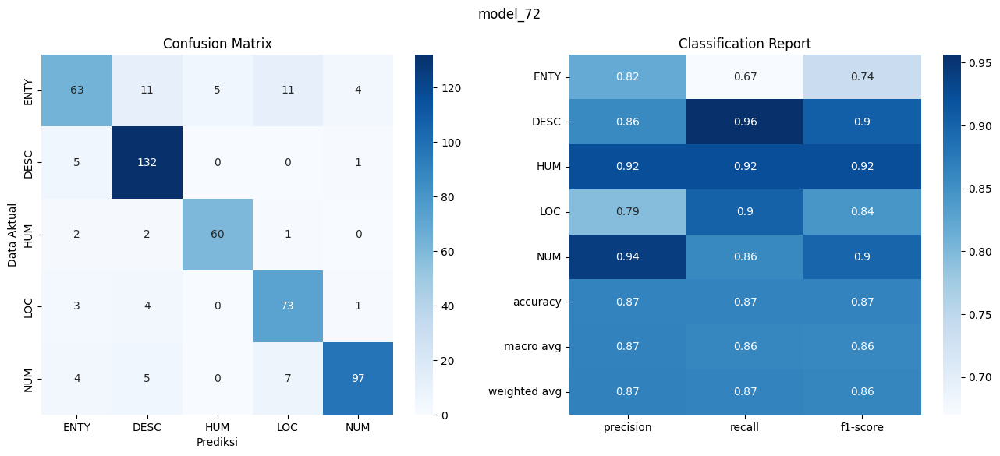

model logged

Scenario 73: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 73
early stopping implemented
traning is stopped by early stopping on epoch: 12
Test Loss: 1.6171, Test Acc: 0.1303

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      0.98      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  1   0  64   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1303


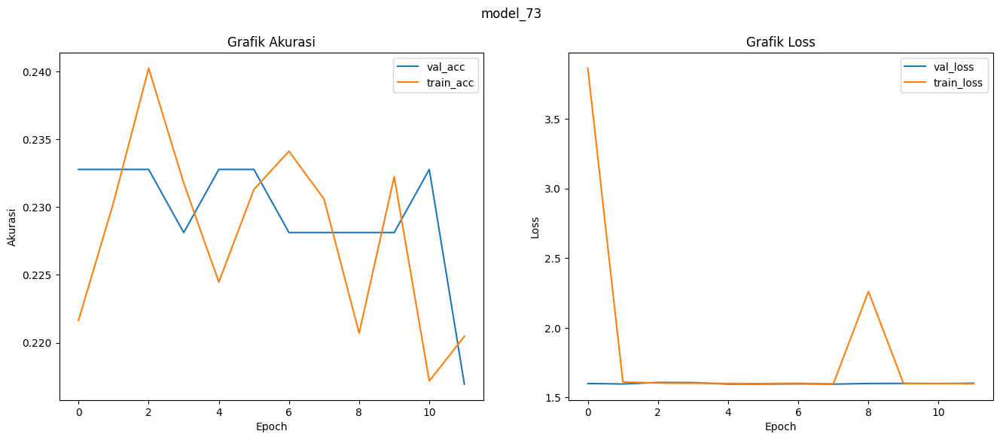

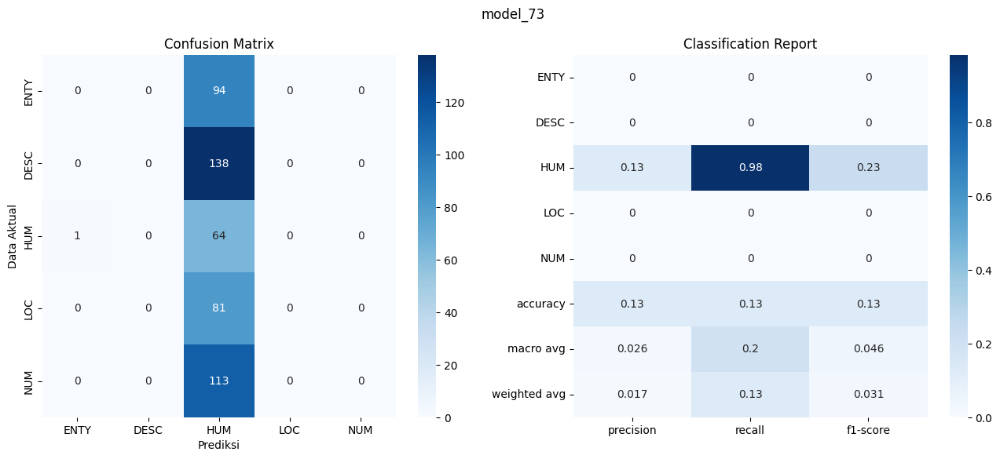

model logged

Scenario 74: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 74
early stopping implemented
traning is stopped by early stopping on epoch: 7
Test Loss: 1.6328, Test Acc: 0.1324

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      1.00      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  0   0  65   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1324


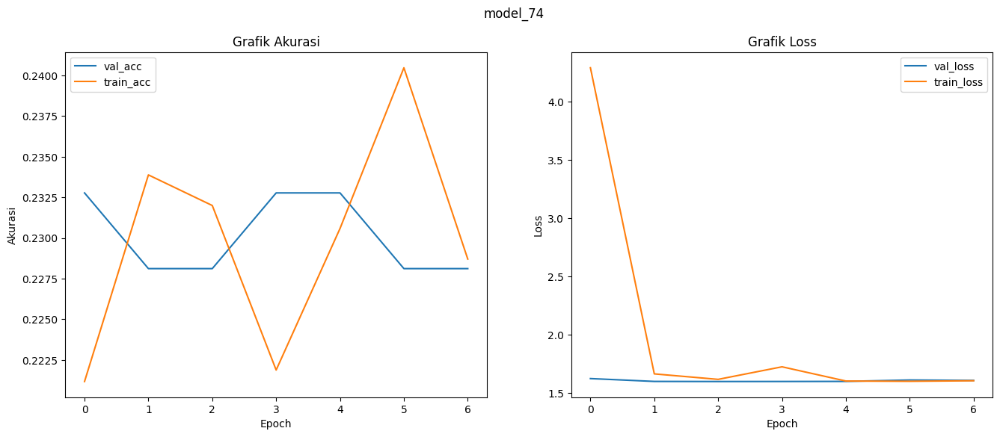

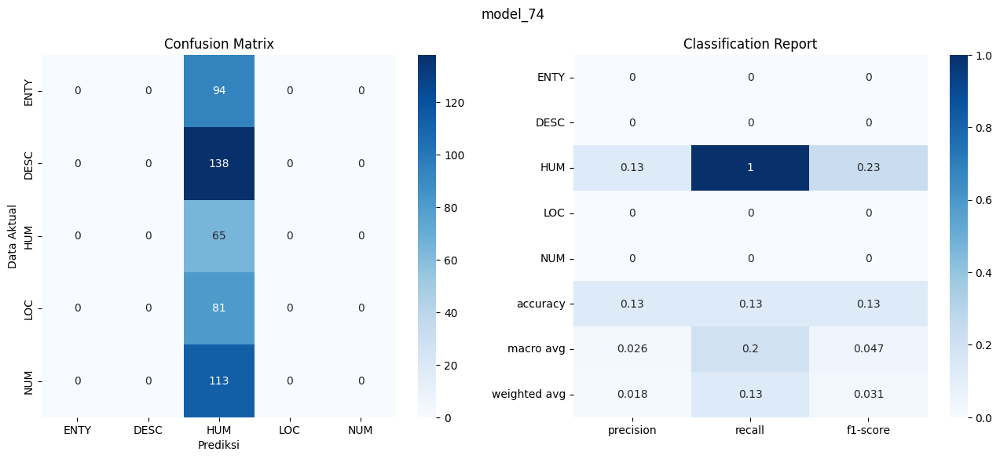

model logged

Scenario 75: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 75
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6217, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


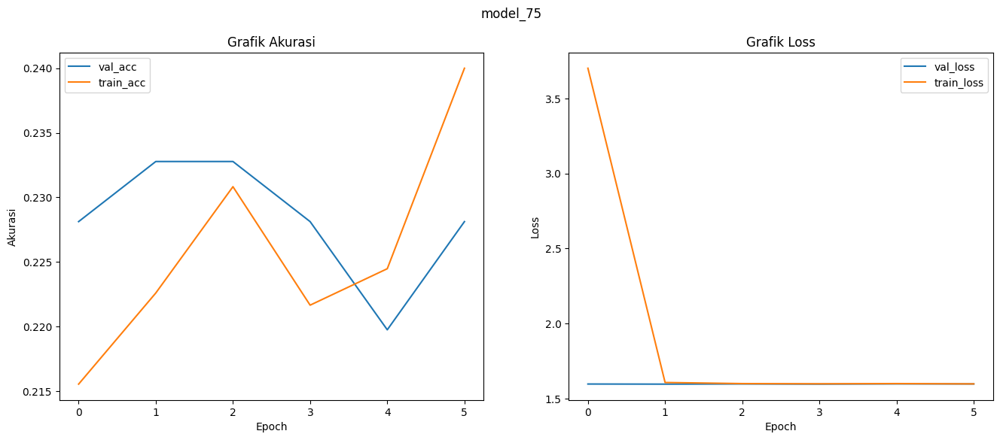

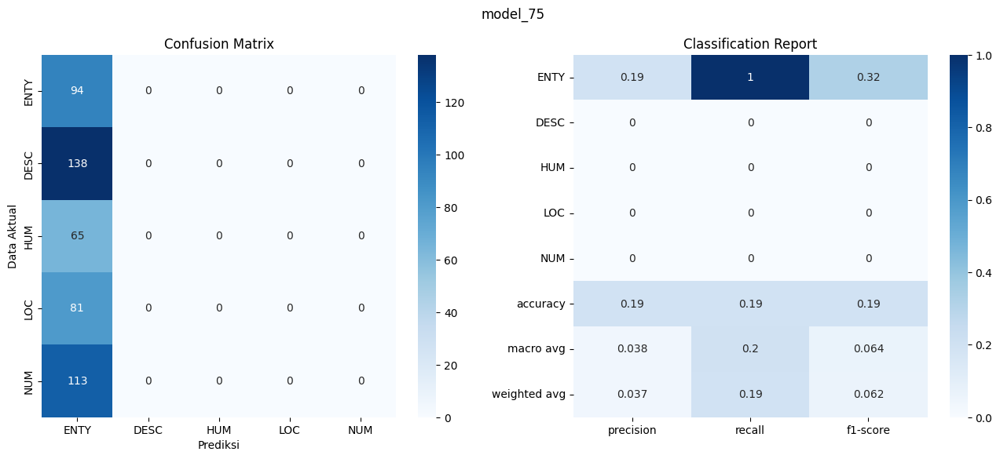

model logged

Scenario 76: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 76
early stopping implemented
traning is stopped by early stopping on epoch: 19
Test Loss: 0.3440, Test Acc: 0.8697

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.77      0.74      0.76        94
        DESC       0.85      0.96      0.90       138
         HUM       0.96      0.85      0.90        65
         LOC       0.85      0.85      0.85        81
         NUM       0.95      0.89      0.92       113

    accuracy                           0.87       491
   macro avg       0.88      0.86      0.87       491
weighted avg       0.87      0.87      0.87       491


Confusion Matrix:
[[ 70  11   1   8   4]
 [  6 132   0   0   0]
 [  8   1  55   1   0]
 [  4   6   1  69   1]
 [  3   6   0   3 101]]
Test accuracy: 0.8697


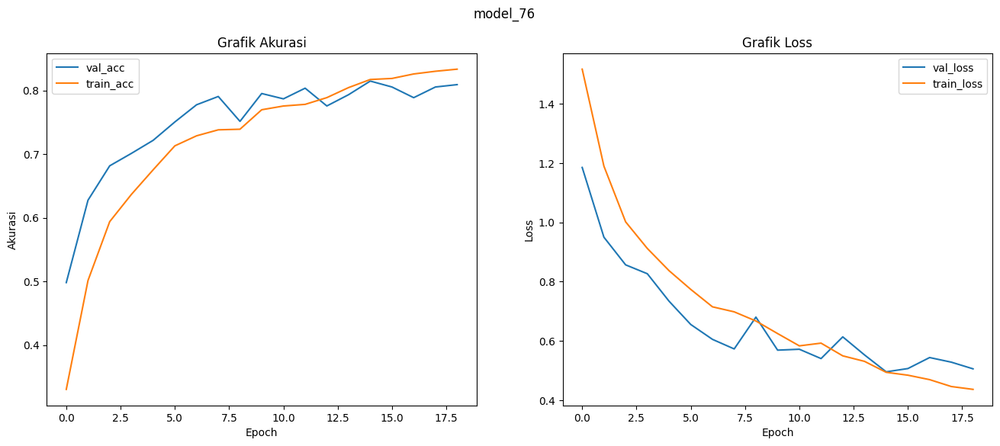

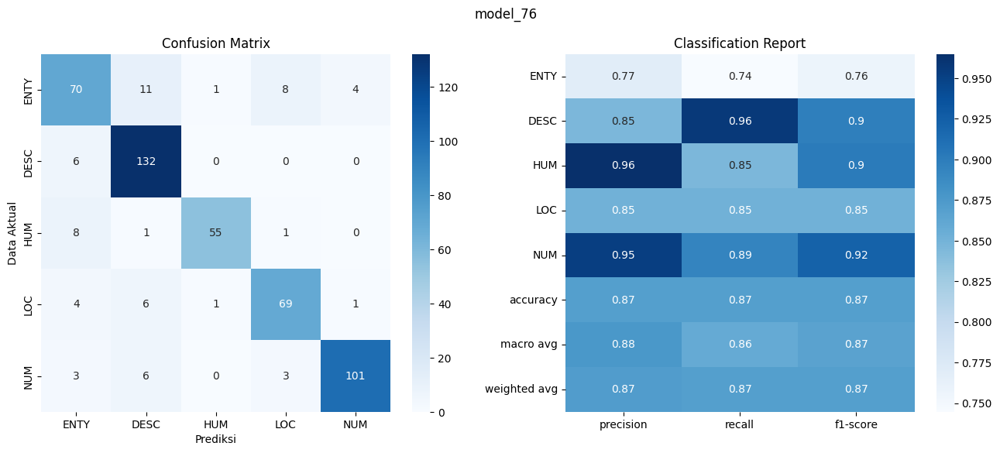

model logged

Scenario 77: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 77
early stopping implemented
traning is stopped by early stopping on epoch: 30
Test Loss: 0.3376, Test Acc: 0.8819

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.83      0.76      0.79        94
        DESC       0.85      0.97      0.91       138
         HUM       0.88      0.91      0.89        65
         LOC       0.90      0.86      0.88        81
         NUM       0.97      0.88      0.92       113

    accuracy                           0.88       491
   macro avg       0.88      0.87      0.88       491
weighted avg       0.88      0.88      0.88       491


Confusion Matrix:
[[ 71  10   7   4   2]
 [  4 134   0   0   0]
 [  4   2  59   0   0]
 [  4   5   1  70   1]
 [  3   7   0   4  99]]
Test accuracy: 0.8819


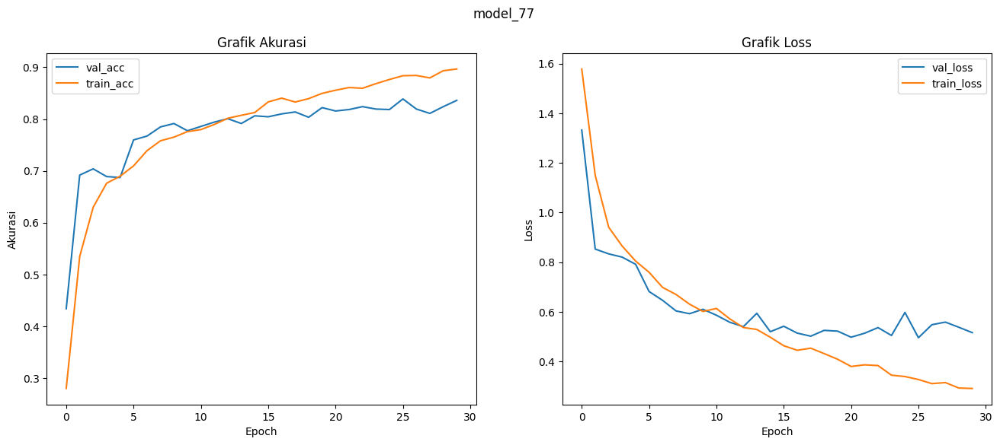

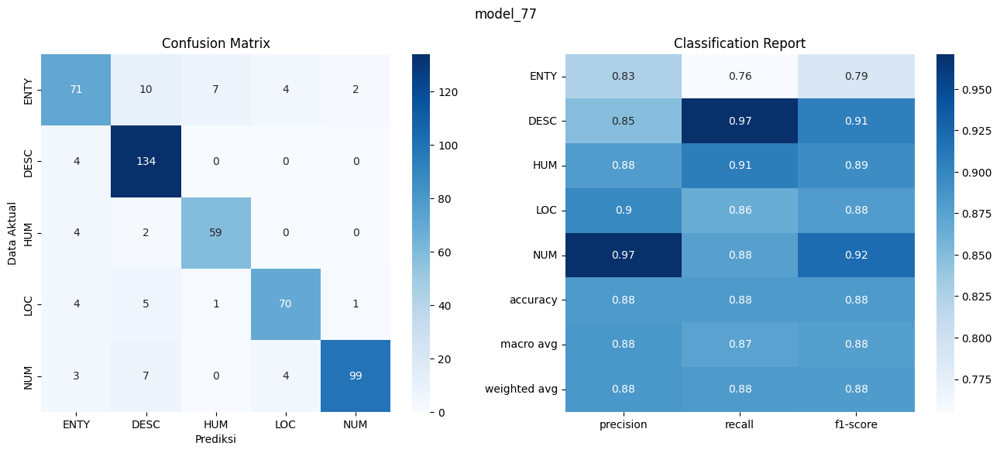

model logged

Scenario 78: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 78
early stopping implemented
traning is stopped by early stopping on epoch: 32
Test Loss: 0.3653, Test Acc: 0.8595

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.93      0.53      0.68        94
        DESC       0.78      0.99      0.87       138
         HUM       0.87      0.91      0.89        65
         LOC       0.85      0.95      0.90        81
         NUM       0.97      0.88      0.92       113

    accuracy                           0.86       491
   macro avg       0.88      0.85      0.85       491
weighted avg       0.87      0.86      0.85       491


Confusion Matrix:
[[ 50  26   8   8   2]
 [  1 137   0   0   0]
 [  2   3  59   1   0]
 [  1   1   1  77   1]
 [  0   9   0   5  99]]
Test accuracy: 0.8595


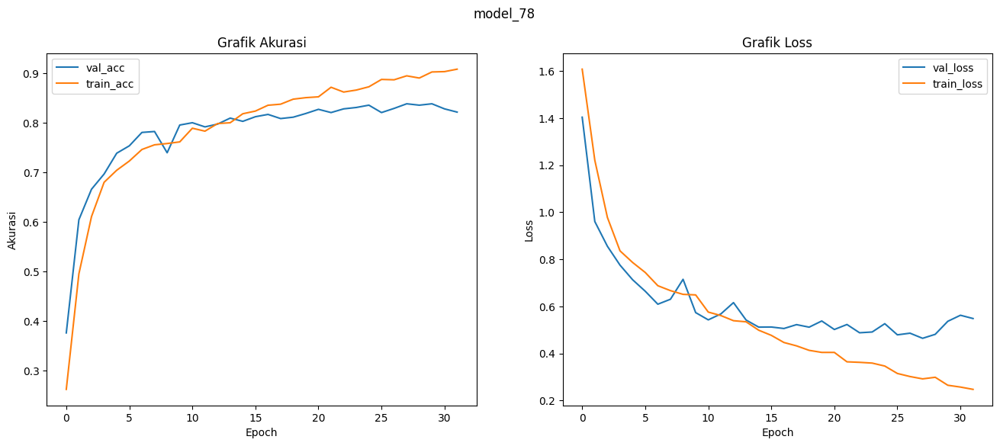

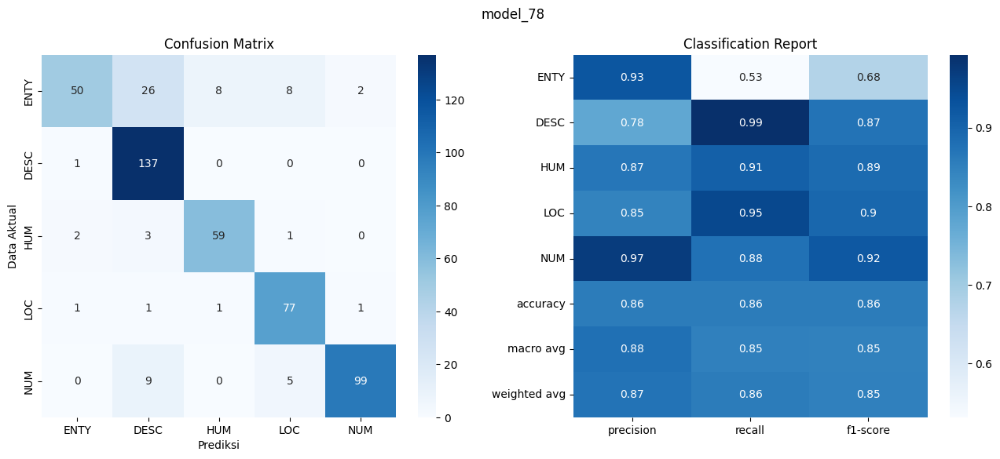

model logged

Scenario 79: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 79
early stopping implemented
traning is stopped by early stopping on epoch: 33
Test Loss: 0.4826, Test Acc: 0.8411

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.71      0.74      0.73        94
        DESC       0.82      0.96      0.89       138
         HUM       0.89      0.83      0.86        65
         LOC       0.86      0.84      0.85        81
         NUM       0.97      0.78      0.86       113

    accuracy                           0.84       491
   macro avg       0.85      0.83      0.84       491
weighted avg       0.85      0.84      0.84       491


Confusion Matrix:
[[ 70  12   5   5   2]
 [  4 133   0   0   1]
 [  7   2  54   2   0]
 [  5   7   1  68   0]
 [ 12   8   1   4  88]]
Test accuracy: 0.8411


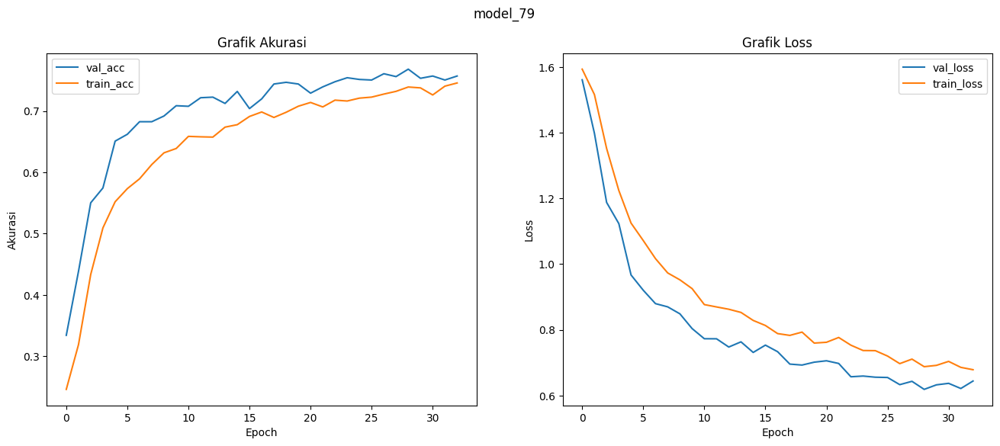

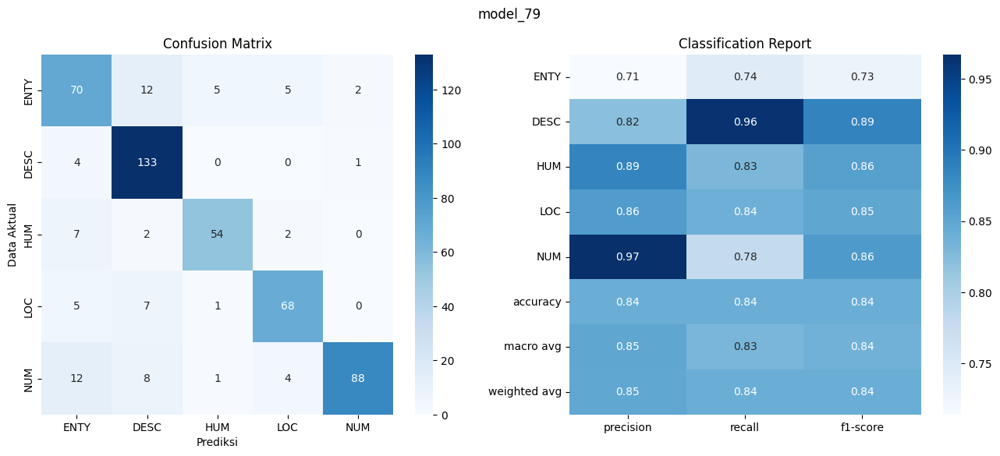

model logged

Scenario 80: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 80
early stopping implemented
traning is stopped by early stopping on epoch: 79
Test Loss: 0.3531, Test Acc: 0.8534

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.79      0.62      0.69        94
        DESC       0.82      0.96      0.89       138
         HUM       0.91      0.89      0.90        65
         LOC       0.82      0.84      0.83        81
         NUM       0.94      0.90      0.92       113

    accuracy                           0.85       491
   macro avg       0.86      0.84      0.85       491
weighted avg       0.85      0.85      0.85       491


Confusion Matrix:
[[ 58  18   5   8   5]
 [  4 133   0   0   1]
 [  5   1  58   1   0]
 [  5   6   1  68   1]
 [  1   4   0   6 102]]
Test accuracy: 0.8534


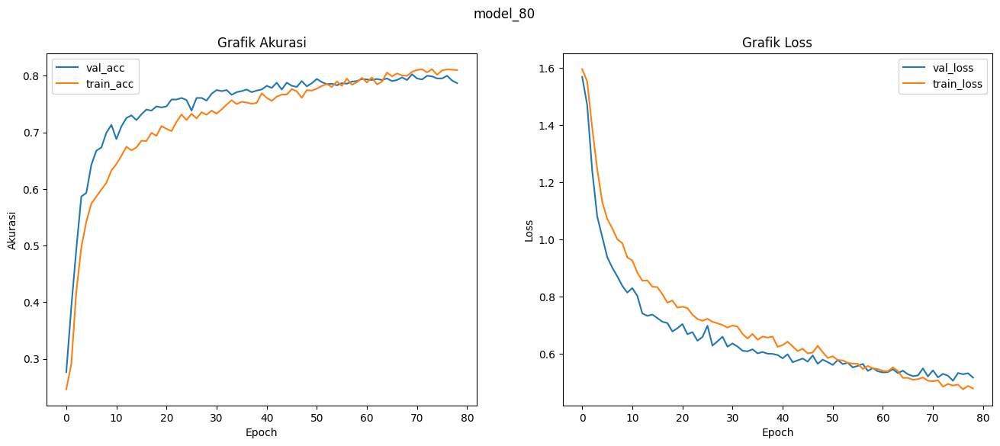

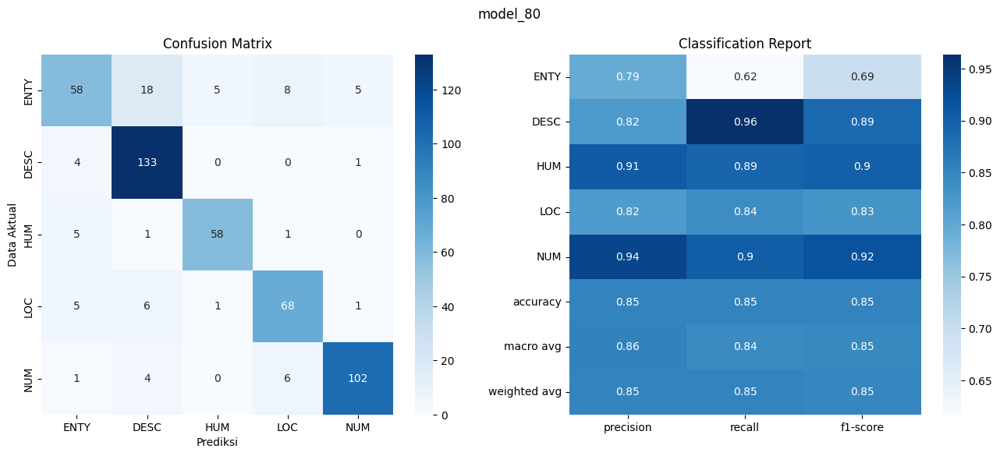

model logged

Scenario 81: {'vocabulary': 'use_stemming', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 81
early stopping implemented
traning is stopped by early stopping on epoch: 59
Test Loss: 0.3943, Test Acc: 0.8615

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.80      0.64      0.71        94
        DESC       0.85      0.96      0.90       138
         HUM       0.88      0.89      0.89        65
         LOC       0.87      0.84      0.86        81
         NUM       0.91      0.93      0.92       113

    accuracy                           0.86       491
   macro avg       0.86      0.85      0.85       491
weighted avg       0.86      0.86      0.86       491


Confusion Matrix:
[[ 60  13   7   6   8]
 [  5 132   0   0   1]
 [  4   2  58   1   0]
 [  5   5   1  68   2]
 [  1   4   0   3 105]]
Test accuracy: 0.8615


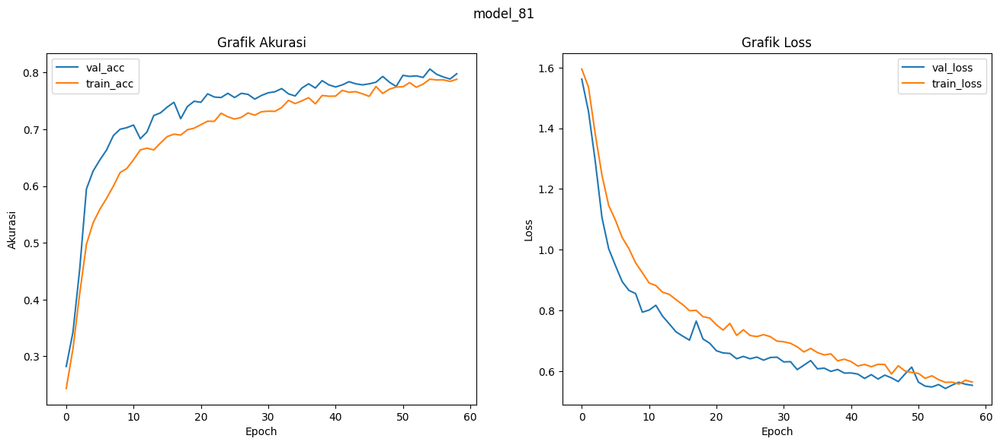

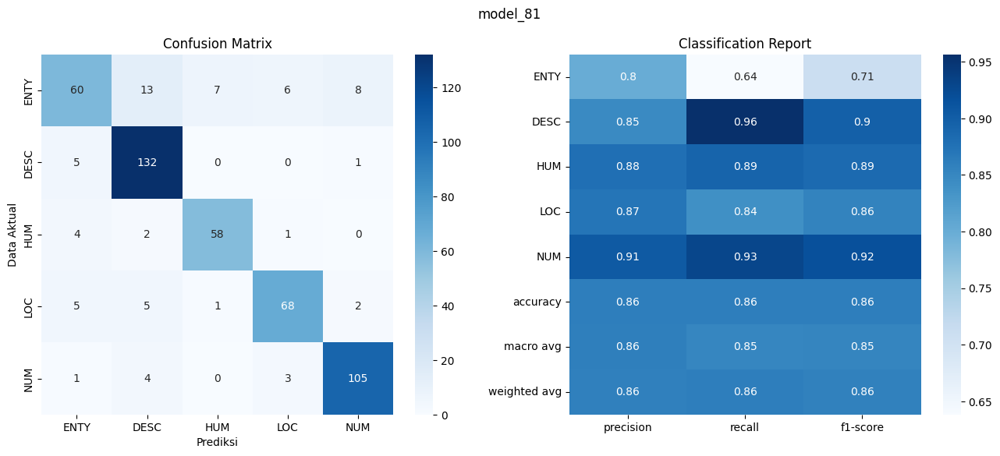

model logged

Scenario 82: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.01}
Jumlah vocabulary/kosa kata: 8175
created new data with intervention: use_lemma
Starting training for scenario 82
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6151, Test Acc: 0.2811

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.28      1.00      0.44       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.28       491
   macro avg       0.06      0.20      0.09       491
weighted avg       0.08      0.28      0.12       491


Confusion Matrix:
[[  0  94   0   0   0]
 [  0 138   0   0   0]
 [  0  65   0   0   0]
 [  0  81   0   0   0]
 [  0 113   0   0   0]]
Test acc

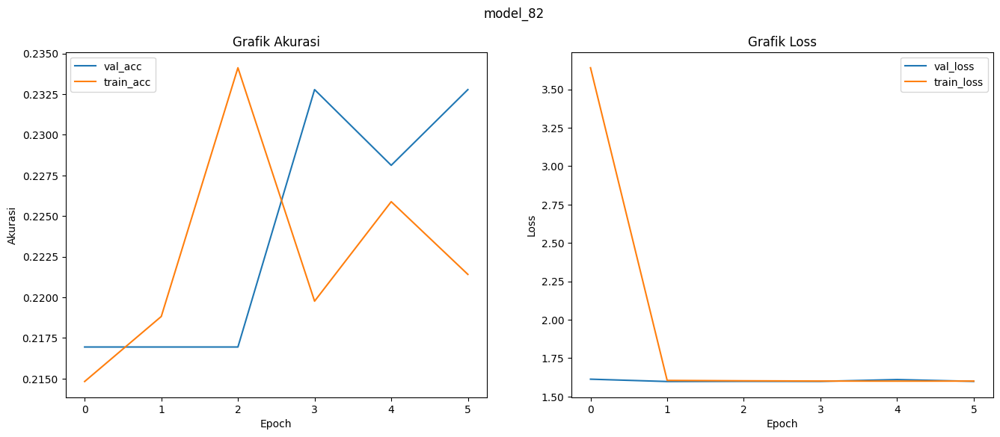

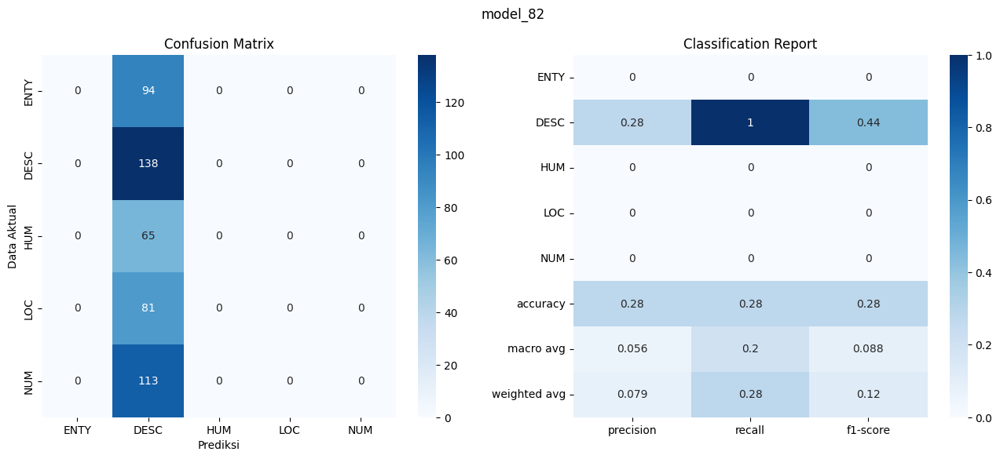

model logged

Scenario 83: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 83
early stopping implemented
traning is stopped by early stopping on epoch: 7
Test Loss: 1.6224, Test Acc: 0.1527

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.25      0.31      0.28        94
        DESC       0.00      0.00      0.00       138
         HUM       0.12      0.71      0.21        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.15       491
   macro avg       0.07      0.20      0.10       491
weighted avg       0.06      0.15      0.08       491


Confusion Matrix:
[[ 29   0  65   0   0]
 [ 19   0 119   0   0]
 [ 19   0  46   0   0]
 [ 21   0  60   0   0]
 [ 28   0  85   0   0]]
Test accuracy: 0.1527


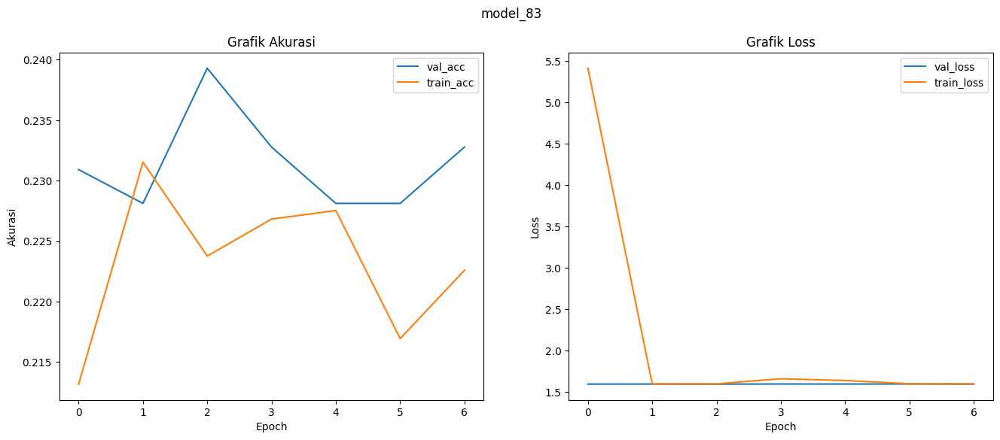

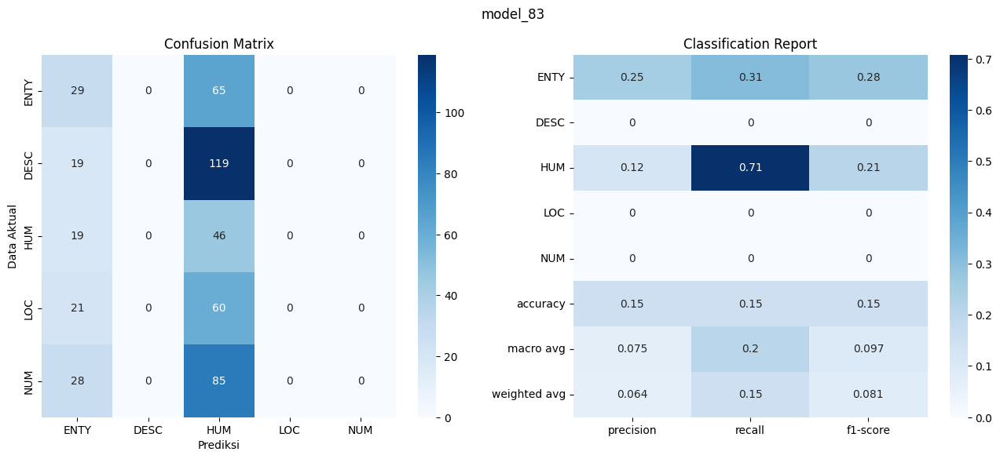

model logged

Scenario 84: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 84
early stopping implemented
traning is stopped by early stopping on epoch: 13
Test Loss: 1.4667, Test Acc: 0.2790

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.17      0.32      0.22        94
        DESC       0.81      0.31      0.45       138
         HUM       0.25      0.98      0.40        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.28       491
   macro avg       0.25      0.32      0.21       491
weighted avg       0.29      0.28      0.22       491


Confusion Matrix:
[[30  0 64  0  0]
 [90 43  5  0  0]
 [ 1  0 64  0  0]
 [ 1  0 80  0  0]
 [57 10 46  0  0]]
Test accuracy: 0.2790


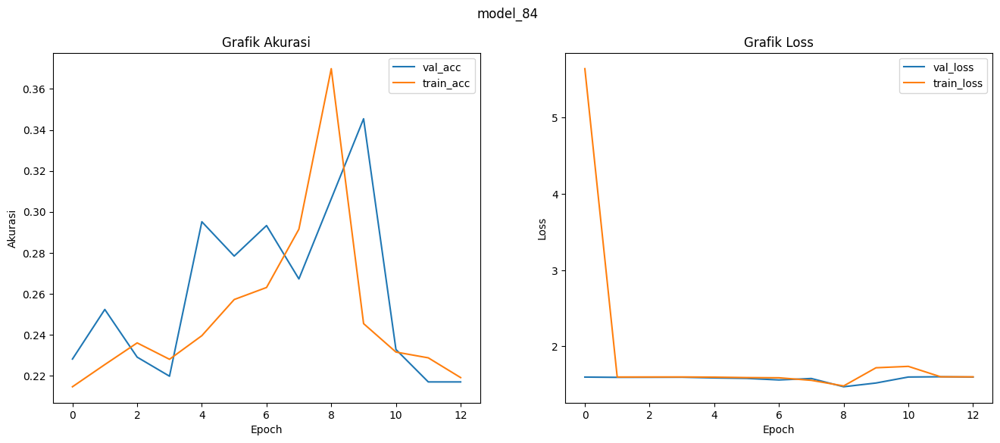

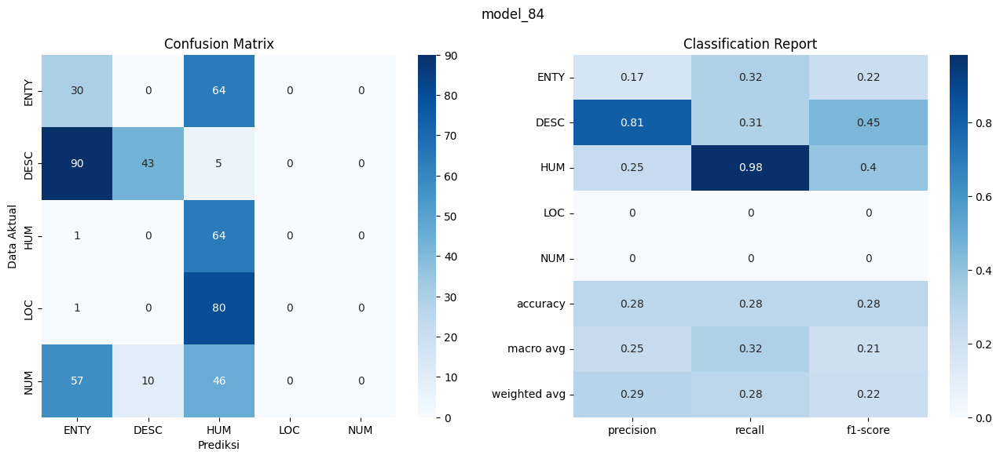

model logged

Scenario 85: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 85
early stopping implemented
traning is stopped by early stopping on epoch: 14
Test Loss: 0.3091, Test Acc: 0.9043

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.89      0.76      0.82        94
        DESC       0.91      0.92      0.92       138
         HUM       0.91      0.97      0.94        65
         LOC       0.84      0.98      0.90        81
         NUM       0.95      0.92      0.94       113

    accuracy                           0.90       491
   macro avg       0.90      0.91      0.90       491
weighted avg       0.91      0.90      0.90       491


Confusion Matrix:
[[ 71   5   5  10   3]
 [  8 127   1   1   1]
 [  1   0  63   1   0]
 [  0   1   0  79   1]
 [  0   6   0   3 104]]
Test accuracy: 0.9043


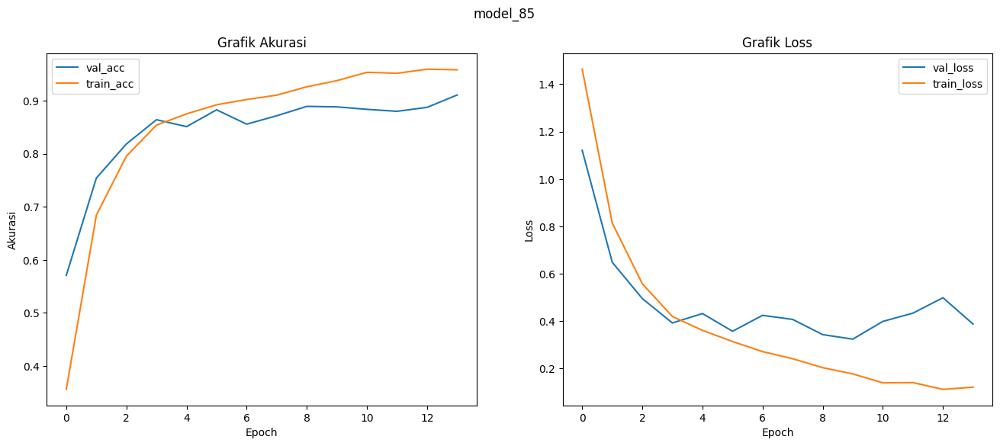

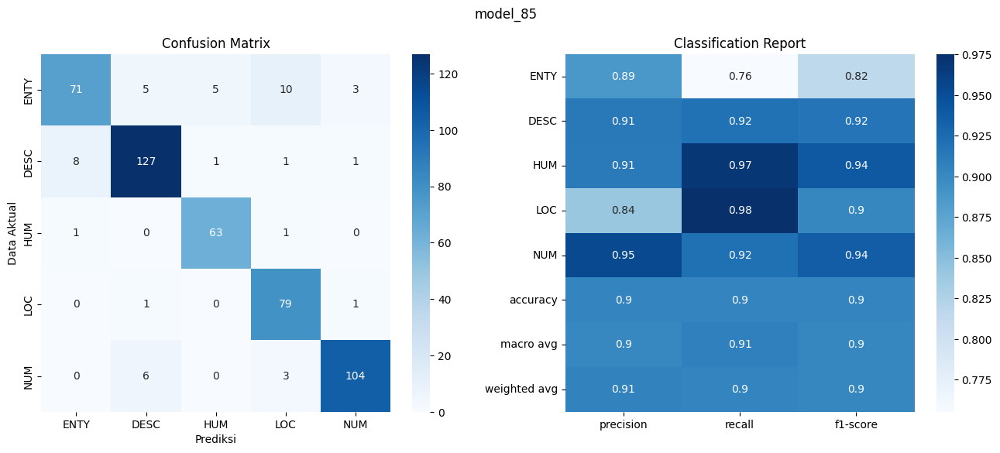

model logged

Scenario 86: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 86
early stopping implemented
traning is stopped by early stopping on epoch: 11
Test Loss: 0.2434, Test Acc: 0.9002

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.86      0.73      0.79        94
        DESC       0.85      0.93      0.89       138
         HUM       0.94      0.95      0.95        65
         LOC       0.94      0.91      0.93        81
         NUM       0.94      0.96      0.95       113

    accuracy                           0.90       491
   macro avg       0.91      0.90      0.90       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 69  14   4   3   4]
 [  6 129   0   0   3]
 [  2   0  62   1   0]
 [  3   4   0  74   0]
 [  0   4   0   1 108]]
Test accuracy: 0.9002


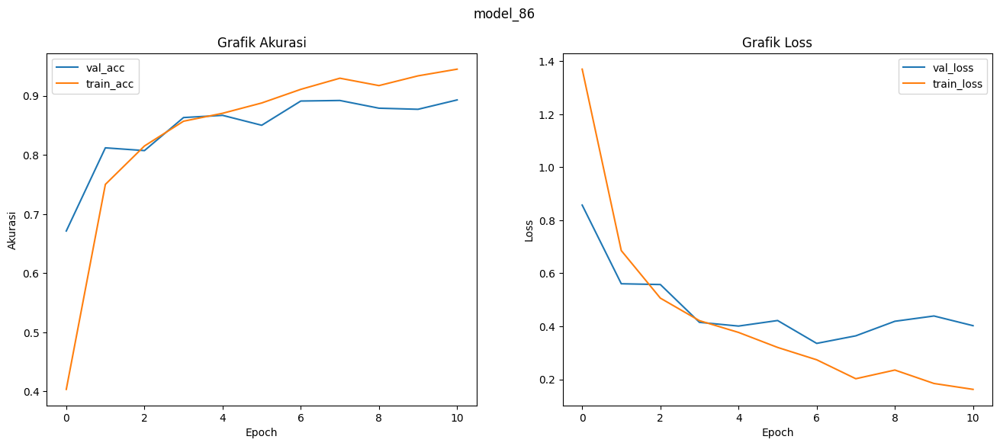

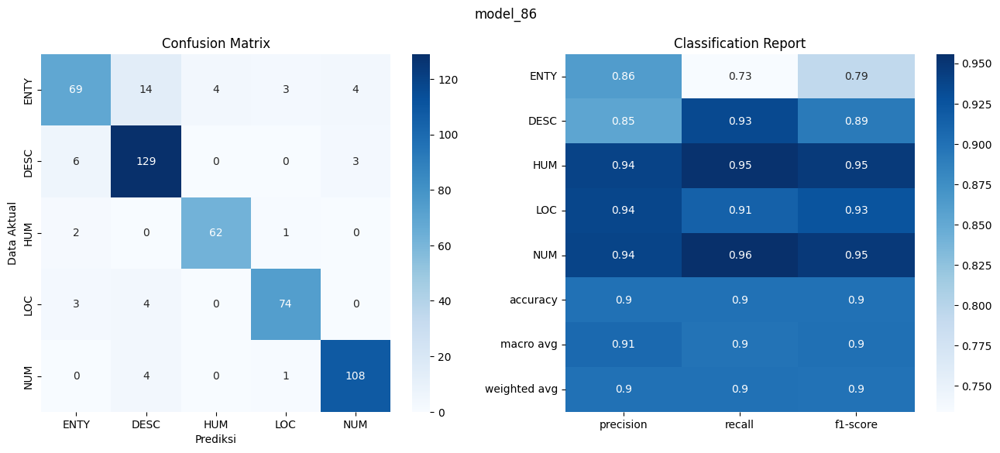

model logged

Scenario 87: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 87
early stopping implemented
traning is stopped by early stopping on epoch: 15
Test Loss: 0.2962, Test Acc: 0.9145

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.91      0.77      0.83        94
        DESC       0.90      0.96      0.93       138
         HUM       0.85      0.95      0.90        65
         LOC       0.95      0.94      0.94        81
         NUM       0.95      0.95      0.95       113

    accuracy                           0.91       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.92      0.91      0.91       491


Confusion Matrix:
[[ 72   6   9   4   3]
 [  3 132   2   0   1]
 [  2   1  62   0   0]
 [  2   1   0  76   2]
 [  0   6   0   0 107]]
Test accuracy: 0.9145


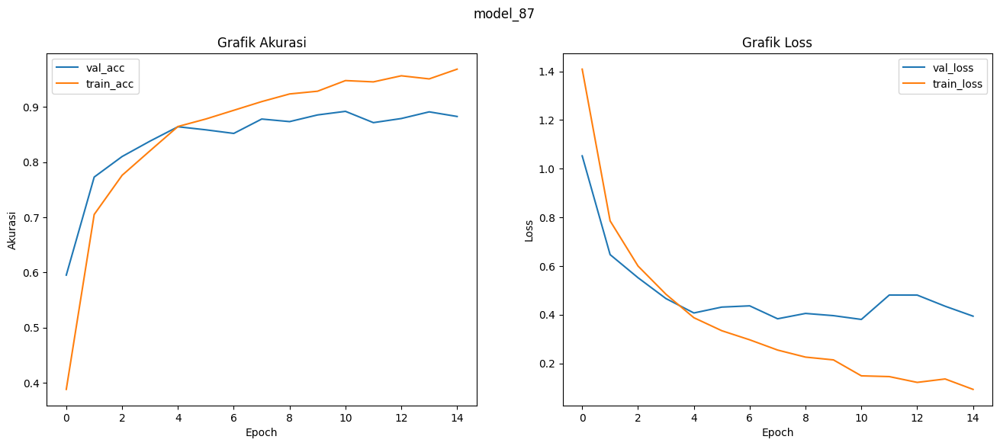

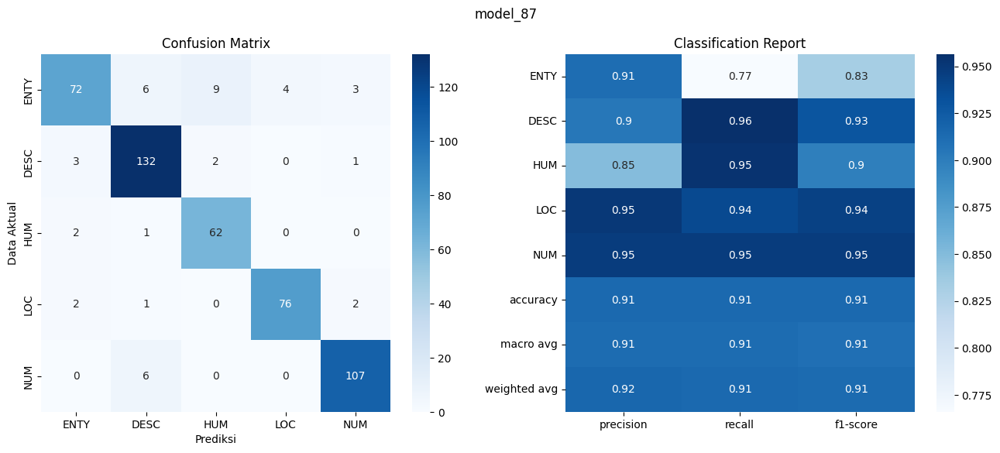

model logged

Scenario 88: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 88
early stopping implemented
traning is stopped by early stopping on epoch: 28
Test Loss: 0.3147, Test Acc: 0.9084

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.84      0.81      0.83        94
        DESC       0.92      0.91      0.91       138
         HUM       0.92      0.94      0.93        65
         LOC       0.90      0.94      0.92        81
         NUM       0.94      0.96      0.95       113

    accuracy                           0.91       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 76   5   4   7   2]
 [ 10 125   0   0   3]
 [  2   2  61   0   0]
 [  2   1   0  76   2]
 [  0   3   1   1 108]]
Test accuracy: 0.9084


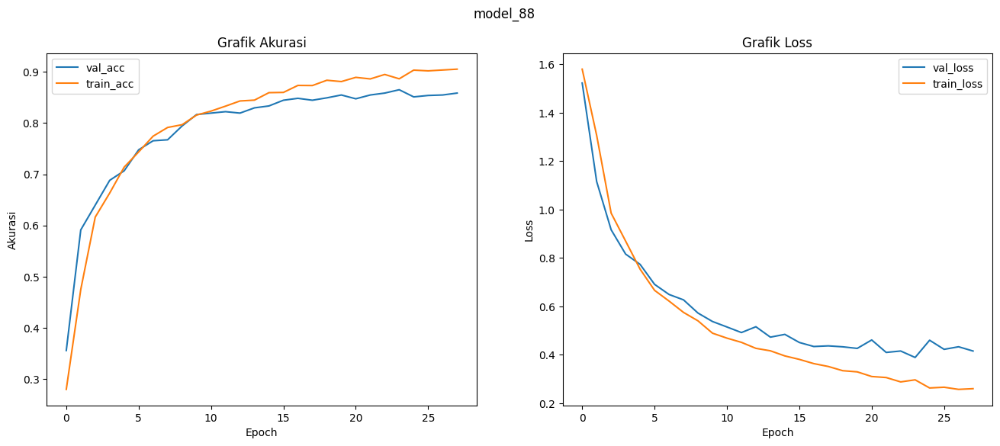

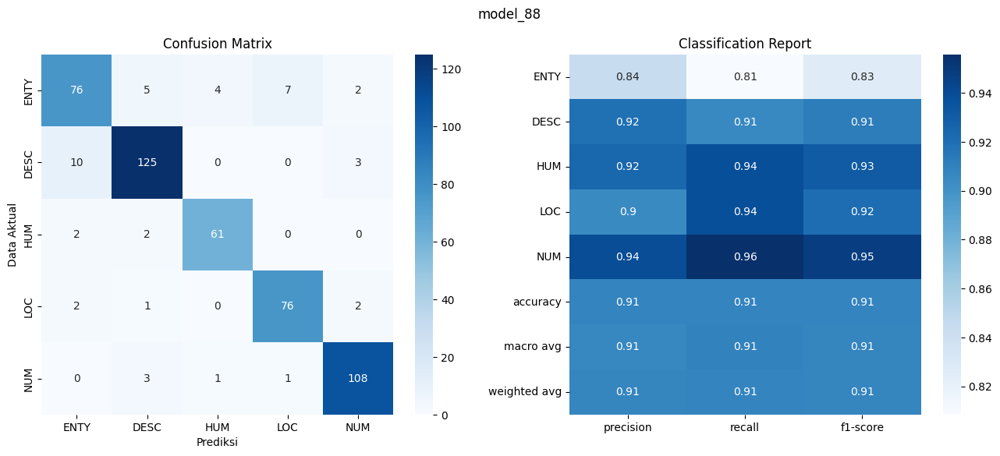

model logged

Scenario 89: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 89
early stopping implemented
traning is stopped by early stopping on epoch: 25
Test Loss: 0.3507, Test Acc: 0.8859

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.81      0.76      0.78        94
        DESC       0.90      0.90      0.90       138
         HUM       0.87      0.92      0.90        65
         LOC       0.86      0.96      0.91        81
         NUM       0.97      0.90      0.94       113

    accuracy                           0.89       491
   macro avg       0.88      0.89      0.88       491
weighted avg       0.89      0.89      0.89       491


Confusion Matrix:
[[ 71   5   7   9   2]
 [ 13 124   0   0   1]
 [  2   2  60   1   0]
 [  1   1   1  78   0]
 [  1   6   1   3 102]]
Test accuracy: 0.8859


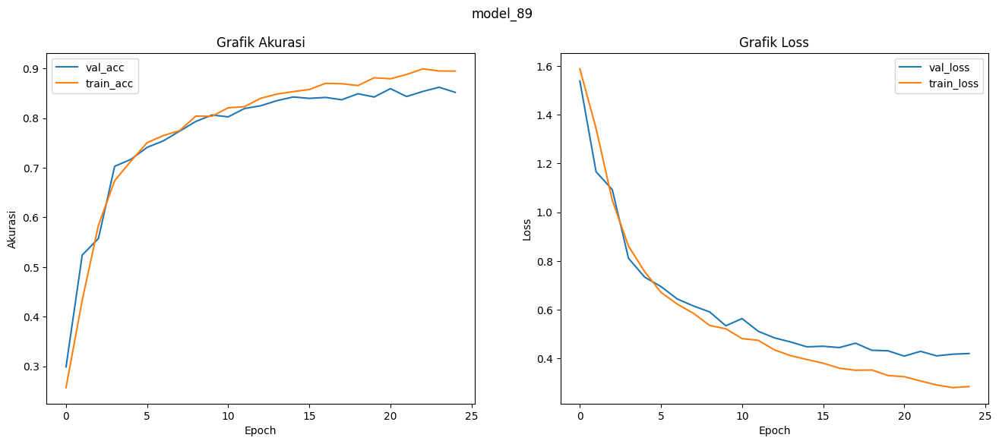

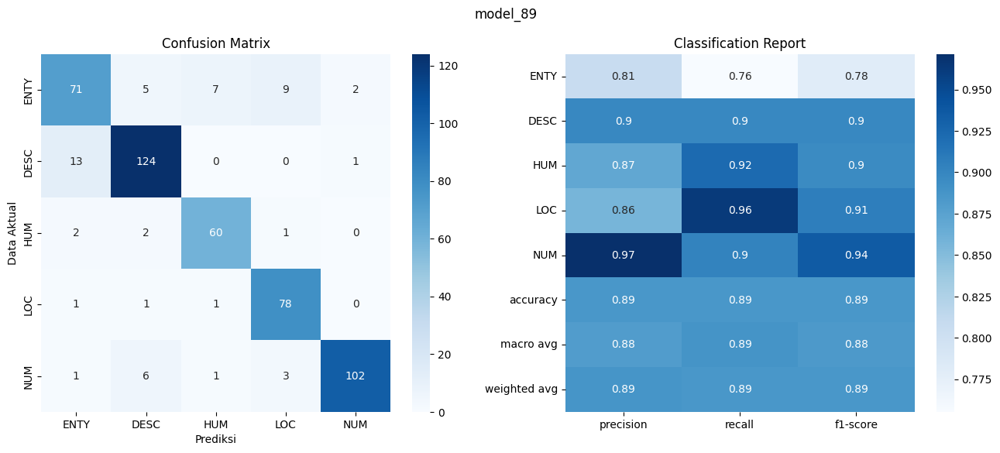

model logged

Scenario 90: {'vocabulary': 'use_lemma', 'drop_rate': 0.1, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 90
early stopping implemented
traning is stopped by early stopping on epoch: 29
Test Loss: 0.3036, Test Acc: 0.9104

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.89      0.78      0.83        94
        DESC       0.93      0.92      0.92       138
         HUM       0.90      0.94      0.92        65
         LOC       0.93      0.95      0.94        81
         NUM       0.90      0.96      0.93       113

    accuracy                           0.91       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 73   6   5   6   4]
 [  5 127   0   0   6]
 [  2   1  61   0   1]
 [  2   0   1  77   1]
 [  0   3   1   0 109]]
Test accuracy: 0.9104


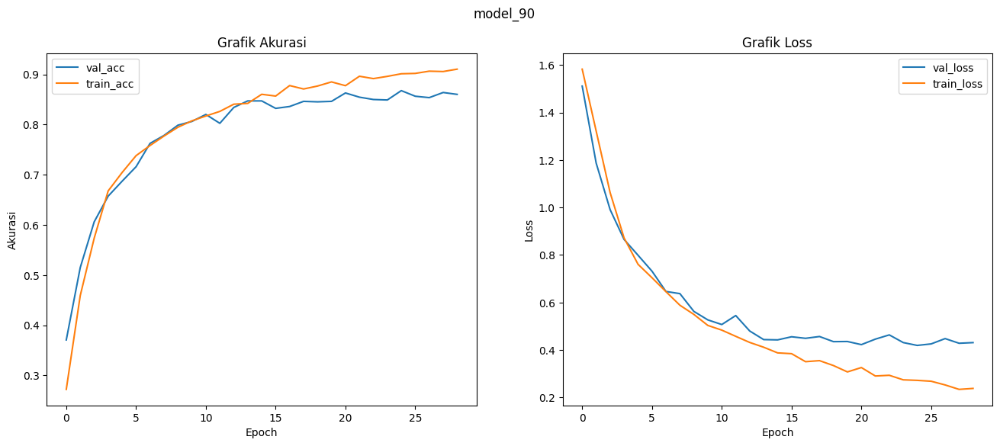

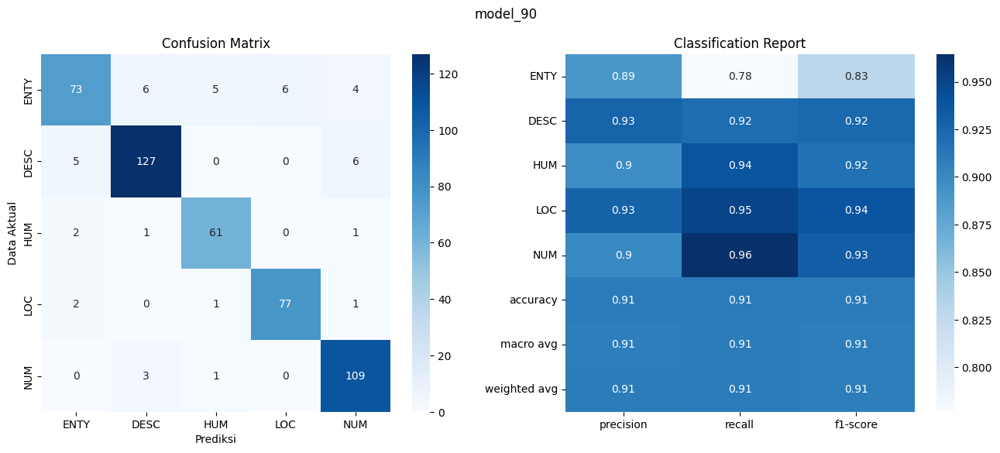

model logged

Scenario 91: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 91
early stopping implemented
traning is stopped by early stopping on epoch: 12
Test Loss: 1.6382, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


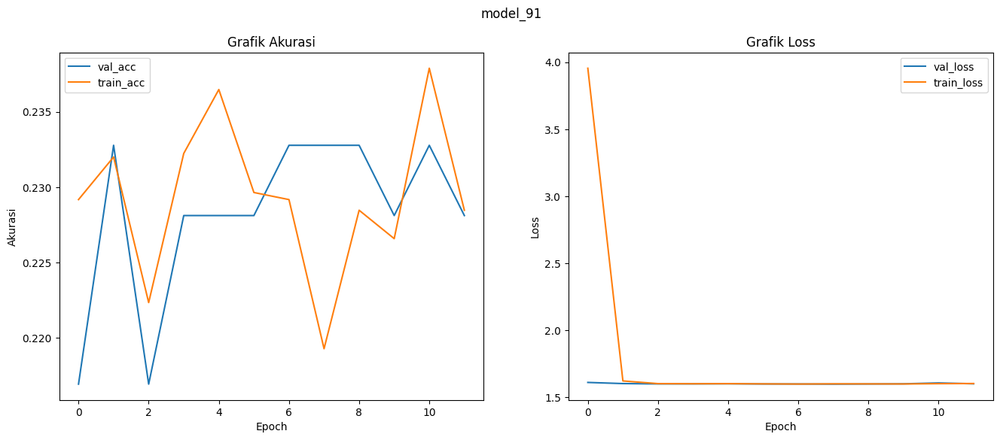

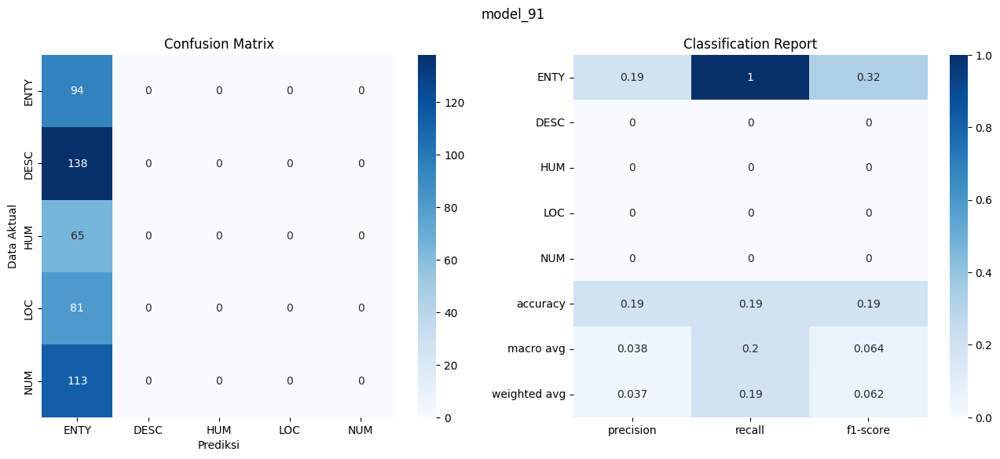

model logged

Scenario 92: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 92
early stopping implemented
traning is stopped by early stopping on epoch: 12
Test Loss: 1.6262, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


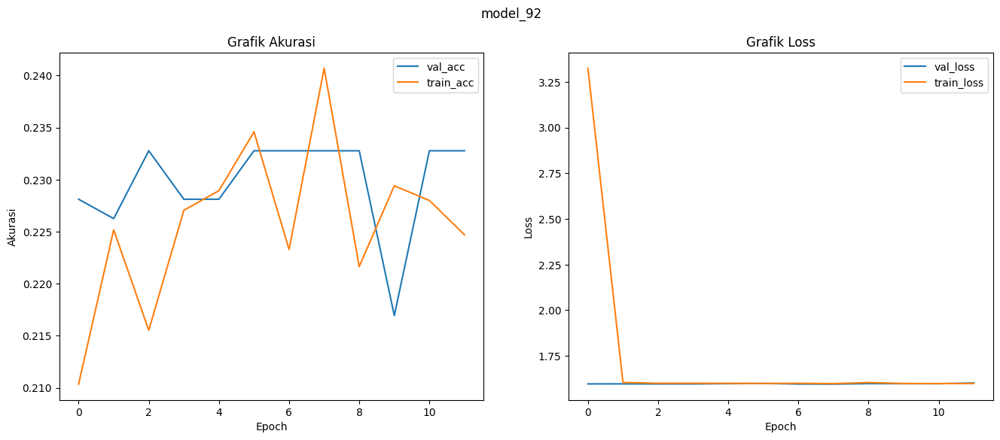

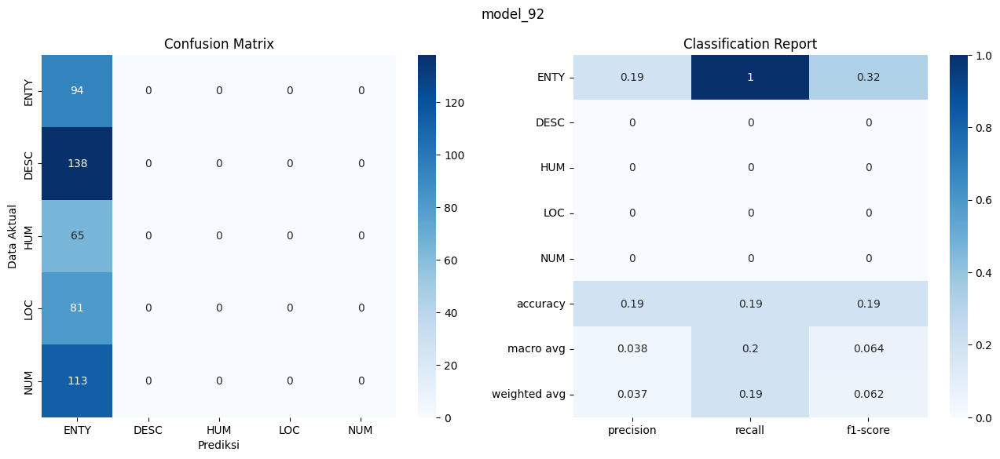

model logged

Scenario 93: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 93
early stopping implemented
traning is stopped by early stopping on epoch: 7
Test Loss: 1.6226, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


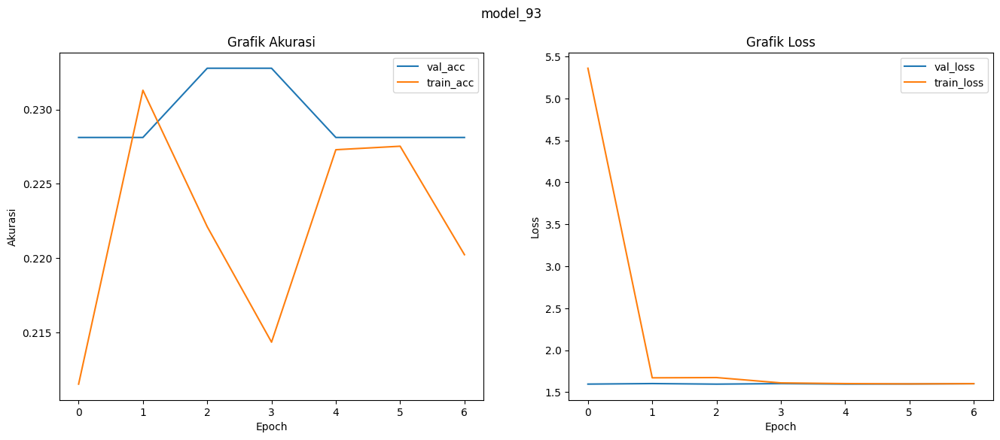

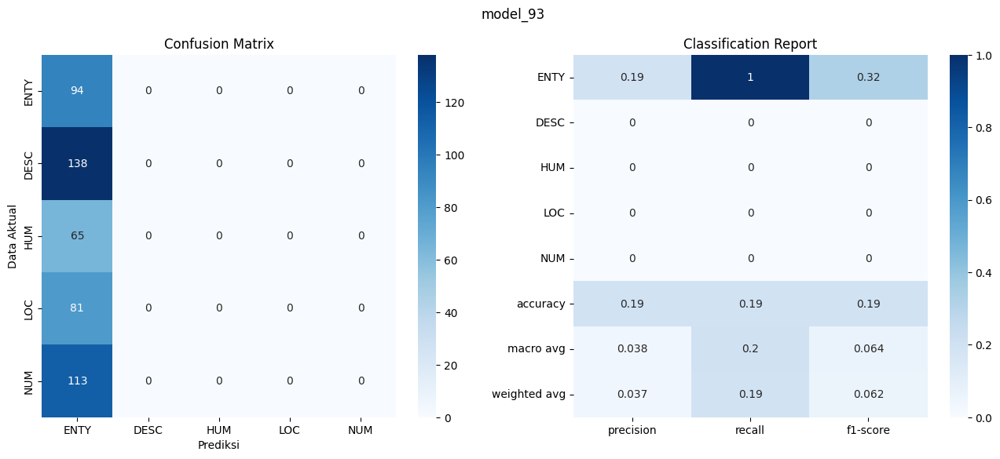

model logged

Scenario 94: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 94
early stopping implemented
traning is stopped by early stopping on epoch: 16
Test Loss: 0.2338, Test Acc: 0.9084

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.88      0.71      0.79        94
        DESC       0.87      0.99      0.92       138
         HUM       0.88      0.91      0.89        65
         LOC       0.97      0.95      0.96        81
         NUM       0.96      0.95      0.95       113

    accuracy                           0.91       491
   macro avg       0.91      0.90      0.90       491
weighted avg       0.91      0.91      0.91       491


Confusion Matrix:
[[ 67  13   8   2   4]
 [  2 136   0   0   0]
 [  6   0  59   0   0]
 [  1   2   0  77   1]
 [  0   6   0   0 107]]
Test accuracy: 0.9084


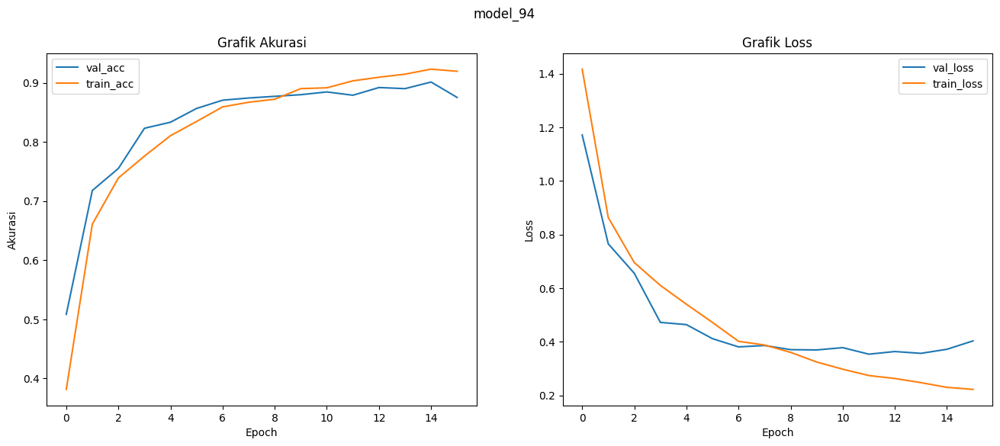

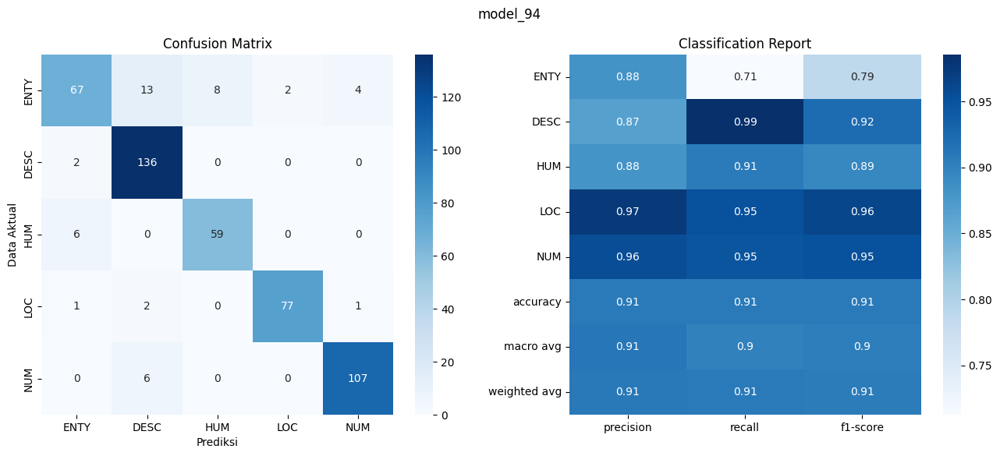

model logged

Scenario 95: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 95
early stopping implemented
traning is stopped by early stopping on epoch: 22
Test Loss: 0.2384, Test Acc: 0.9287

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.90      0.82      0.86        94
        DESC       0.91      0.99      0.95       138
         HUM       0.91      0.94      0.92        65
         LOC       0.94      0.95      0.94        81
         NUM       0.98      0.93      0.95       113

    accuracy                           0.93       491
   macro avg       0.93      0.92      0.93       491
weighted avg       0.93      0.93      0.93       491


Confusion Matrix:
[[ 77   6   5   4   2]
 [  2 136   0   0   0]
 [  4   0  61   0   0]
 [  0   3   1  77   0]
 [  3   4   0   1 105]]
Test accuracy: 0.9287


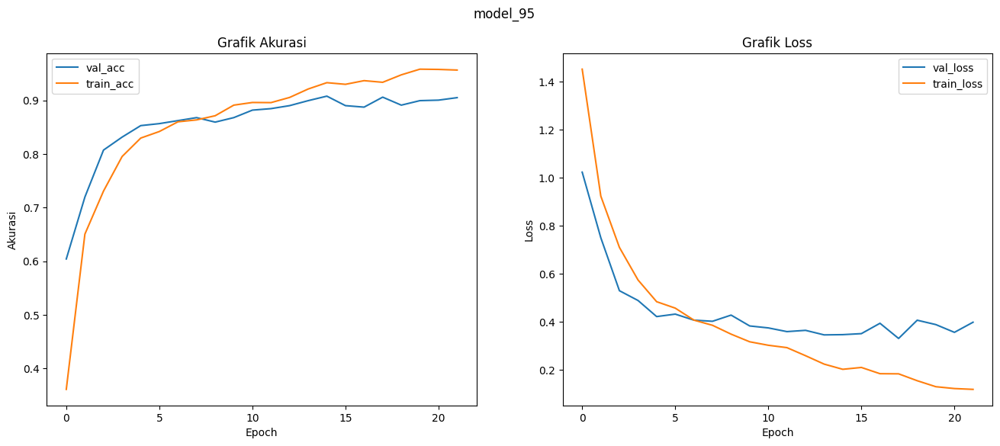

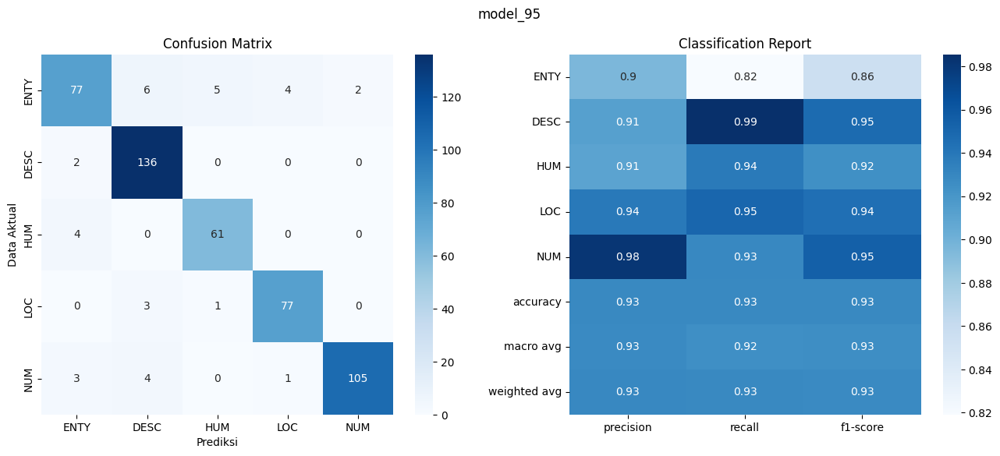

model logged

Scenario 96: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 96
early stopping implemented
traning is stopped by early stopping on epoch: 21
Test Loss: 0.2993, Test Acc: 0.9022

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.94      0.65      0.77        94
        DESC       0.86      0.99      0.92       138
         HUM       0.88      0.94      0.91        65
         LOC       0.87      0.96      0.91        81
         NUM       0.98      0.95      0.96       113

    accuracy                           0.90       491
   macro avg       0.91      0.90      0.89       491
weighted avg       0.91      0.90      0.90       491


Confusion Matrix:
[[ 61  14   7  10   2]
 [  1 136   0   1   0]
 [  2   1  61   1   0]
 [  1   1   1  78   0]
 [  0   6   0   0 107]]
Test accuracy: 0.9022


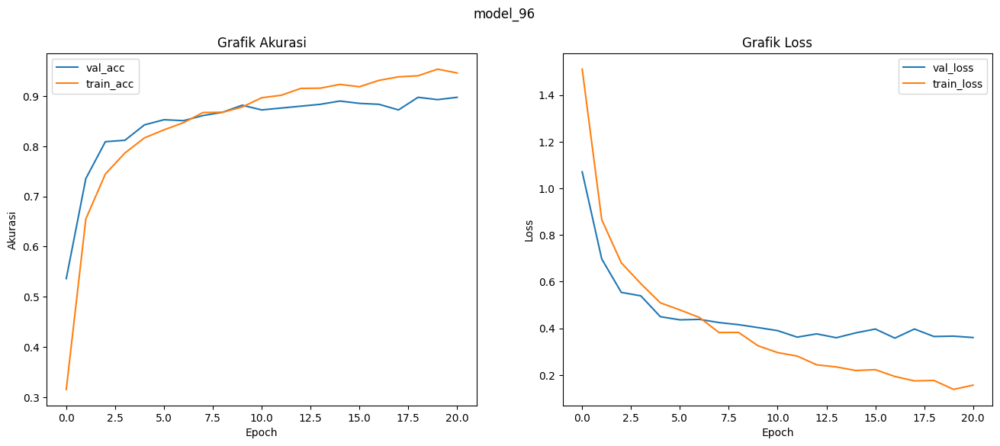

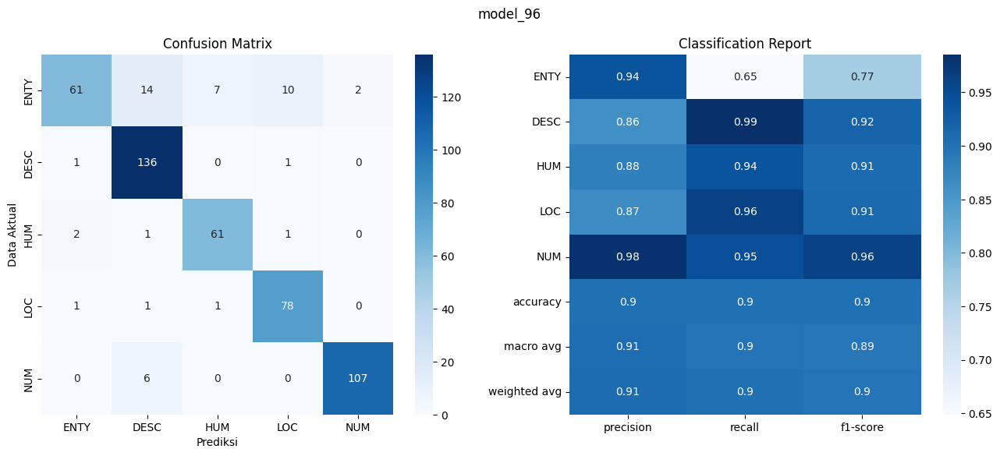

model logged

Scenario 97: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 97
early stopping implemented
traning is stopped by early stopping on epoch: 32
Test Loss: 0.2861, Test Acc: 0.9165

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.89      0.78      0.83        94
        DESC       0.94      0.96      0.95       138
         HUM       0.87      0.94      0.90        65
         LOC       0.89      0.98      0.93        81
         NUM       0.95      0.92      0.94       113

    accuracy                           0.92       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.92      0.92      0.92       491


Confusion Matrix:
[[ 73   4   7   6   4]
 [  4 133   0   0   1]
 [  2   1  61   1   0]
 [  1   0   1  79   0]
 [  2   3   1   3 104]]
Test accuracy: 0.9165


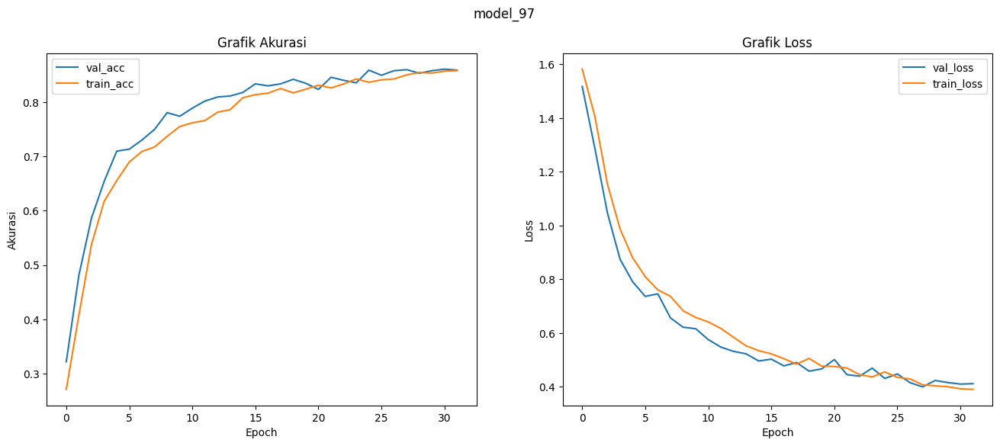

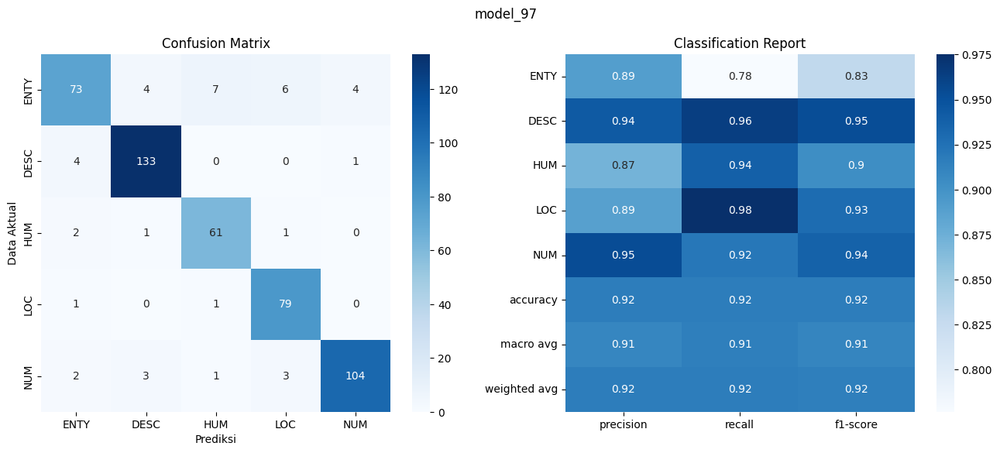

model logged

Scenario 98: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 98
early stopping implemented
traning is stopped by early stopping on epoch: 35
Test Loss: 0.2933, Test Acc: 0.9022

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.83      0.77      0.80        94
        DESC       0.91      0.95      0.93       138
         HUM       0.92      0.88      0.90        65
         LOC       0.91      0.93      0.92        81
         NUM       0.93      0.96      0.94       113

    accuracy                           0.90       491
   macro avg       0.90      0.89      0.90       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 72   6   4   6   6]
 [  7 131   0   0   0]
 [  5   2  57   1   0]
 [  3   1   0  75   2]
 [  0   4   1   0 108]]
Test accuracy: 0.9022


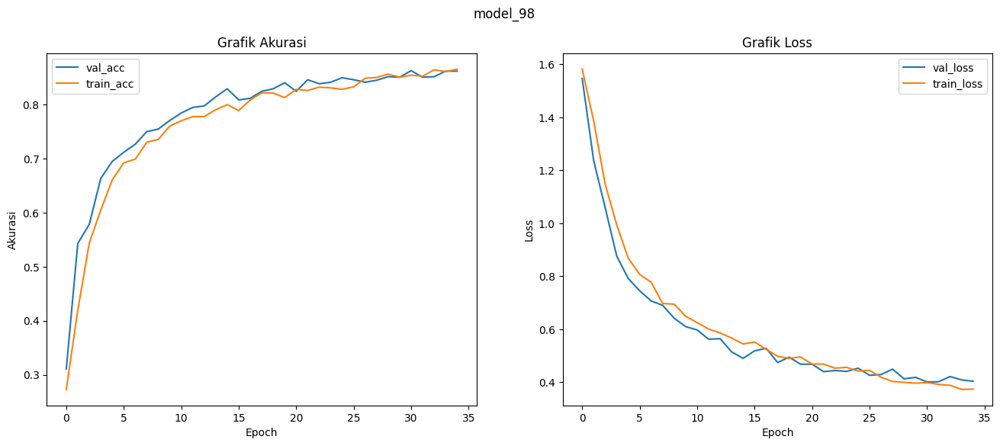

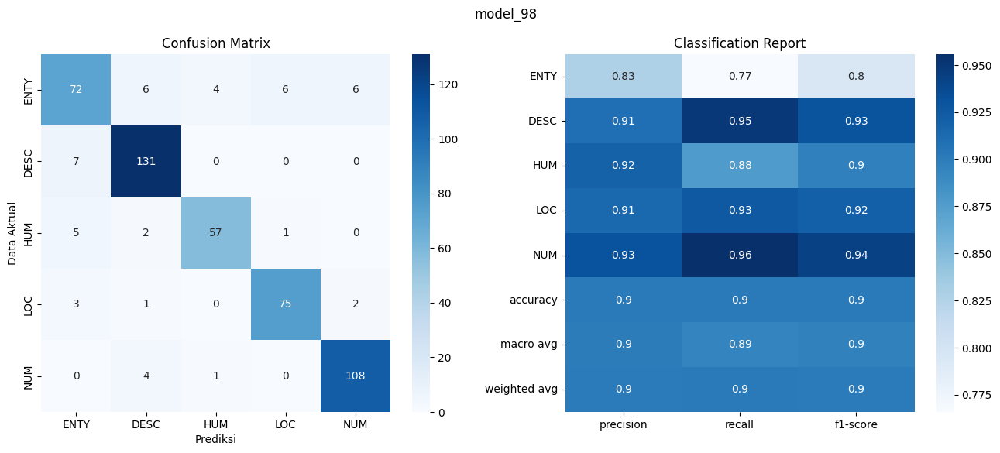

model logged

Scenario 99: {'vocabulary': 'use_lemma', 'drop_rate': 0.3, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 99
early stopping implemented
traning is stopped by early stopping on epoch: 43
Test Loss: 0.2510, Test Acc: 0.9165

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.85      0.79      0.82        94
        DESC       0.93      0.95      0.94       138
         HUM       0.91      0.94      0.92        65
         LOC       0.91      0.95      0.93        81
         NUM       0.96      0.95      0.96       113

    accuracy                           0.92       491
   macro avg       0.91      0.91      0.91       491
weighted avg       0.92      0.92      0.92       491


Confusion Matrix:
[[ 74   6   5   6   3]
 [  6 131   0   0   1]
 [  3   0  61   1   0]
 [  3   1   0  77   0]
 [  1   3   1   1 107]]
Test accuracy: 0.9165


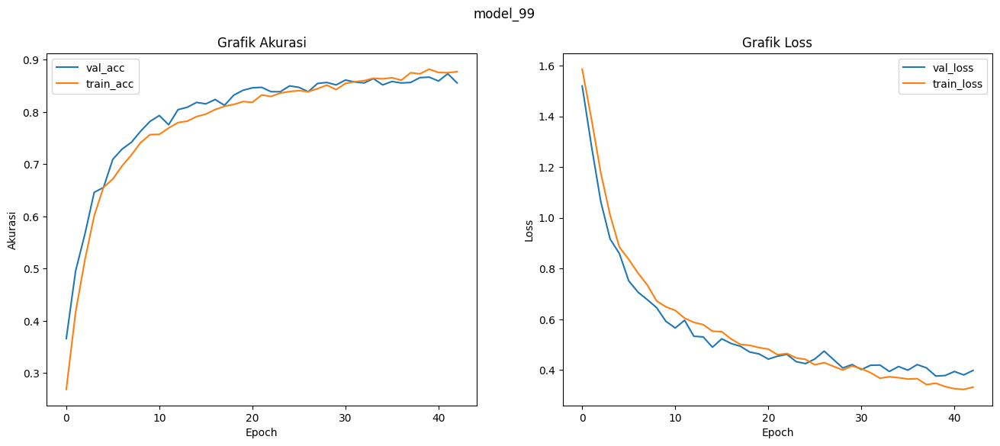

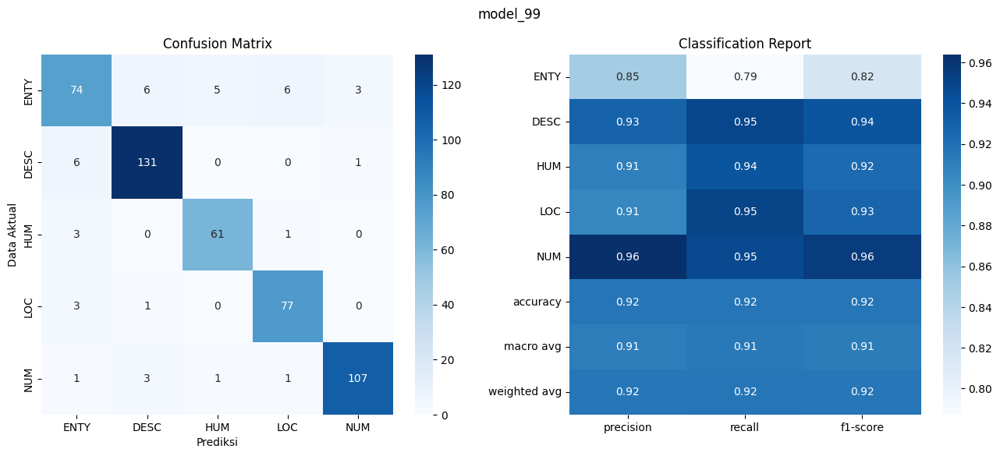

model logged

Scenario 100: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.01}
Starting training for scenario 100
early stopping implemented
traning is stopped by early stopping on epoch: 8
Test Loss: 1.6289, Test Acc: 0.1324

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.00      0.00      0.00        94
        DESC       0.00      0.00      0.00       138
         HUM       0.13      1.00      0.23        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.13       491
   macro avg       0.03      0.20      0.05       491
weighted avg       0.02      0.13      0.03       491


Confusion Matrix:
[[  0   0  94   0   0]
 [  0   0 138   0   0]
 [  0   0  65   0   0]
 [  0   0  81   0   0]
 [  0   0 113   0   0]]
Test accuracy: 0.1324


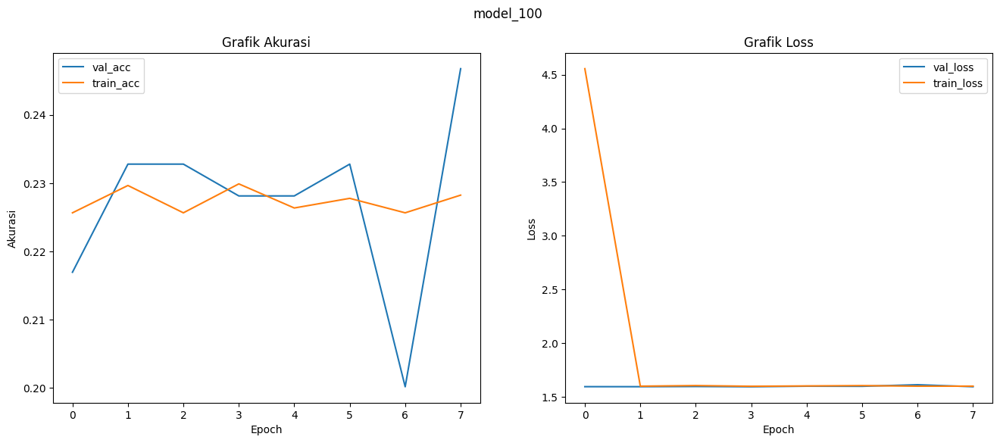

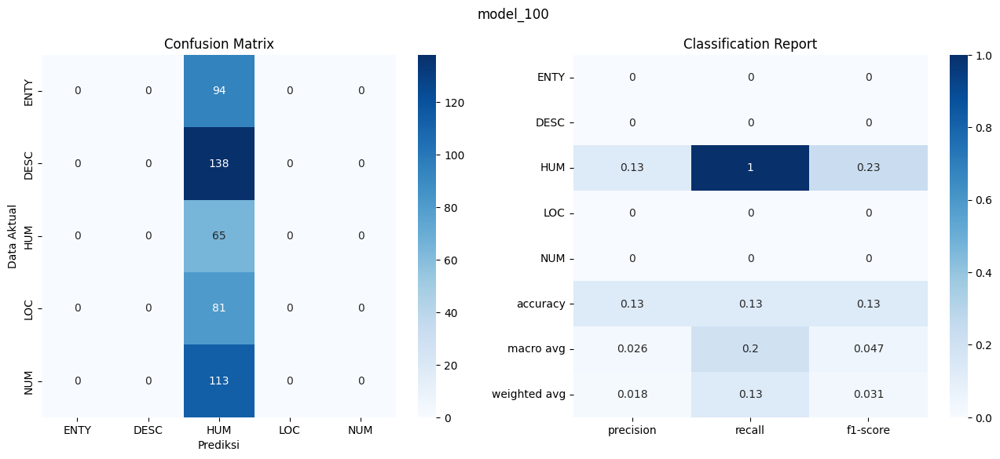

model logged

Scenario 101: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.001}
Starting training for scenario 101
early stopping implemented
traning is stopped by early stopping on epoch: 6
Test Loss: 1.6254, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


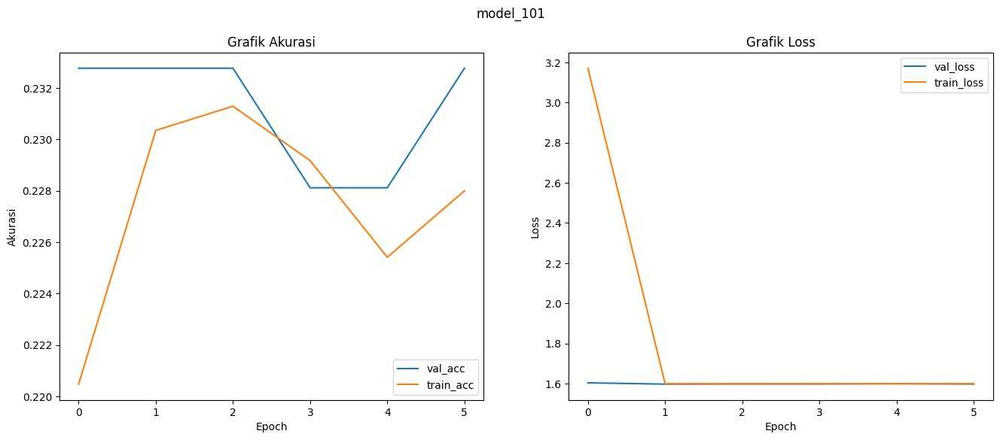

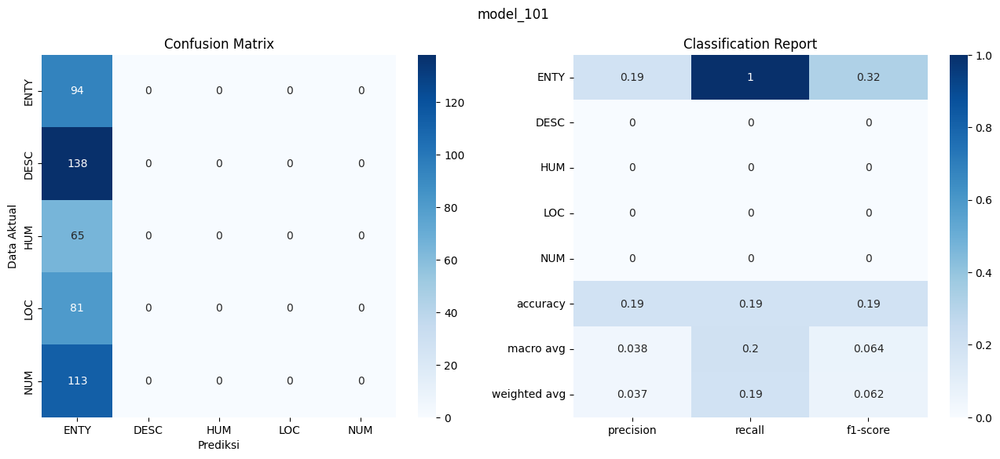

model logged

Scenario 102: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.01, 'weight_decay': 0.0001}
Starting training for scenario 102
early stopping implemented
traning is stopped by early stopping on epoch: 10
Test Loss: 1.6231, Test Acc: 0.1914

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.19      1.00      0.32        94
        DESC       0.00      0.00      0.00       138
         HUM       0.00      0.00      0.00        65
         LOC       0.00      0.00      0.00        81
         NUM       0.00      0.00      0.00       113

    accuracy                           0.19       491
   macro avg       0.04      0.20      0.06       491
weighted avg       0.04      0.19      0.06       491


Confusion Matrix:
[[ 94   0   0   0   0]
 [138   0   0   0   0]
 [ 65   0   0   0   0]
 [ 81   0   0   0   0]
 [113   0   0   0   0]]
Test accuracy: 0.1914


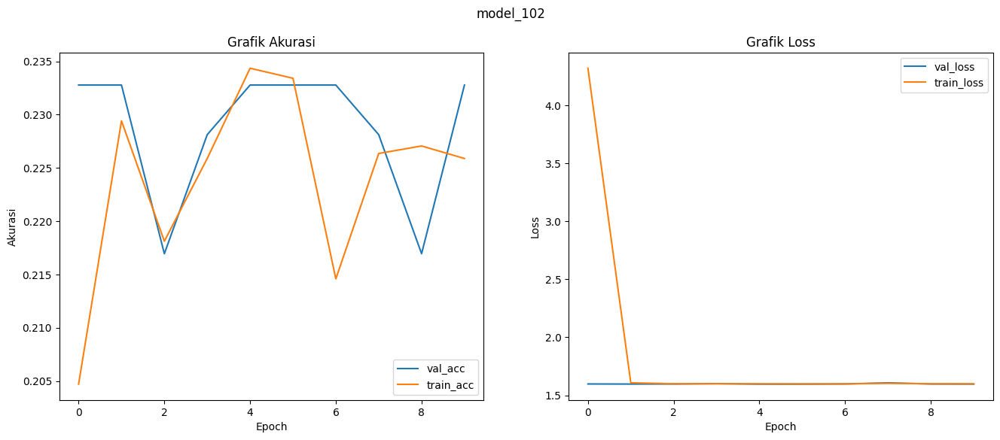

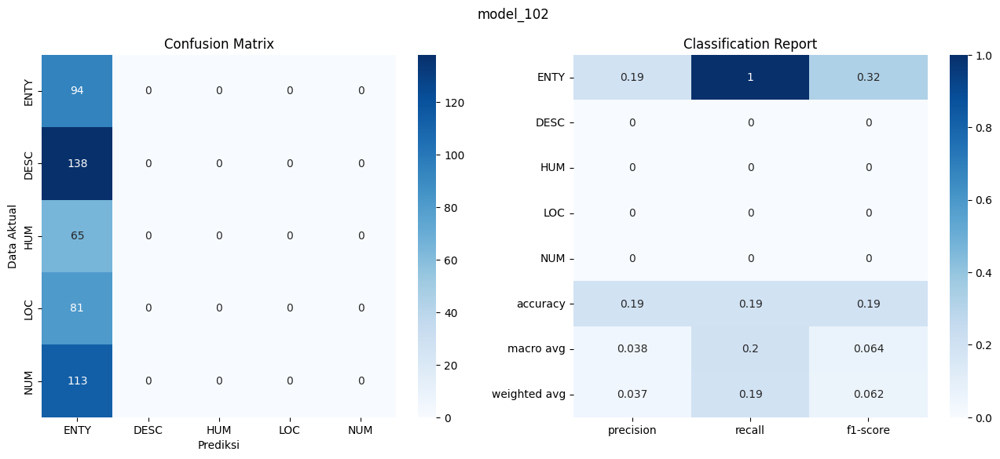

model logged

Scenario 103: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.01}
Starting training for scenario 103
early stopping implemented
traning is stopped by early stopping on epoch: 31
Test Loss: 0.1926, Test Acc: 0.9267

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.91      0.79      0.85        94
        DESC       0.92      0.97      0.95       138
         HUM       0.95      0.95      0.95        65
         LOC       0.87      0.98      0.92        81
         NUM       0.97      0.94      0.95       113

    accuracy                           0.93       491
   macro avg       0.93      0.93      0.92       491
weighted avg       0.93      0.93      0.93       491


Confusion Matrix:
[[ 74   7   3   8   2]
 [  3 134   0   0   1]
 [  2   0  62   1   0]
 [  2   0   0  79   0]
 [  0   4   0   3 106]]
Test accuracy: 0.9267


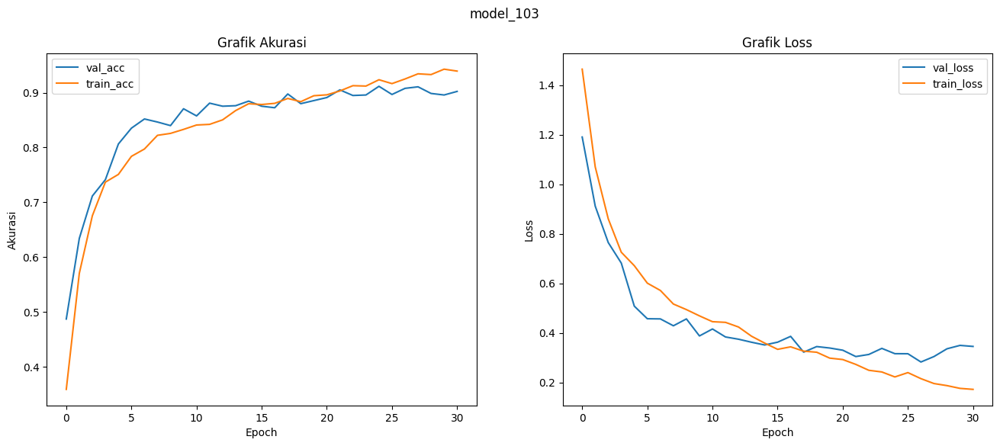

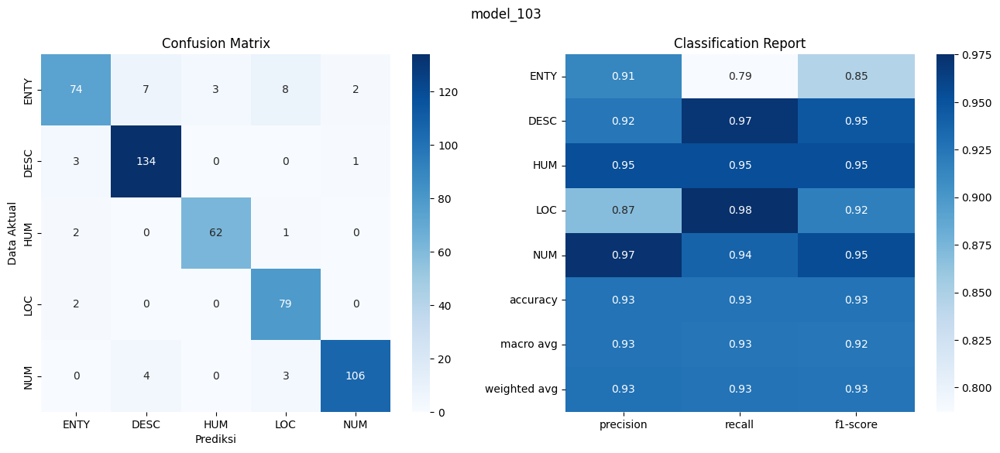

model logged

Scenario 104: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.001}
Starting training for scenario 104
early stopping implemented
traning is stopped by early stopping on epoch: 21
Test Loss: 0.3010, Test Acc: 0.8982

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.91      0.67      0.77        94
        DESC       0.82      0.99      0.90       138
         HUM       0.91      0.92      0.92        65
         LOC       0.91      0.98      0.94        81
         NUM       0.99      0.91      0.95       113

    accuracy                           0.90       491
   macro avg       0.91      0.89      0.90       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 63  19   4   7   1]
 [  2 136   0   0   0]
 [  4   0  60   1   0]
 [  0   1   1  79   0]
 [  0   9   1   0 103]]
Test accuracy: 0.8982


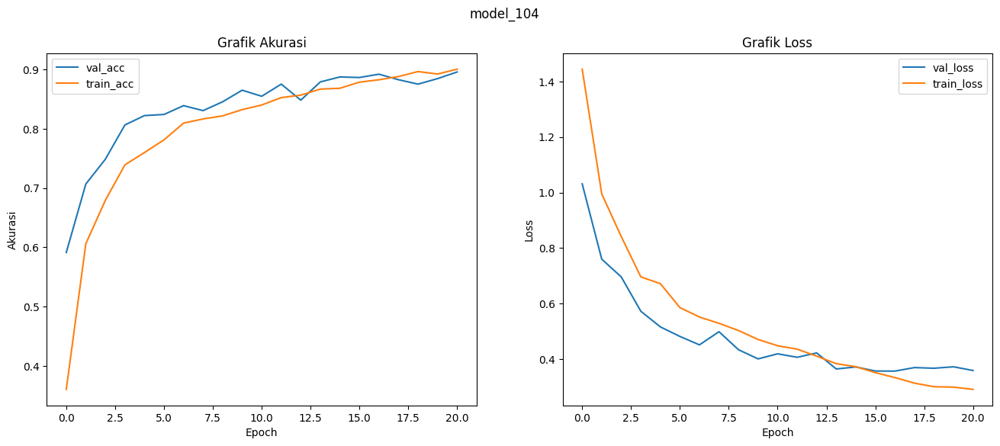

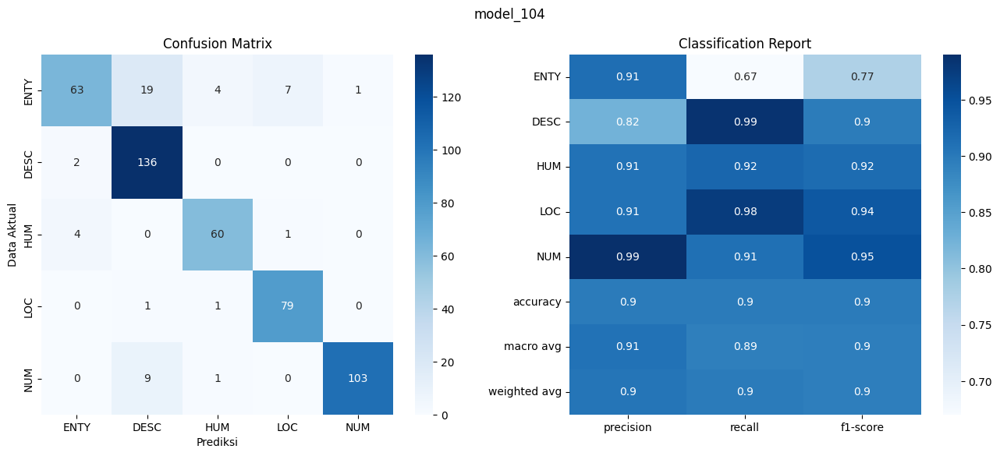

model logged

Scenario 105: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.001, 'weight_decay': 0.0001}
Starting training for scenario 105
early stopping implemented
traning is stopped by early stopping on epoch: 23
Test Loss: 0.2328, Test Acc: 0.9206

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.90      0.78      0.83        94
        DESC       0.92      0.96      0.94       138
         HUM       0.91      0.95      0.93        65
         LOC       0.88      0.98      0.92        81
         NUM       0.97      0.93      0.95       113

    accuracy                           0.92       491
   macro avg       0.92      0.92      0.92       491
weighted avg       0.92      0.92      0.92       491


Confusion Matrix:
[[ 73   6   6   7   2]
 [  4 133   0   0   1]
 [  2   0  62   1   0]
 [  1   1   0  79   0]
 [  1   4   0   3 105]]
Test accuracy: 0.9206


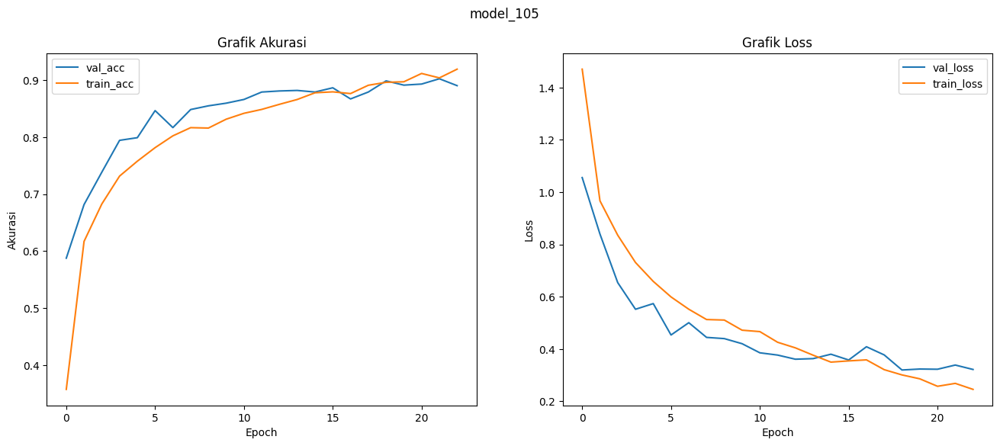

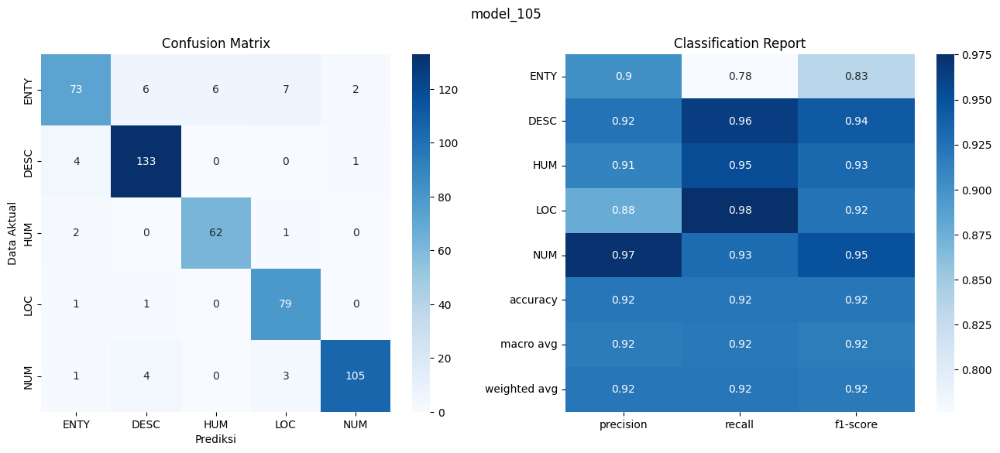

model logged

Scenario 106: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.01}
Starting training for scenario 106
early stopping implemented
traning is stopped by early stopping on epoch: 69
Test Loss: 0.2591, Test Acc: 0.9002

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.87      0.70      0.78        94
        DESC       0.93      0.96      0.94       138
         HUM       0.86      0.95      0.91        65
         LOC       0.85      0.98      0.91        81
         NUM       0.95      0.91      0.93       113

    accuracy                           0.90       491
   macro avg       0.89      0.90      0.89       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 66   6   9   9   4]
 [  6 132   0   0   0]
 [  2   0  62   1   0]
 [  1   0   0  79   1]
 [  1   4   1   4 103]]
Test accuracy: 0.9002


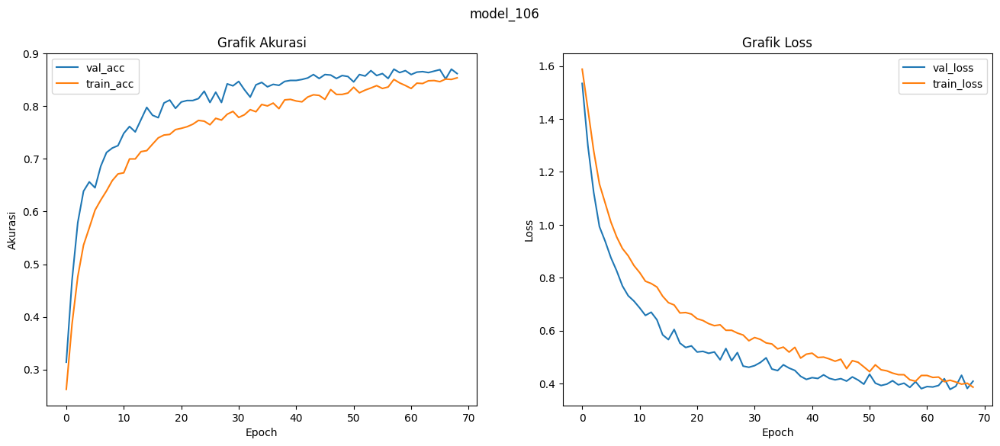

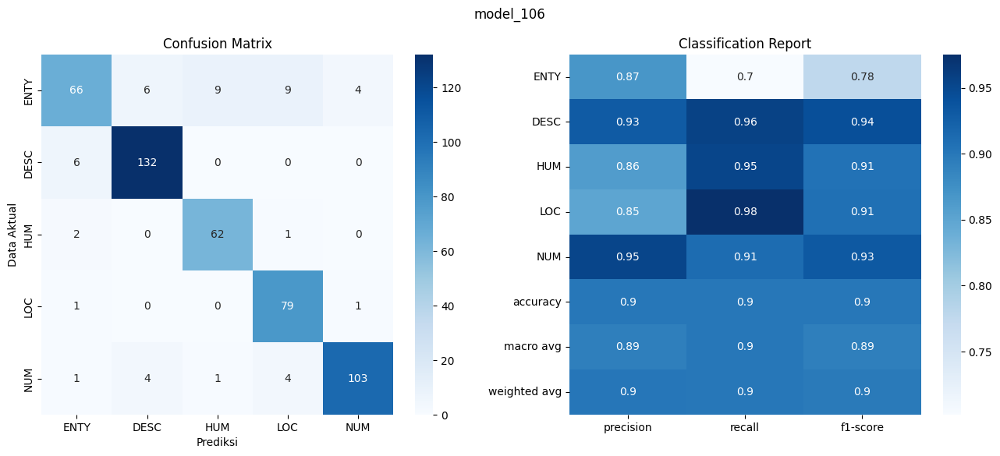

model logged

Scenario 107: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.001}
Starting training for scenario 107
early stopping implemented
traning is stopped by early stopping on epoch: 65
Test Loss: 0.2666, Test Acc: 0.9043

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.84      0.77      0.80        94
        DESC       0.91      0.96      0.94       138
         HUM       0.91      0.91      0.91        65
         LOC       0.88      0.95      0.91        81
         NUM       0.97      0.91      0.94       113

    accuracy                           0.90       491
   macro avg       0.90      0.90      0.90       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 72   7   5   7   3]
 [  5 133   0   0   0]
 [  4   1  59   1   0]
 [  3   1   0  77   0]
 [  2   4   1   3 103]]
Test accuracy: 0.9043


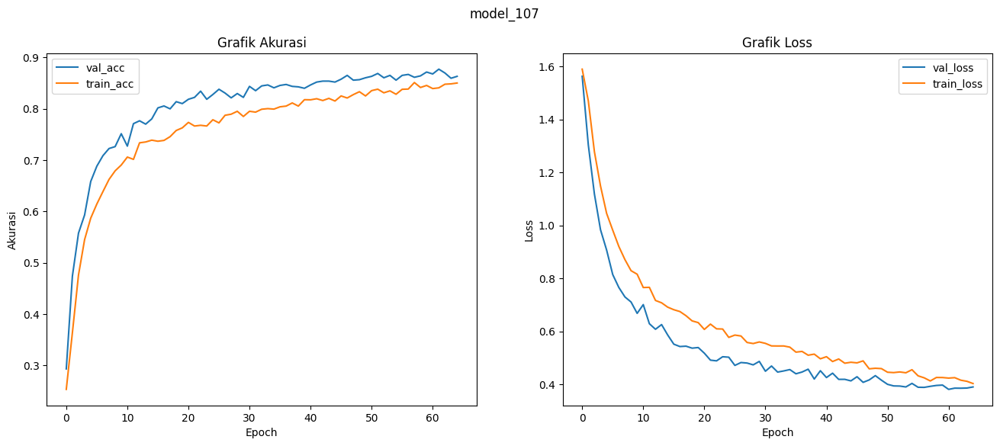

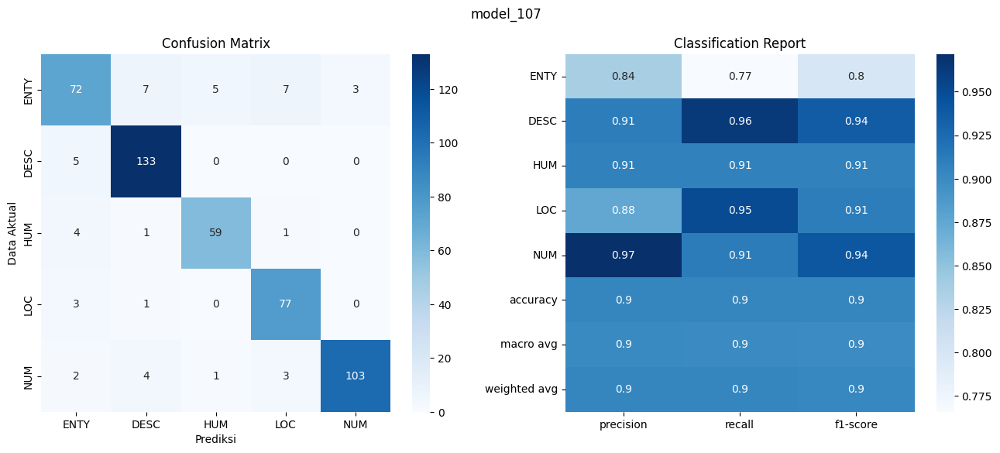

model logged

Scenario 108: {'vocabulary': 'use_lemma', 'drop_rate': 0.5, 'learning_rate': 0.0001, 'weight_decay': 0.0001}
Starting training for scenario 108
early stopping implemented
traning is stopped by early stopping on epoch: 54
Test Loss: 0.2858, Test Acc: 0.9002

Classification Report:
              precision    recall  f1-score   support

        ENTY       0.86      0.71      0.78        94
        DESC       0.92      0.96      0.94       138
         HUM       0.85      0.95      0.90        65
         LOC       0.86      0.95      0.90        81
         NUM       0.97      0.92      0.95       113

    accuracy                           0.90       491
   macro avg       0.89      0.90      0.89       491
weighted avg       0.90      0.90      0.90       491


Confusion Matrix:
[[ 67   7   9   8   3]
 [  6 132   0   0   0]
 [  2   0  62   1   0]
 [  2   1   1  77   0]
 [  1   3   1   4 104]]
Test accuracy: 0.9002


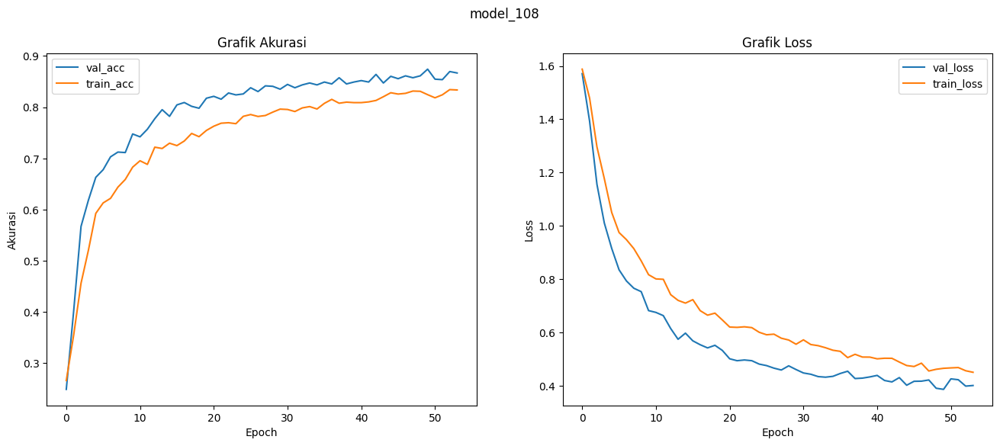

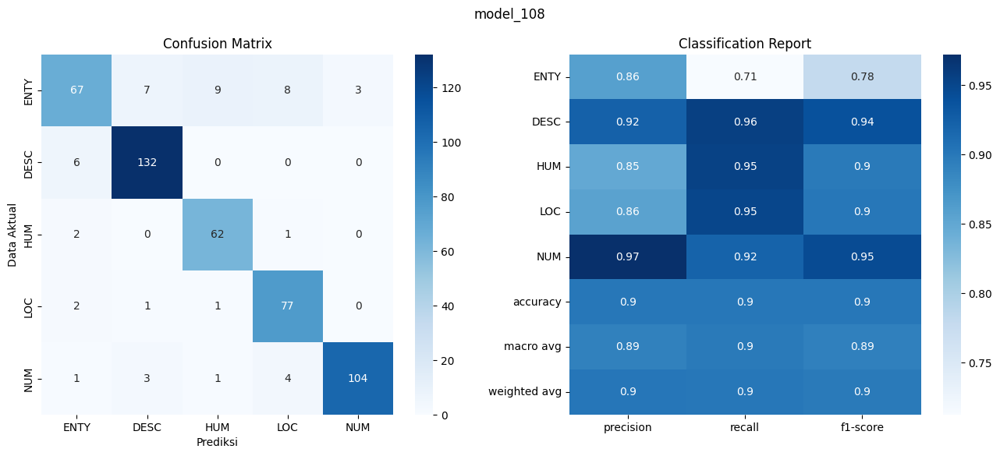

model logged

Grid search completed.


In [ ]:
# Grid search across all combinations
from itertools import product

# Get all combinations of hyperparameters
param_keys = list(scenario.keys())
param_values = list(product(*scenario.values()))

no = 0
folder = 'gridsearch'
csv_path = f'{folder}/gridsearch.csv'
if not os.path.exists(folder):
    os.mkdir(folder)

current_vocabulary = None
previous_vocabulary = ''

for i, param_set in enumerate(param_values):
    folder_path = f'{folder}/{i+1}'
    os.makedirs(folder_path, exist_ok=True)

    param_dict = dict(zip(param_keys, param_set))
    print(f"\nScenario {i+1}: {param_dict}")


    active_scenario = {
        'drop_rate': param_dict['drop_rate'],
        'learning_rate': param_dict['learning_rate'],
        'weight_decay': param_dict['weight_decay'],
        'n_heads': 1,
        'epoch': 100,
        'use_stopwords': False,
        'use_lemma': False,
        'use_stemming': False,
    }

    if param_dict['vocabulary'] == 'use_stopwords':
        active_scenario['use_stopwords'] = True
    elif param_dict['vocabulary'] == 'use_stemming':
        active_scenario['use_stemming'] = True
    elif param_dict['vocabulary'] == 'use_lemma':
        active_scenario['use_lemma'] = True

    # track current vcocabulary
    current_vocabulary = param_dict['vocabulary']

    # if current vocab is different than previous, create new data
    # if current_vocabulary != previous_vocabulary:
    active_scenario = update_current_scenario_vocab(active_scenario, current_vocabulary)
    train_loader, val_loader, test_loader, preprocessor = create_new_data(
        use_stopwords=active_scenario['use_stopwords'],
        use_lemma=active_scenario['use_lemma'],
        use_stemming=active_scenario['use_stemming'],
    )
    print('created new data with intervention:', param_dict['vocabulary'])

    cfg = {
        'drop_rate': active_scenario['drop_rate'],
        'output': 5,
        'bidirectional': True,
        'vocab_size': preprocessor.vocab_size,
        'context_length': 100,
        'emb_dim': 300,
        'hidden_size': 150,
        'qkv_bias': False,
        'n_heads': active_scenario['n_heads'],
        'device': device,
        'lstm_layers': 1,
    }

    model = ALSTMModel(cfg).to(device)
    model.embedding.weight.data.copy_(torch.from_numpy(preprocessor.embedding_matrix))
    model.embedding.weight.requires_grad = False

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=active_scenario['learning_rate'], weight_decay=active_scenario['weight_decay'])

    model_name = f"model_{i+1}"
    best_model_path = f"{folder_path}/{model_name}.pt"

    print(f"Starting training for scenario {i+1}")
    start_train = time.time()

    history = train_model(
        model=model,
        train_loader=train_loader,
        valid_loader=val_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
        num_epochs=active_scenario['epoch'],
        log=False,
        best_model_path=best_model_path,
        early_stop=5
    )

    total_train = time.time() - start_train
    formatted_time = f"{int(total_train) // 60:02d}:{int(total_train) % 60:02d}"

    model.load_state_dict(torch.load(best_model_path))
    model.to(device)

    test_loss, test_acc, report, conf_mat = evaluate_model(
        model=model,
        test_loader=test_loader,
        criterion=criterion,
        device=device,
        label_names=label_names,
        return_report=True
    )

    print(f"Test accuracy: {test_acc:.4f}")

    plot_model_history(
        history=history,
        title=model_name,
        save_path=f'{folder_path}/train_test_graph.png'
    )

    log_model_history(
        history,
        save_path=f'{folder_path}/train_valid_log.csv'
    )

    log_report_and_conf_mat(
        title=model_name,
        report=report,
        confusion_matrix=conf_mat,
        label_names=label_names,
        save_path=f'{folder_path}/classification_report_and_confusion_matrix.png'
    )

    log_model_train_grid_search(
        scenario_num=i+1,
        epoch=active_scenario['epoch'],
        total_epoch=len(history['train_accs']),
        drop_rate=active_scenario['drop_rate'],
        learning_rate=active_scenario['learning_rate'],
        weight_decay=active_scenario['weight_decay'],
        vocabulary=param_dict['vocabulary'],
        n_heads=active_scenario['n_heads'],
        vocabulary_total=preprocessor.vocab_size,
        train_acc=f"{history['train_accs'][-1]:.4f}",
        test_acc=test_acc,
        train_loss=f"{history['train_losses'][-1]:.4f}",
        test_loss=test_loss,
        time=formatted_time,
        file=csv_path,
    )

    del model
    del optimizer
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    torch.cuda.synchronize() if torch.cuda.is_available() else None
    # delete model weights
    os.remove(best_model_path)
    previous_vocabulary = current_vocabulary

print("\nGrid search completed.")